In [1]:
#pip install --upgrade --force-reinstall matplotlib

In [2]:
import pandas as pd
import numpy as np
import json
import re

In [3]:
import matplotlib as plt

In [4]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Učitavanje podataka

In [5]:
data_attrition=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [6]:
data_attrition

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


#### Proveravanje null vrednosti u skupu podataka

In [7]:
data_attrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
##### Proveravamo da li nam se u skupu podataka 
maska = data_attrition.isnull() | (data_attrition == '') | (data_attrition == 'None') | (data_attrition == ' ')

In [9]:
broj_null_vrednosti = maska.sum()
print(broj_null_vrednosti)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
### Provera duplikata je takodje jedna od tehnika koje su neophodne u generisanju i preprocesiranju modela mašinskog učenja
## Nekada se radi svesno oversemplovanje ili undersamplovanje skupa podataka za treniranje medjutim u ovom slučaju je
# bolje na početku proveriti i uveriti se da li u samom startu postoje vrednosti koje su duplirane
### 

In [10]:
podaci_duplirani= data_attrition.duplicated()

In [11]:
# SADA DA VIDIMO DA LI SU PODACI DUPLIRANI
data_attrition[podaci_duplirani]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [12]:
#-Podaci u početnom skupu podataka nisu duplirani i nalaze se normalno 

In [13]:
#### Provera unique vrednosti unutar kolona 
#### kako bi izbegle i izbrisale konstantne vrednosti u skupu podataka koje nisu korisne ili su neke informacije
### poput ID kolona koji nisu kasnije relevantne za analizu

In [12]:
data_attrition.shape

(1470, 35)

In [13]:
for kolona in data_attrition.columns:
    print(f"{kolona}: Ima jedinstvenih vrednosti {data_attrition[kolona].nunique()}")
    print("######################################################")

Age: Ima jedinstvenih vrednosti 43
######################################################
Attrition: Ima jedinstvenih vrednosti 2
######################################################
BusinessTravel: Ima jedinstvenih vrednosti 3
######################################################
DailyRate: Ima jedinstvenih vrednosti 886
######################################################
Department: Ima jedinstvenih vrednosti 3
######################################################
DistanceFromHome: Ima jedinstvenih vrednosti 29
######################################################
Education: Ima jedinstvenih vrednosti 5
######################################################
EducationField: Ima jedinstvenih vrednosti 6
######################################################
EmployeeCount: Ima jedinstvenih vrednosti 1
######################################################
EmployeeNumber: Ima jedinstvenih vrednosti 1470
######################################################
EnvironmentSatisfactio

In [14]:
for kolona in data_attrition.columns:
    if data_attrition[kolona].nunique()==1:
        print(f"{kolona}: Ima jednu jedinstvenu vrednosti {data_attrition[kolona].nunique()}")
        print("######################################################")
    elif data_attrition[kolona].nunique()==data_attrition.shape[0]:
        print(f"{kolona}: Ima sve različite vrednosti")
        print("######################################################")
        

EmployeeCount: Ima jednu jedinstvenu vrednosti 1
######################################################
EmployeeNumber: Ima sve različite vrednosti
######################################################
Over18: Ima jednu jedinstvenu vrednosti 1
######################################################
StandardHours: Ima jednu jedinstvenu vrednosti 1
######################################################


In [17]:
## pre nego što ove informacije budu iskorišćene za prečišćavanje skupa podataka možemo videti raspodelu

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'DailyRate'}>,
        <Axes: title={'center': 'DistanceFromHome'}>,
        <Axes: title={'center': 'Education'}>,
        <Axes: title={'center': 'EmployeeCount'}>],
       [<Axes: title={'center': 'EmployeeNumber'}>,
        <Axes: title={'center': 'EnvironmentSatisfaction'}>,
        <Axes: title={'center': 'HourlyRate'}>,
        <Axes: title={'center': 'JobInvolvement'}>,
        <Axes: title={'center': 'JobLevel'}>],
       [<Axes: title={'center': 'JobSatisfaction'}>,
        <Axes: title={'center': 'MonthlyIncome'}>,
        <Axes: title={'center': 'MonthlyRate'}>,
        <Axes: title={'center': 'NumCompaniesWorked'}>,
        <Axes: title={'center': 'PercentSalaryHike'}>],
       [<Axes: title={'center': 'PerformanceRating'}>,
        <Axes: title={'center': 'RelationshipSatisfaction'}>,
        <Axes: title={'center': 'StandardHours'}>,
        <Axes: title={'center': 'StockOptionLevel'}>,
        <Axe

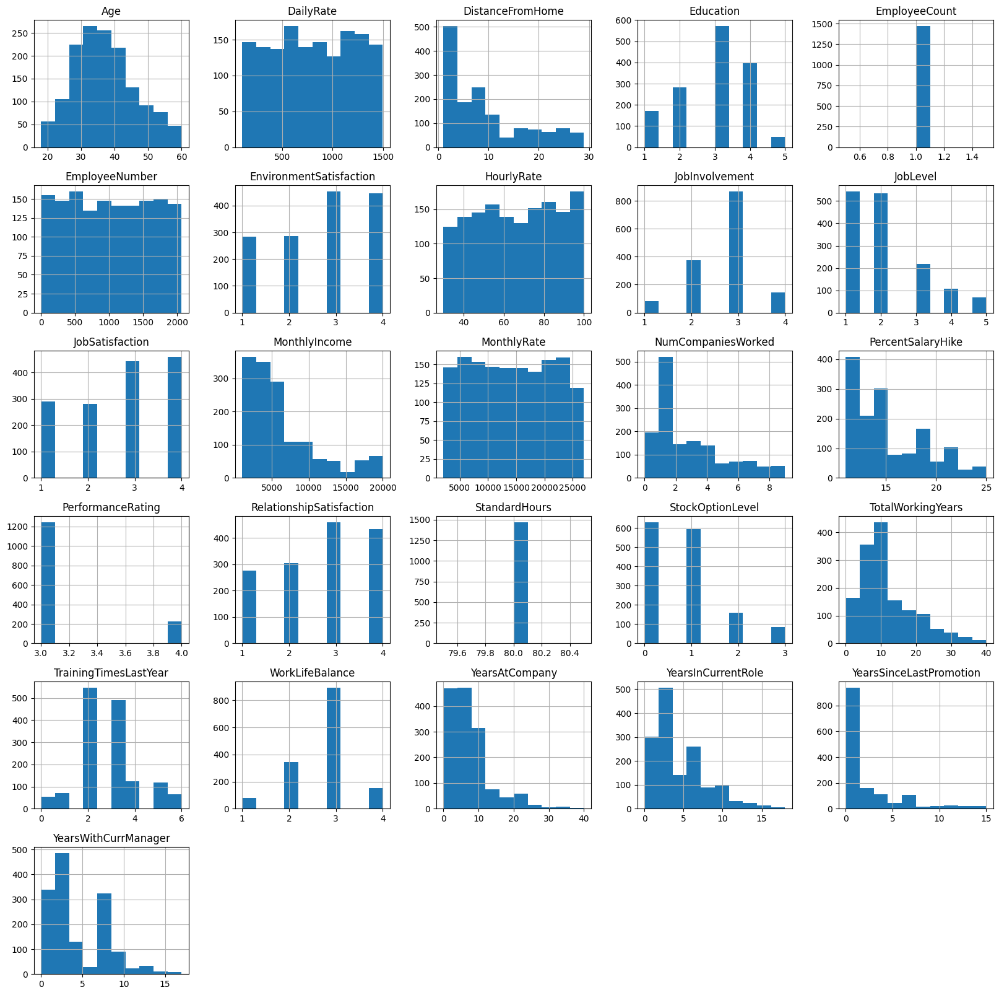

In [15]:
data_attrition.hist(figsize=(20,20))

In [19]:
# Na osnovu prikazanih histograma mogu se izneti sl. zaključci:
# - Dobra većina varijabli imaju distribuciju gde su krajevi raspodele izuzetno opterećeni,
## tako reći to su raspodele verovatnoća čiji repovi (krajevi) nisu eksponencijalno ograničeni. 
# To onda znači da oni opadaju sporije od ekponencijalne raspodele.
# u našem slučaju to bi značilo da većina varijabli ima raspodelu nakrivljenu na desno.
### Takođe vidimo da su neke varijable konstantne i da je moguće da se izbace i ne proučavaju dalje.

In [20]:
##### Ovde se zakljucuje da je neophodno ukoliti kolone koje imaju standardnu vrednost poput EmployeeCount, StandardHours Over18 a da
#varijabla EmployeeNumber predstavlja 

In [16]:
data_attrition.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True                      )

In [17]:
data_attrition.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [18]:
### yes - 1; no -0
label_encoder_output = LabelEncoder()
data_attrition['Attrition'] = label_encoder_output.fit_transform(data_attrition['Attrition'])

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [19]:
data_attrition.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [25]:
#data_attrition.head(5).to_csv("sample21.07.csv", index=False)

In [26]:
## sledeći korak je da se odradi uklanjanje outlier-a 
# - tu mogu da se koriste dve technike sada ćemo odraditi tehniku koriščenjem Z-score-a ali posto je takav vid uklanjanja oulier-a
## preporucljiv iskljucivo sa numerickim vrednostima potrebno je da se dobro razumeju sve kolone i shodno tome da se razdvoje
#### u odgovarajuće tipove podatka

In [20]:
data_attrition.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [21]:
numeričke_varijable=['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome',
                     'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears',
                    'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 
                    'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [22]:
kategoričke_nominalne=['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

In [23]:
izlazna_varijabla=['Attrition']

In [24]:
kategoričke_binarne=['Gender', 'OverTime']

In [25]:
kategoričke_ordinalne=['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 
                       'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction',
                       'StockOptionLevel', 'WorkLifeBalance']

In [26]:
sve_kategoricke=kategoričke_nominalne+kategoričke_binarne+kategoričke_ordinalne

In [34]:
###### Ispod je predstavljena tehnika otklanjanja outlier-a na osnovu z-scorea

In [27]:
data_attrition.shape

(1470, 31)

In [28]:
###
import numpy as np
from scipy import stats

In [29]:
########## IPAK JE POTREBNO UKLONITI OUTLIER-e tehnika menjanja oulier vrednosti sa donjim ili gornjim quantilom nije bila uspesna
z_skorovi = np.abs(stats.zscore(data_attrition[numeričke_varijable]))
data_attrition_outlier_cleaned = data_attrition[(z_skorovi < 3).all(axis=1)]

In [38]:
# def winsorize_series(series, lower_quantile=0.25, upper_quantile=0.75):
#     lower_bound = series.quantile(lower_quantile)
#     upper_bound = series.quantile(upper_quantile)
#     return np.clip(series, lower_bound, upper_bound)

In [39]:
# data_attrition_winsorized = data_attrition.copy()
# for var in numeričke_varijable:
#     data_attrition_winsorized[var] = winsorize_series(data_attrition[var])

In [40]:
# print(data_attrition_winsorized[numeričke_varijable].describe())

In [41]:
#data_attrition_outlier_cleaned =data_attrition_winsorized

In [30]:
data_attrition_outlier_cleaned.shape

(1387, 31)

In [43]:
#### Sledeći korak jeste feature engineering u kome ćemo dodati odredjene izvedene varijable


In [44]:
# data_attrition_obogacen= data_attrition_outlier_cleaned.copy()

In [45]:
# data_attrition_obogacen['YearsAtCompany_ManagerRatio'] = data_attrition_obogacen['YearsAtCompany'] / (data_attrition_obogacen['YearsWithCurrManager'] + 1)
# data_attrition_obogacen['SalaryIncreasePerYear']=(data_attrition_obogacen['MonthlyIncome']-data_attrition_obogacen['DailyRate']*22) / data_attrition_obogacen['YearsAtCompany']

In [31]:
data_attrition_obogacen=data_attrition_outlier_cleaned

In [32]:
data_attrition_obogacen.shape

(1387, 31)

In [49]:
### sada se dodaju ove dve numericke varijable u numericke varijable i onda je potrebno da će biti odradjena 
##odgovarajuća konverzija kategorickih varijabli u numerickih kao i skaliranje numerickih varijabli

In [50]:
# numeričke_varijable.append('YearsAtCompany_ManagerRatio')
# numeričke_varijable.append('SalaryIncreasePerYear')

In [33]:
numeričke_varijable

['Age',
 'DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [52]:
##### konverzija kategorickih u numericke

In [53]:
### prvo kategoricke ordinalne konvertujemo u ordinal varijable

In [34]:
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [35]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [36]:
from tqdm import tqdm

In [37]:
from sklearn.preprocessing import OneHotEncoder

one_hot_encoder = OneHotEncoder(sparse=False, drop='first')
nominalne_kategorije = ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

one_hot_encoded = one_hot_encoder.fit_transform(data_attrition_obogacen[nominalne_kategorije])
one_hot_encoded_df = pd.DataFrame(one_hot_encoded, columns=one_hot_encoder.get_feature_names_out(nominalne_kategorije))

In [38]:
print(data_attrition_obogacen.shape)
print(one_hot_encoded_df.shape)

(1387, 31)
(1387, 19)


In [40]:
data_attrition_obogacen.reset_index(drop=True, inplace=True)
one_hot_encoded_df.reset_index(drop=True, inplace=True)

In [41]:
one_hot_encoded_df

,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [42]:
new_nominal_kategorije=list(one_hot_encoded_df.columns)

In [43]:
new_nominal_kategorije

['BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'MaritalStatus_Married',
 'MaritalStatus_Single']

In [44]:
one_hot_encoder.get_feature_names_out(nominalne_kategorije)

array(['BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'JobRole_Sales Representative', 'MaritalStatus_Married',
       'MaritalStatus_Single'], dtype=object)

In [45]:
data_attrition_obogacen = pd.concat([data_attrition_obogacen, one_hot_encoded_df], axis=1)
print(data_attrition_obogacen.isnull().sum())

Age                                  0
Attrition                            0
BusinessTravel                       0
DailyRate                            0
Department                           0
DistanceFromHome                     0
Education                            0
EducationField                       0
EnvironmentSatisfaction              0
Gender                               0
HourlyRate                           0
JobInvolvement                       0
JobLevel                             0
JobRole                              0
JobSatisfaction                      0
MaritalStatus                        0
MonthlyIncome                        0
MonthlyRate                          0
NumCompaniesWorked                   0
OverTime                             0
PercentSalaryHike                    0
PerformanceRating                    0
RelationshipSatisfaction             0
StockOptionLevel                     0
TotalWorkingYears                    0
TrainingTimesLastYear    

In [46]:
data_attrition_obogacen

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [47]:

data_attrition_obogacen.drop(columns=nominalne_kategorije, inplace=True)


In [48]:
data_attrition_obogacen

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,Female,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,Male,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,Male,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,Female,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,Male,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,884,23,2,3,Male,41,4,2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,613,6,1,4,Male,42,2,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,155,4,3,2,Male,87,4,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,1023,2,3,4,Male,63,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [49]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobR

In [50]:
kategoricke_bez_nominalnih = kategoričke_binarne+kategoričke_ordinalne

In [51]:
le = LabelEncoder()
l1 = []; l2 = []; text_categorical_features = []
label_encoders={}
print('Pretvaranje kategorickih varijabli ')
for i in tqdm(kategoricke_bez_nominalnih):
    if type(data_attrition_obogacen[i][0]) == str:
        text_categorical_features.append(i)
        data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
        label_encoders[i]=le
        l1.append(list(data_attrition_obogacen[i].unique())); l2.append(list(le.inverse_transform(data_attrition_obogacen[i].unique())))
        print(i,' : ',data_attrition_obogacen[i].unique(),' = ',le.inverse_transform(data_attrition_obogacen[i].unique()))

Pretvaranje kategorickih varijabli 


100%|██████████| 11/11 [00:00<00:00, 1832.59it/s]

Gender  :  [0 1]  =  ['Female' 'Male']
OverTime  :  [1 0]  =  ['Yes' 'No']


In [52]:
data_attrition_obogacen

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,0,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,1,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,1,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,0,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,1,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,884,23,2,3,1,41,4,2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,613,6,1,4,1,42,2,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,155,4,3,2,1,87,4,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,1023,2,3,4,1,63,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [72]:
# tf1 = {}
# for i in range(len(text_categorical_features)):
#     tf1[text_categorical_features[i]] = {}
#     for j,k in zip(l1[i],l2[i]):
#         tf1[text_categorical_features[i]][j] = k

In [73]:
# label_encoders = {}
# for kolona in kategoričke_ordinalne:
#     le = LabelEncoder()
#     data_attrition_obogacen[kolona] = le.fit_transform(data_attrition_obogacen[kolona])
#     label_encoders[kolona] = le

In [74]:
# data_attrition_obogacen = pd.get_dummies(data_attrition_obogacen, columns= kategoričke_nominalne + kategoričke_binarne, drop_first=True)

In [75]:
#### Sada se koristi Standard Scaler za skaliranje numerickih varijabli

In [76]:
# ###3 ! ovo je zbog izvedenih varijabli 
# data_attrition_obogacen.replace([np.inf, -np.inf], np.nan, inplace=True)
# data_attrition_obogacen.dropna(inplace=True)

In [77]:
# data_attrition_obogacen.shape

In [53]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobR

In [79]:
#data_attrition_obogacen.to_excel("data_attrition_obogacen.xlsx")

In [80]:
################## final kolone

In [54]:
data_attrition_obogacen.head(5)

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,0,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,1,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,1,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,0,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,1,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [55]:
data_attrition_obogacen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1387 entries, 0 to 1386
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1387 non-null   int64  
 1   Attrition                          1387 non-null   int32  
 2   DailyRate                          1387 non-null   int64  
 3   DistanceFromHome                   1387 non-null   int64  
 4   Education                          1387 non-null   int64  
 5   EnvironmentSatisfaction            1387 non-null   int64  
 6   Gender                             1387 non-null   int32  
 7   HourlyRate                         1387 non-null   int64  
 8   JobInvolvement                     1387 non-null   int64  
 9   JobLevel                           1387 non-null   int64  
 10  JobSatisfaction                    1387 non-null   int64  
 11  MonthlyIncome                      1387 non-null   int64

In [56]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif,chi2

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

In [58]:
colors = ['#D8BFD8', '#FFFFFF']

In [59]:
sve_kategoricke_new = kategoricke_bez_nominalnih + new_nominal_kategorije

In [60]:
kolone_ulazne= list(data_attrition_obogacen.columns)
kolone_ulazne.remove('Attrition')

In [61]:
f1 = data_attrition_obogacen.loc[:, kolone_ulazne]
t1 = data_attrition_obogacen.loc[:, 'Attrition']

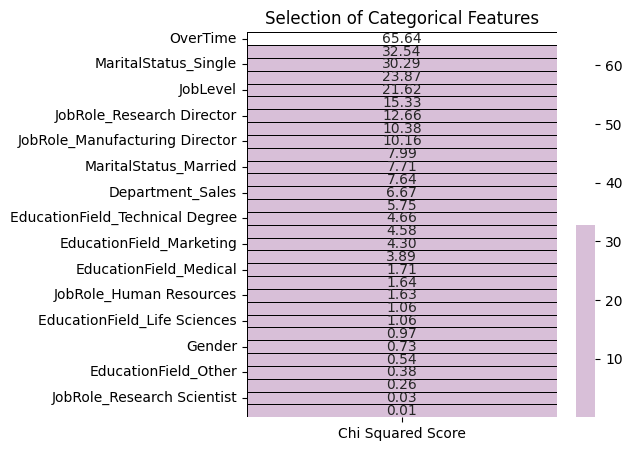

In [62]:
features = data_attrition_obogacen.loc[:,sve_kategoricke_new]
target = pd.DataFrame(t1)

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

In [63]:
mali_hi_kvadrat_score = featureScores[featureScores['Chi Squared Score'] < 5]


In [64]:
mali_hi_kvadrat_score

,Chi Squared Score
Gender,0.725432
Education,0.535825
JobInvolvement,4.577980
PerformanceRating,0.006621
RelationshipSatisfaction,1.642923
WorkLifeBalance,0.973851
BusinessTravel_Travel_Rarely,1.059134
Department_Research & Development,3.890848
EducationField_Life Sciences,1.056165
EducationField_Marketing,4.301550


In [65]:
from sklearn.feature_selection import SelectKBest, f_classif

In [66]:
features = f1[numeričke_varijable]
target = pd.DataFrame(t1)

In [67]:
best_features = SelectKBest(score_func=f_classif, k='all')
fit = best_features.fit(features, target)

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [68]:
feature_scores = pd.DataFrame({
    'Feature': features.columns,
    'ANOVA Score': fit.scores_
})
sorted_feature_scores = feature_scores.sort_values(by='ANOVA Score', ascending=False)

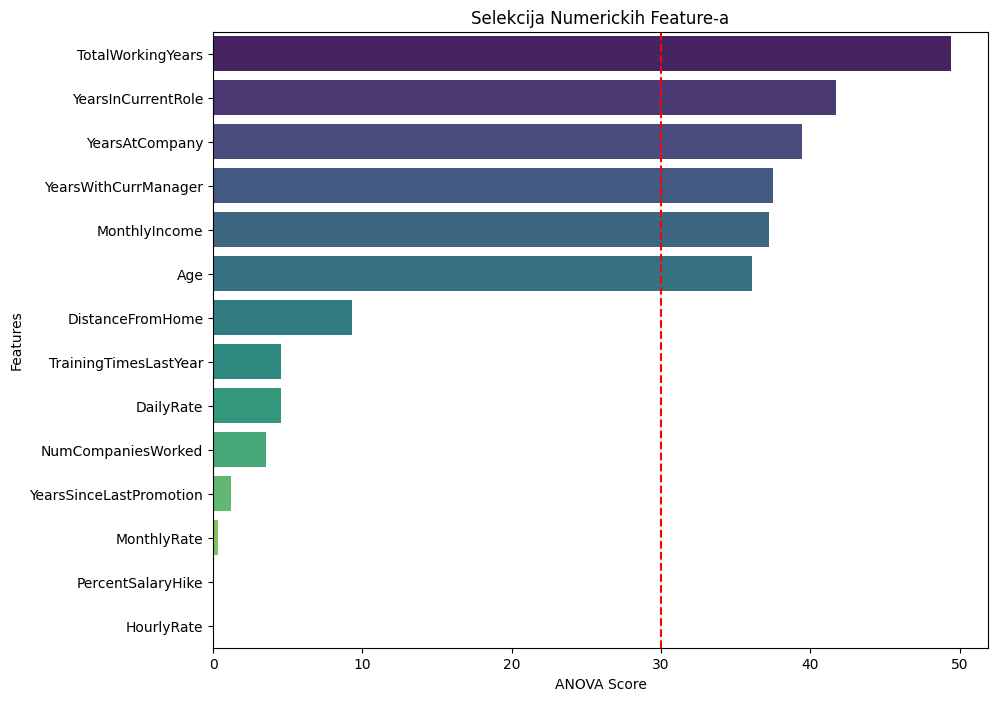

In [69]:
plt.figure(figsize=(10, 8))
sns.barplot(x='ANOVA Score', y='Feature', data=sorted_feature_scores, palette='viridis')
plt.axvline(x=30, color='red', linestyle='--')
plt.title('Selekcija Numerickih Feature-a')
plt.xlabel('ANOVA Score')
plt.ylabel('Features')
plt.show()

In [70]:
mali_anova_score = feature_scores[feature_scores['ANOVA Score'] < 30]
list(mali_anova_score['Feature'].values)

['DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'TrainingTimesLastYear',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion']

In [71]:
mali_anova_score_kolone=list(mali_anova_score['Feature'].values)

In [72]:
mali_hi_kvadrat_score.columns

Index(['Chi Squared Score'], dtype='object')

In [73]:
mali_hi_kvadrat_score_kolone=list(mali_hi_kvadrat_score.index.values)

In [74]:
mali_hi_kvadrat_score_kolone

['Gender',
 'Education',
 'JobInvolvement',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'WorkLifeBalance',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive']

In [75]:
kolone_za_brisanje=mali_anova_score_kolone+mali_hi_kvadrat_score_kolone

In [76]:
len(kolone_za_brisanje)

25

In [77]:
f1.shape

(1387, 44)

In [78]:
data_attrition_obogacen=data_attrition_obogacen.drop(columns = kolone_za_brisanje)

In [79]:
import imblearn
from imblearn.pipeline import Pipeline
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [80]:
kolone_ulazne= list(data_attrition_obogacen.columns)
kolone_ulazne.remove('Attrition')

In [81]:
f1 = data_attrition_obogacen.loc[:, kolone_ulazne]
t1 = data_attrition_obogacen.loc[:, 'Attrition']

In [82]:
from sklearn.model_selection import train_test_split

In [83]:
x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size=0.2, random_state=2)


In [84]:
over = SMOTE(sampling_strategy=0.85)

In [85]:
steps = [('over', over)]

In [86]:
pipeline = Pipeline(steps=steps)


In [87]:
x_train

,Age,EnvironmentSatisfaction,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,Department_Sales,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
1259,28,2,1,2,2856,0,1,1,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
1309,31,4,2,1,5003,0,0,10,10,8,7,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1039,48,3,2,3,6439,0,1,18,8,7,7,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
504,40,4,3,1,10475,1,1,20,18,13,12,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
732,21,3,1,1,1416,0,0,1,1,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,27,3,1,1,3041,0,1,5,4,3,2,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
299,27,3,1,2,2478,1,0,4,4,3,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
493,37,4,1,4,4680,0,0,4,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
527,35,4,2,1,5093,0,1,16,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [88]:
x_train_balansiran, y_train_balansiran = pipeline.fit_resample(x_train, y_train)

In [89]:
x_train = x_train_balansiran
y_train = y_train_balansiran

In [117]:
# from sklearn.model_selection import train_test_split

# x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size = 0.15, random_state = 2)

In [90]:
x_train_test = x_train.copy(deep = True)
x_train_test['Attrition'] = y_train

In [91]:
x_train

,Age,EnvironmentSatisfaction,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,Department_Sales,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,28,2,1,2,2856,0,1,1,1,0,0,0.000000,1.000000,0.0,0.0,0.000000,0.0,1.0,1.000000,0.000000
1,31,4,2,1,5003,0,0,10,10,8,7,1.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,1.000000,0.000000
2,48,3,2,3,6439,0,1,18,8,7,7,0.000000,1.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
3,40,4,3,1,10475,1,1,20,18,13,12,1.000000,1.000000,0.0,0.0,0.000000,0.0,0.0,1.000000,0.000000
4,21,3,1,1,1416,0,0,1,1,0,0,0.000000,0.000000,1.0,0.0,0.000000,0.0,0.0,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1706,39,1,4,3,12597,0,1,21,10,4,2,0.582149,0.417851,0.0,0.0,0.000000,0.0,0.0,0.000000,0.417851
1707,42,3,2,2,4884,0,1,8,6,2,5,0.000000,0.000000,0.0,0.0,0.659939,0.0,0.0,1.000000,0.000000
1708,48,3,1,3,2662,1,1,14,7,5,5,0.722415,1.000000,0.0,0.0,0.000000,0.0,1.0,1.000000,0.000000
1709,30,1,1,2,2437,1,0,7,3,0,2,0.865500,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,1.000000


In [92]:
x_train.columns

Index(['Age', 'EnvironmentSatisfaction', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'OverTime', 'StockOptionLevel', 'TotalWorkingYears',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'Department_Sales',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Sales Representative', 'MaritalStatus_Married',
       'MaritalStatus_Single'],
      dtype='object')

In [121]:
############### NACIN skaliranja varijabli prvo cemo uraditi normalizaciju

In [93]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [94]:
min_max_scaler = MinMaxScaler()

In [124]:
#standard_scaler = StandardScaler()

In [95]:
kolone_za_normalizaciju = ['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

In [126]:
#kolone_za_standardizaciju = ['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'OverTime', 'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance']

In [96]:
standard_scalers = {}
min_max_scalers = {}

In [128]:
# for col in kolone_za_standardizaciju:
#     x_train[col] = standard_scaler.fit_transform(x_train[[col]])
#     x_test[col] = standard_scaler.transform(x_test[[col]])
#     standard_scalers[col] = standard_scaler

In [97]:
for col in kolone_za_normalizaciju:
    x_train[col] = min_max_scaler.fit_transform(x_train[[col]])
    x_test[col] = min_max_scaler.transform(x_test[[col]])
    min_max_scalers[col] = min_max_scaler

### MODELIRANJE

In [98]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc



In [131]:
##### Posto ce se koristiti mnogi modeli kako se kod ne bi preklapao postojace funkcije koje rade 
# izggradnju modela prikaz kros validacijskog scora i prikaz evaluacionih metrika

In [99]:
import matplotlib.pyplot as plt

In [100]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, precision_score, recall_score, f1_score, precision_recall_curve

In [101]:
boje_za_grafikone= ['#8A2BE2','#D02090']

#### Modelovanje bez hiperparametrizacije

In [102]:
def prikazivanje_roc_auc_krive(model, x_test, y_test, y_pred_proba):
    #y_prob = model.predict_proba(x_test)[:,1]

    FPR,TPR, thresholds = roc_curve(y_test, y_pred_proba)

    roc_auc = auc(FPR,TPR)
    plt.figure()
    plt.plot(FPR, TPR, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='violet', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC kriva')
    plt.legend(loc="lower right")
    plt.show()

In [103]:
def krosvalidacija_i_prikaz_roc_auc_krive(model, x_train, y_train, x_test, y_test, y_pred, y_pred_proba):
    ##### Krosvalidacija i pracenje krosvalidacionog score-a
    cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state=1)
    kros_validacioni_score=cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()
    print("Krosvalidacioni scopre: ",'{0:.2%}'.format(cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,y_pred_proba)))

    ############### SADA SE PRINTA ROC_AUC KRIVA
    prikazivanje_roc_auc_krive (model, x_test, y_test, y_pred_proba)
    return kros_validacioni_score

In [104]:
def evaluacija_modela_metrike(ime_modela,y_test, y_pred, y_pred_prob):

    print("#################################")
    accuracy=accuracy_score(y_test, y_pred)
    print(f"Accuracy (Tačnost): {accuracy_score(y_test, y_pred)}")
    print("#################################")
    precision_= precision_score(y_test, y_pred)
    print(f"Precision (Preciznost): {precision_score(y_test, y_pred)}")
    print("#################################")
    recall_ = recall_score(y_test, y_pred)
    print(f"Recall(odziv): {recall_score(y_test, y_pred)}")
    print("###############################")
    f1_score_=f1_score(y_test, y_pred)
    print(f"F1 Score: {f1_score(y_test, y_pred)}")
    roc_auc_score_=roc_auc_score(y_test, y_pred_prob)
    print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob)}")
    print(f"Confusion Matrix (matrica konfuzije):\n{confusion_matrix(y_test, y_pred)}")
    print(f"Classification Report (klasifikacijski izvestaj):\n{classification_report(y_test, y_pred)}\n")

    ###### printing the confusion matrix
    plt.figure(figsize=(4, 4))
    matrica_konfuzije= confusion_matrix(y_test, y_pred)
    falseNegativi=matrica_konfuzije[1,0]
    ## IZMENJENA MATRICA RADI INTUITIVNIJEG PRIKAZA
    konvertovana_matrica = np.fliplr(np.flipud(matrica_konfuzije))
    
    sns.heatmap(konvertovana_matrica, annot=True, fmt='d', cmap=boje_za_grafikone, xticklabels=['Attrition', 'No Attrition'], yticklabels=['Attrition', 'No Attrition'])
    plt.xlabel('Predvidjena')
    plt.ylabel('Stvarna')
    plt.title(f'Matrica konfuzuje za model {ime_modela}')
    plt.show()
    
    ##### izvestaj klasifikacije 
    print(classification_report(y_test,y_pred))

    precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=f' Grafik za model{ime_modela}',  color='violet')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall kriva za  {ime_modela}')
    plt.legend()
    plt.show()
    return accuracy, precision_, recall_,f1_score_,roc_auc_score_,falseNegativi

    

In [105]:
def prikaz_znacajnosti_atributa(model, model_name, feature_names):
    if hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[0], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        ###############################
        top_tri_aributa = np.array(feature_names)[sorted_idx][-3:]
        return top_tri_aributa.tolist()
    elif hasattr(model, 'coef_'):
        importance = model.coef_[0]
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[1], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        top_tri_aributa = np.array(feature_names)[sorted_idx][-3:]
        return top_tri_aributa.tolist()
    else:
        print("Model nema podržanu značajnost attributa")
        return []

In [106]:
#########################
REZULTATI_TABELA = pd.DataFrame(columns=["Ime modela","Accuracy", "Precision", "Recall", "F1-score", "ROC_AUC_SCORE", "KrosvalidacioniScore", "FALSE NEGATIVI", "HIPERPARAMETRIZACIJA", "NAJBOLJI PARAMETRI","NAJZNACAJNIJI ATRIBUTI"])
#REZULTATI_TABELA = {}
feature_names = x_train.columns

#### Model logisticke regresije

In [107]:
from sklearn.linear_model import LogisticRegression

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

########### MODEL LOGISTICKE REGRESIJE ###########


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

Krosvalidacioni scopre:  86.28%
ROC_AUC Score :  80.98%


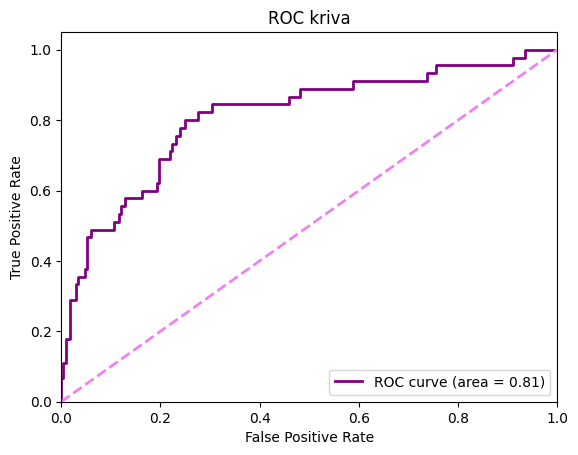

#################################
Accuracy (Tačnost): 0.7913669064748201
#################################
Precision (Preciznost): 0.40298507462686567
#################################
Recall(odziv): 0.6
###############################
F1 Score: 0.48214285714285715
ROC AUC: 0.8098235574630425
Confusion Matrix (matrica konfuzije):
[[193  40]
 [ 18  27]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.83      0.87       233
           1       0.40      0.60      0.48        45

    accuracy                           0.79       278
   macro avg       0.66      0.71      0.68       278
weighted avg       0.83      0.79      0.81       278




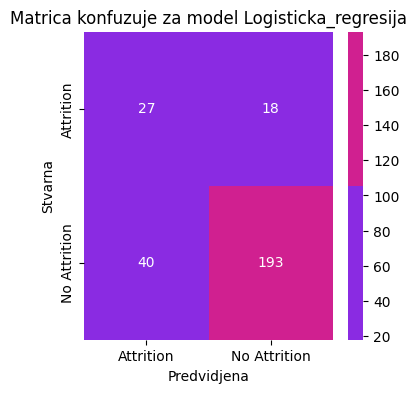

              precision    recall  f1-score   support

           0       0.91      0.83      0.87       233
           1       0.40      0.60      0.48        45

    accuracy                           0.79       278
   macro avg       0.66      0.71      0.68       278
weighted avg       0.83      0.79      0.81       278



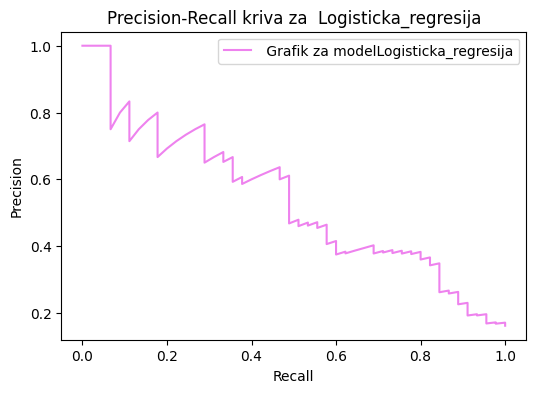

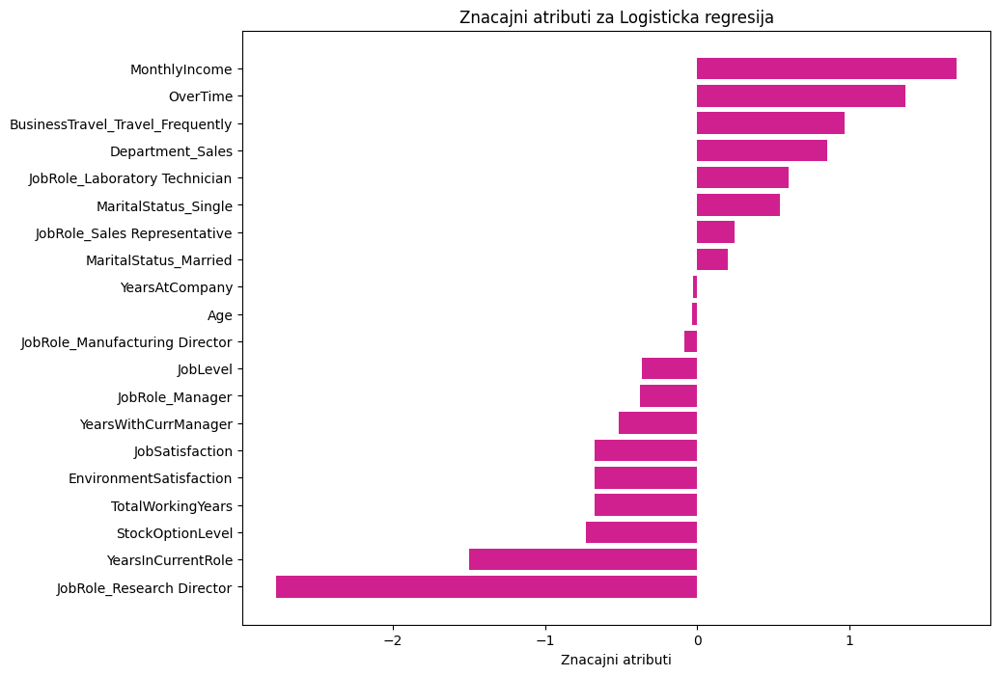

In [108]:
model_lr = LogisticRegression()
model_lr.fit(x_train, y_train)
y_pred_lr = model_lr.predict(x_test)
y_pred_prob_lr = model_lr.predict_proba(x_test)[:, 1]
print("########### MODEL LOGISTICKE REGRESIJE ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lr, x_train,y_train,x_test, y_test,y_pred_lr, y_pred_prob_lr)
accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Logisticka_regresija", y_test,y_pred_lr, y_pred_prob_lr)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lr, "Logisticka regresija", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Logisticka regresija",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [109]:
def pronaci_optimalan_treshold_f1(y_test, y_pred_proba):
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

    f1_scores = 2 * (precision * recall) / (precision + recall)

    optimal_threshold = thresholds[np.argmax(f1_scores)]
    max_f1_score = np.max(f1_scores)
    
    return optimal_threshold, max_f1_score

In [110]:
optimalan_treshold_lr, max_recall_lr=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_lr)

In [111]:
optimalan_treshold_lr

0.7005834198519979

In [112]:
y_pred_treshold_lr = (y_pred_prob_lr >= optimalan_treshold_lr).astype(int)

In [113]:
print(confusion_matrix(y_test, y_pred_treshold_lr))

[[219  14]
 [ 23  22]]


In [114]:
def evaluacija_modela_metrike_treshold(ime_modela, y_test, y_pred_prob, threshold=0.5):


    y_pred = (y_pred_prob >= threshold).astype(int)
    
    # Ispis i izračunavanje metrika
    print("#################################")
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy (Tačnost): {accuracy:.4f}")
    print("#################################")
    precision_ = precision_score(y_test, y_pred)
    print(f"Precision (Preciznost): {precision_:.4f}")
    print("#################################")
    recall_ = recall_score(y_test, y_pred)
    print(f"Recall (Odziv): {recall_:.4f}")
    print("###############################")
    f1_score_ = f1_score(y_test, y_pred)
    print(f"F1 Score: {f1_score_:.4f}")
    roc_auc_score_ = roc_auc_score(y_test, y_pred_prob)
    print(f"ROC AUC: {roc_auc_score_:.4f}")
    print("#################################")
    print(f"Confusion Matrix (Matrica konfuzije):\n{confusion_matrix(y_test, y_pred)}")
    print("#################################")
    print(f"Classification Report (Klasifikacioni izveštaj):\n{classification_report(y_test, y_pred)}\n")

    ###### Prikazivanje matrice konfuzije
    plt.figure(figsize=(4, 4))
    matrica_konfuzije = confusion_matrix(y_test, y_pred)
    falseNegativi = matrica_konfuzije[1, 0]
    ## Izmenjena matrica radi intuitivnijeg prikaza
    konvertovana_matrica = np.fliplr(np.flipud(matrica_konfuzije))
    
    sns.heatmap(konvertovana_matrica, annot=True, fmt='d', cmap=boje_za_grafikone, xticklabels=['No Attrition', 'Attrition'], yticklabels=['Attrition', 'No Attrition'])
    plt.xlabel('Predvidjena')
    plt.ylabel('Stvarna')
    plt.title(f'Matrica konfuzuje za model {ime_modela}')
    plt.show()
    
    ##### Izveštaj klasifikacije 
    precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(recall_curve, precision_curve, label=f'Grafik za model {ime_modela}', color='violet')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall kriva za {ime_modela}')
    plt.legend()
    plt.show()
    
    return accuracy, precision_, recall_, f1_score_, roc_auc_score_, falseNegativi

#################################
Accuracy (Tačnost): 0.8669
#################################
Precision (Preciznost): 0.6111
#################################
Recall (Odziv): 0.4889
###############################
F1 Score: 0.5432
ROC AUC: 0.8098
#################################
Confusion Matrix (Matrica konfuzije):
[[219  14]
 [ 23  22]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.61      0.49      0.54        45

    accuracy                           0.87       278
   macro avg       0.76      0.71      0.73       278
weighted avg       0.86      0.87      0.86       278




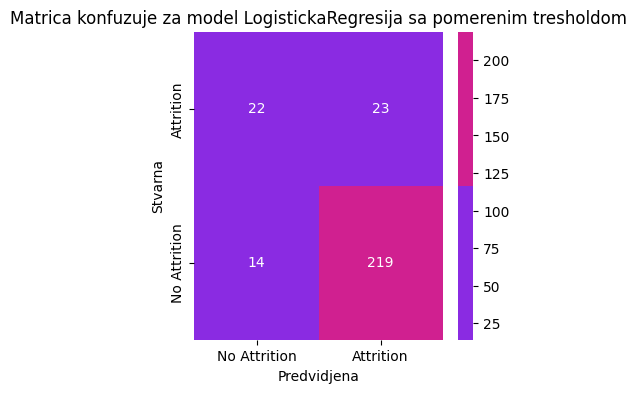

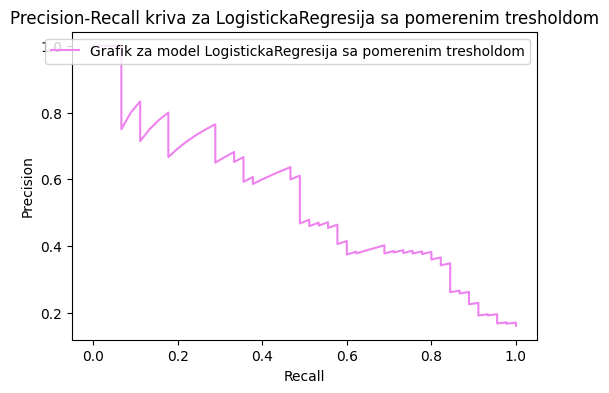

In [115]:
accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold("LogistickaRegresija sa pomerenim tresholdom", y_test, y_pred_prob_lr,optimalan_treshold_lr)

In [116]:
REZULTATI_TABELA_treshold = pd.DataFrame(columns=["Ime modela","Accuracy", "Precision", "Recall", "F1-score", "ROC_AUC_SCORE", "FALSE NEGATIVI","treshold"])

In [117]:
red_new= pd.DataFrame([{
"Ime modela": "LogistickaRegresija",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_lr

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

In [119]:
REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.54321,0.809824,23,0.700583


In [120]:
from sklearn.tree import DecisionTreeClassifier

########### MODEL Drvo odlucivanja ###########
Krosvalidacioni scopre:  83.71%
ROC_AUC Score :  69.80%


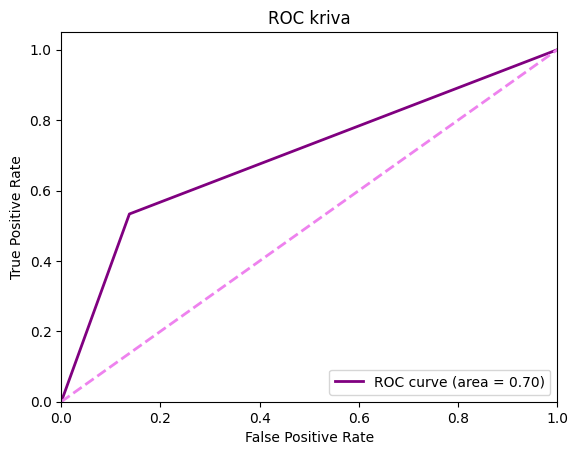

#################################
Accuracy (Tačnost): 0.8093525179856115
#################################
Precision (Preciznost): 0.42857142857142855
#################################
Recall(odziv): 0.5333333333333333
###############################
F1 Score: 0.4752475247524753
ROC AUC: 0.697997138769671
Confusion Matrix (matrica konfuzije):
[[201  32]
 [ 21  24]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.86      0.88       233
           1       0.43      0.53      0.48        45

    accuracy                           0.81       278
   macro avg       0.67      0.70      0.68       278
weighted avg       0.83      0.81      0.82       278




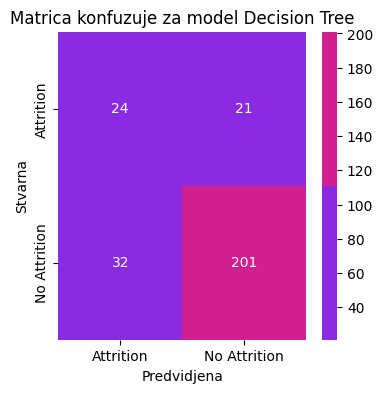

              precision    recall  f1-score   support

           0       0.91      0.86      0.88       233
           1       0.43      0.53      0.48        45

    accuracy                           0.81       278
   macro avg       0.67      0.70      0.68       278
weighted avg       0.83      0.81      0.82       278



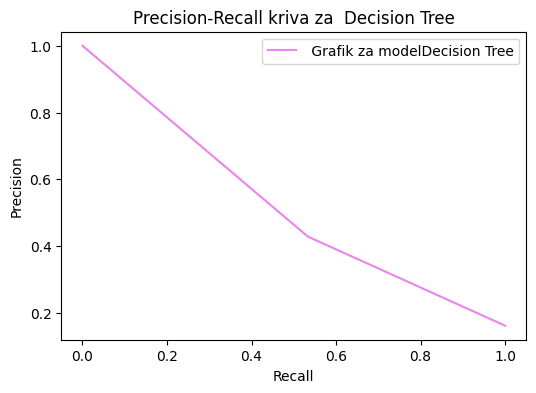

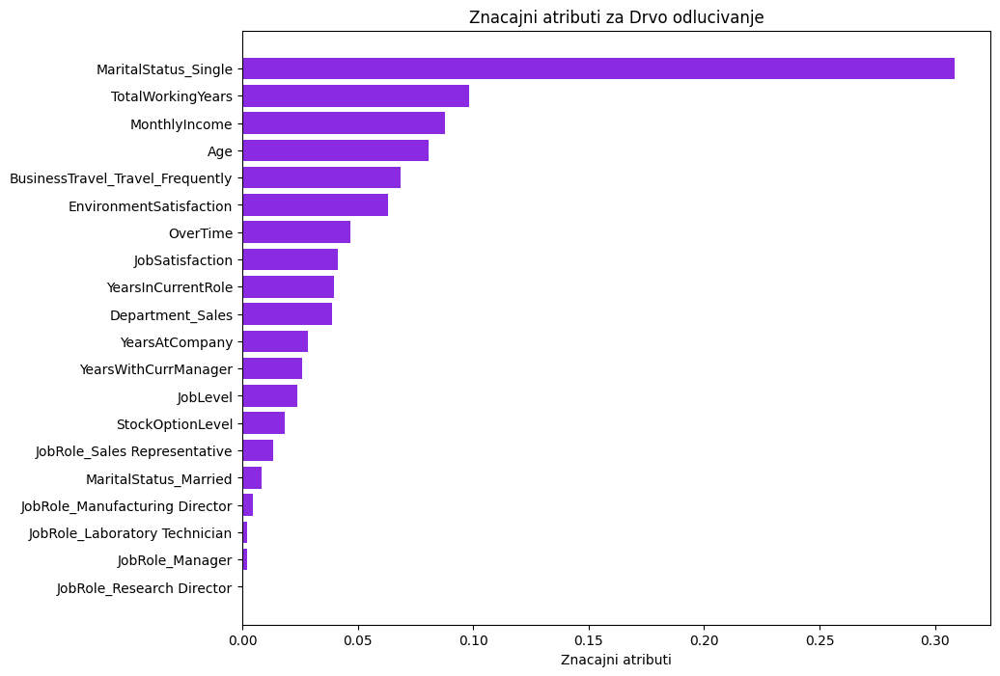

#################################
Accuracy (Tačnost): 0.8094
#################################
Precision (Preciznost): 0.4286
#################################
Recall (Odziv): 0.5333
###############################
F1 Score: 0.4752
ROC AUC: 0.6980
#################################
Confusion Matrix (Matrica konfuzije):
[[201  32]
 [ 21  24]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.91      0.86      0.88       233
           1       0.43      0.53      0.48        45

    accuracy                           0.81       278
   macro avg       0.67      0.70      0.68       278
weighted avg       0.83      0.81      0.82       278




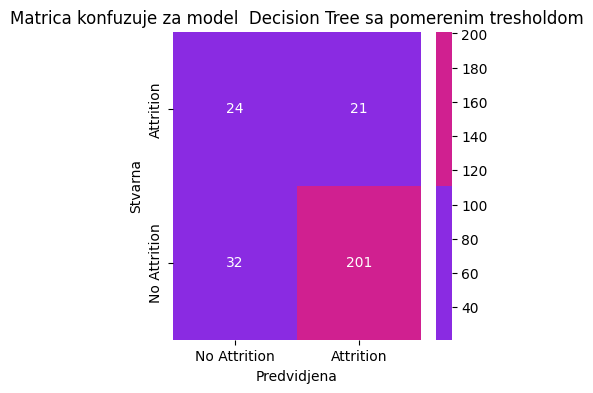

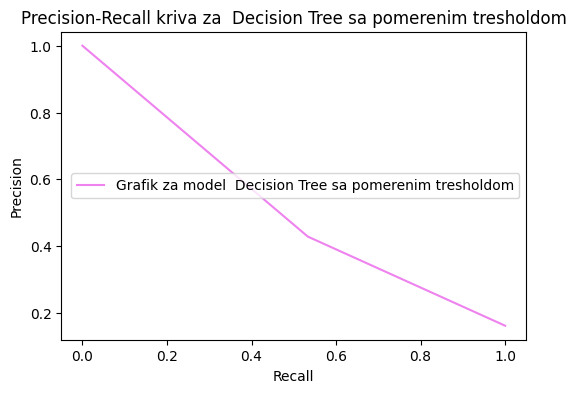

In [121]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)
y_pred_dt = model_dt.predict(x_test)
y_pred_prob_dt = model_dt.predict_proba(x_test)[:, 1]

print("########### MODEL Drvo odlucivanja ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_dt, x_train,y_train,x_test, y_test,y_pred_dt, y_pred_prob_dt)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Decision Tree", y_test,y_pred_dt, y_pred_prob_dt)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_dt, "Drvo odlucivanje", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


########################
##################

optimalan_treshold_dt, max_recall_dt=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_dt)
y_pred_treshold_dt = (y_pred_prob_dt >= optimalan_treshold_dt).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" Decision Tree sa pomerenim tresholdom", y_test, y_pred_prob_dt,optimalan_treshold_dt)
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_dt

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)


In [122]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier


########### MODEL Random Forest###########
Krosvalidacioni scopre:  96.13%
ROC_AUC Score :  79.95%


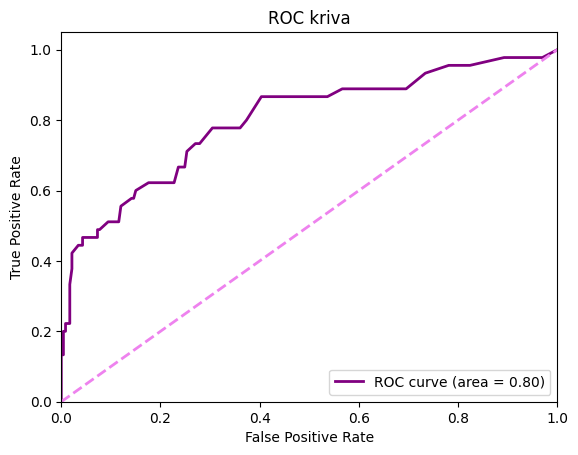

#################################
Accuracy (Tačnost): 0.8776978417266187
#################################
Precision (Preciznost): 0.7894736842105263
#################################
Recall(odziv): 0.3333333333333333
###############################
F1 Score: 0.46875
ROC AUC: 0.799523128278493
Confusion Matrix (matrica konfuzije):
[[229   4]
 [ 30  15]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       233
           1       0.79      0.33      0.47        45

    accuracy                           0.88       278
   macro avg       0.84      0.66      0.70       278
weighted avg       0.87      0.88      0.86       278




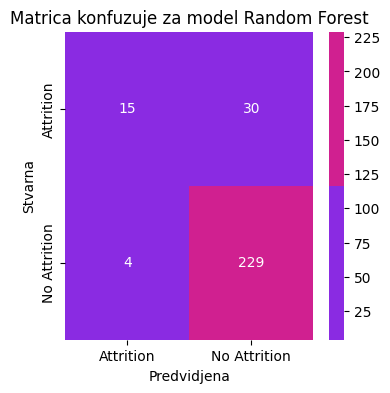

              precision    recall  f1-score   support

           0       0.88      0.98      0.93       233
           1       0.79      0.33      0.47        45

    accuracy                           0.88       278
   macro avg       0.84      0.66      0.70       278
weighted avg       0.87      0.88      0.86       278



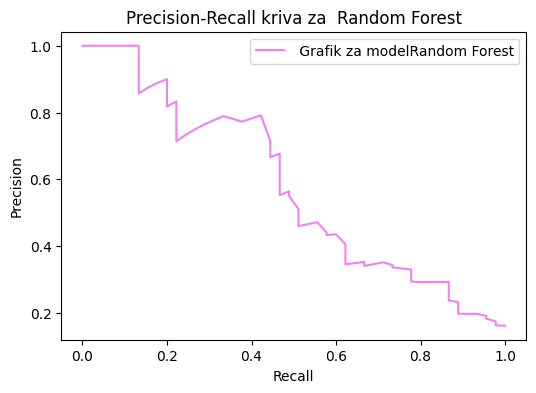

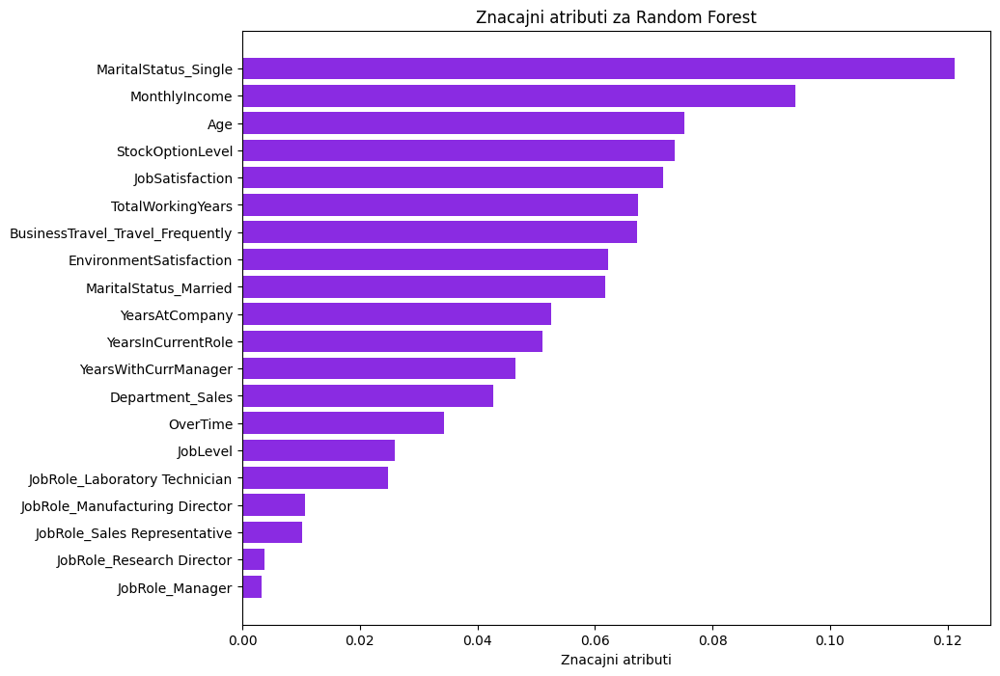

#################################
Accuracy (Tačnost): 0.8777
#################################
Precision (Preciznost): 0.6774
#################################
Recall (Odziv): 0.4667
###############################
F1 Score: 0.5526
ROC AUC: 0.7995
#################################
Confusion Matrix (Matrica konfuzije):
[[223  10]
 [ 24  21]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.47      0.55        45

    accuracy                           0.88       278
   macro avg       0.79      0.71      0.74       278
weighted avg       0.87      0.88      0.87       278




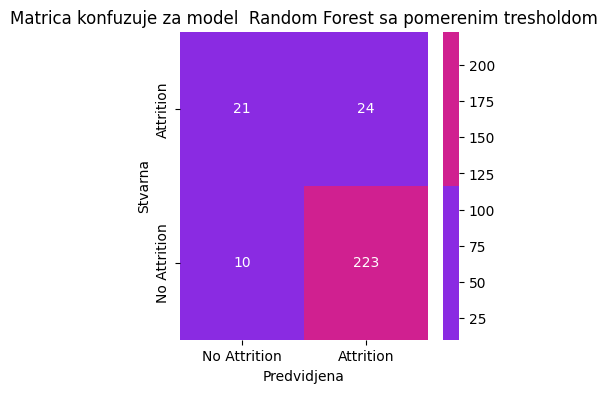

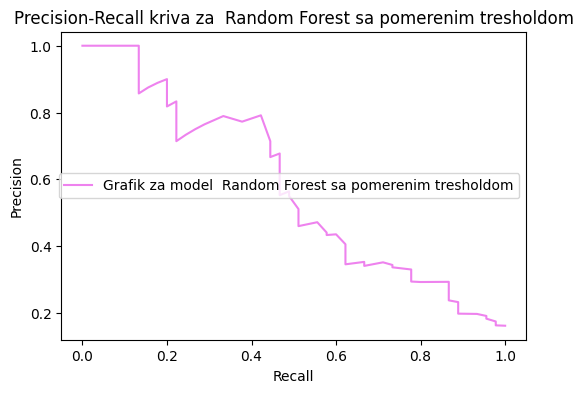

In [123]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
y_pred_rf = model_rf.predict(x_test)
y_pred_prob_rf = model_rf.predict_proba(x_test)[:, 1]

print("########### MODEL Random Forest###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_rf, x_train,y_train,x_test, y_test,y_pred_rf, y_pred_prob_rf)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Random Forest", y_test,y_pred_rf, y_pred_prob_rf)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_rf, "Random Forest", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)



########################


optimalan_treshold_rf, max_recall_rf=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_rf)
y_pred_treshold_rf = (y_pred_prob_rf >= optimalan_treshold_rf).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" Random Forest sa pomerenim tresholdom", y_test, y_pred_prob_rf,optimalan_treshold_rf)
red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_rf

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

########### MODEL Gradient Boosting Classifier ###########
Krosvalidacioni scopre:  95.04%
ROC_AUC Score :  81.07%


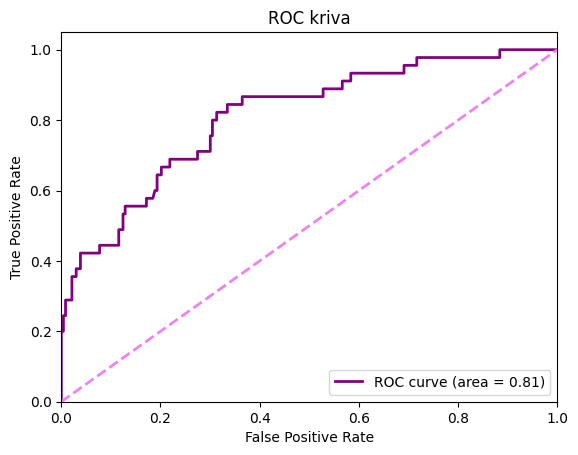

#################################
Accuracy (Tačnost): 0.8741007194244604
#################################
Precision (Preciznost): 0.6785714285714286
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.5205479452054794
ROC AUC: 0.8107296137339056
Confusion Matrix (matrica konfuzije):
[[224   9]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.42      0.52        45

    accuracy                           0.87       278
   macro avg       0.79      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278




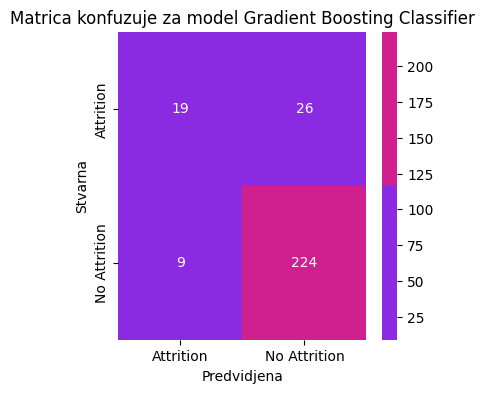

              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.42      0.52        45

    accuracy                           0.87       278
   macro avg       0.79      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278



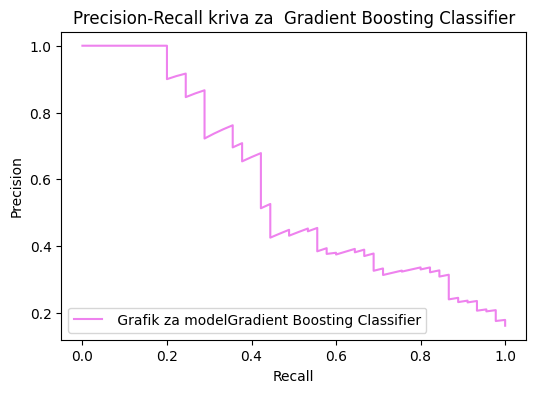

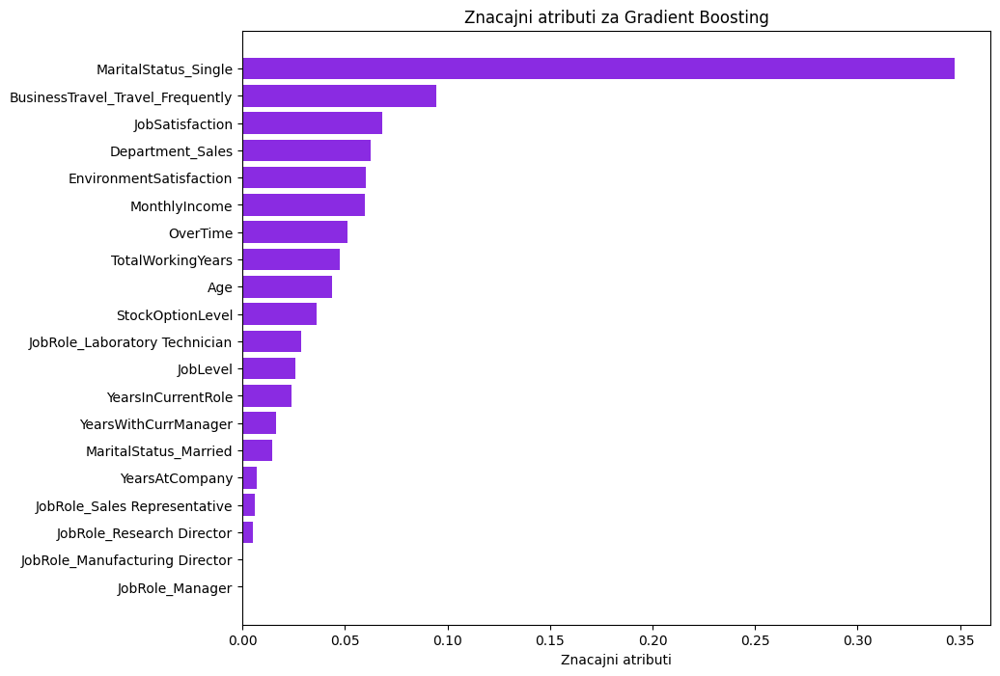

#################################
Accuracy (Tačnost): 0.8741
#################################
Precision (Preciznost): 0.6786
#################################
Recall (Odziv): 0.4222
###############################
F1 Score: 0.5205
ROC AUC: 0.8107
#################################
Confusion Matrix (Matrica konfuzije):
[[224   9]
 [ 26  19]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.42      0.52        45

    accuracy                           0.87       278
   macro avg       0.79      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278




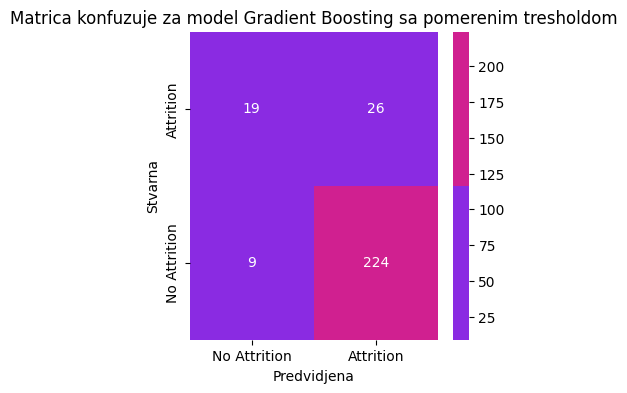

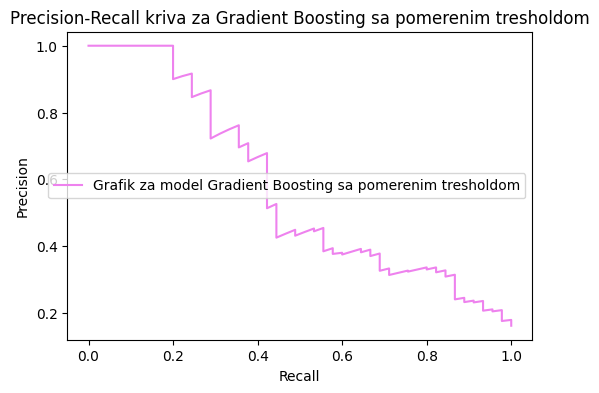

In [124]:
model_gb = GradientBoostingClassifier()
model_gb.fit(x_train, y_train)
y_pred_gb = model_gb.predict(x_test)
y_pred_prob_gb = model_gb.predict_proba(x_test)[:, 1]

print("########### MODEL Gradient Boosting Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gb, x_train,y_train,x_test, y_test,y_pred_gb, y_pred_prob_gb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Gradient Boosting Classifier", y_test,y_pred_gb, y_pred_prob_gb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gb, "Gradient Boosting", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


#####################################
optimalan_treshold_gb, max_recall_gb=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_gb)
y_pred_treshold_gb = (y_pred_prob_gb >= optimalan_treshold_gb).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold("Gradient Boosting sa pomerenim tresholdom", y_test, y_pred_prob_gb,optimalan_treshold_gb)
red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_gb

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

########### MODEL Ada Boost Classifier ###########
Krosvalidacioni scopre:  93.77%
ROC_AUC Score :  79.59%


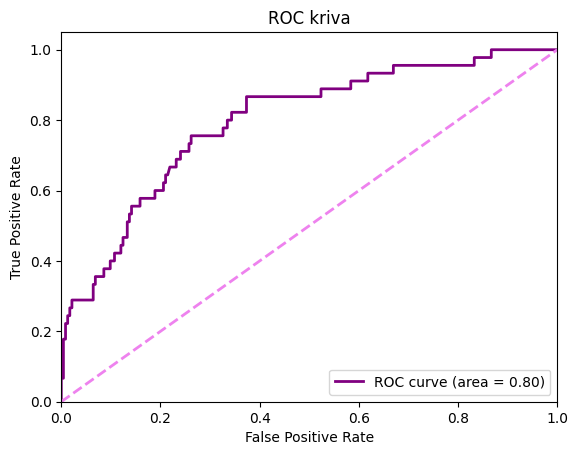

#################################
Accuracy (Tačnost): 0.8201438848920863
#################################
Precision (Preciznost): 0.43902439024390244
#################################
Recall(odziv): 0.4
###############################
F1 Score: 0.4186046511627907
ROC AUC: 0.7958512160228898
Confusion Matrix (matrica konfuzije):
[[210  23]
 [ 27  18]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       233
           1       0.44      0.40      0.42        45

    accuracy                           0.82       278
   macro avg       0.66      0.65      0.66       278
weighted avg       0.81      0.82      0.82       278




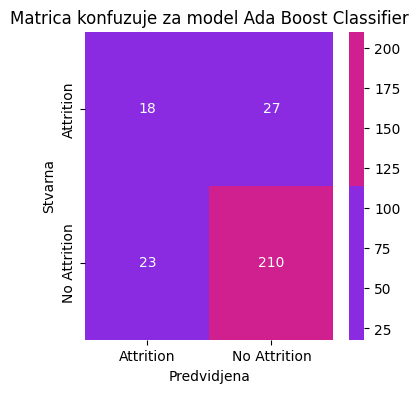

              precision    recall  f1-score   support

           0       0.89      0.90      0.89       233
           1       0.44      0.40      0.42        45

    accuracy                           0.82       278
   macro avg       0.66      0.65      0.66       278
weighted avg       0.81      0.82      0.82       278



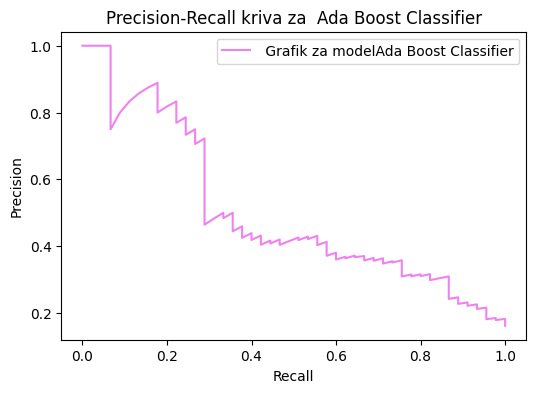

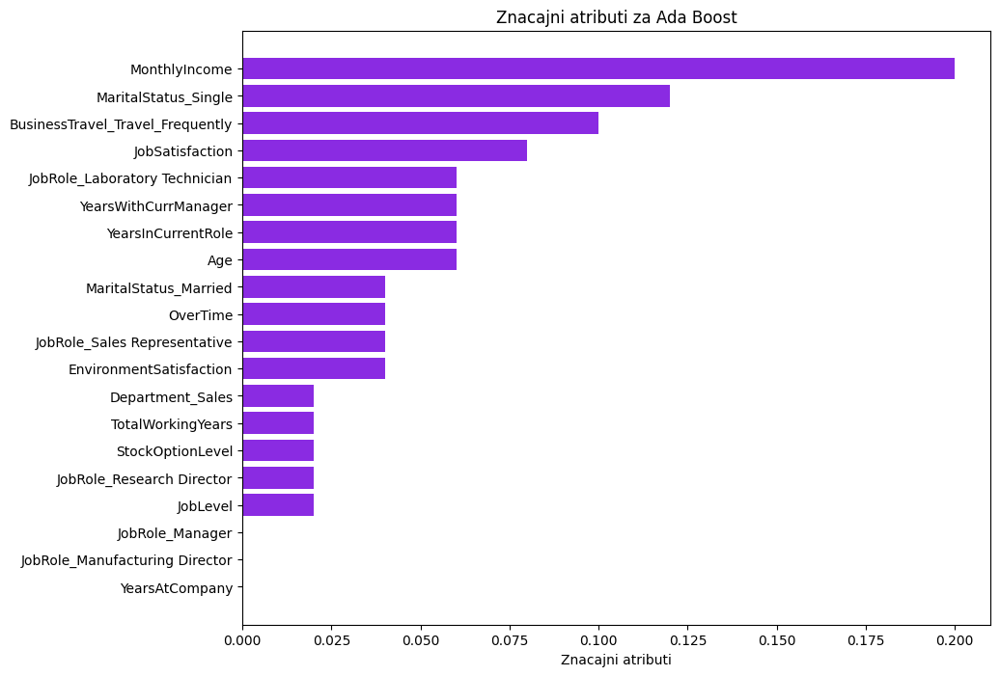

#################################
Accuracy (Tačnost): 0.7410
#################################
Precision (Preciznost): 0.3579
#################################
Recall (Odziv): 0.7556
###############################
F1 Score: 0.4857
ROC AUC: 0.7959
#################################
Confusion Matrix (Matrica konfuzije):
[[172  61]
 [ 11  34]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.94      0.74      0.83       233
           1       0.36      0.76      0.49        45

    accuracy                           0.74       278
   macro avg       0.65      0.75      0.66       278
weighted avg       0.85      0.74      0.77       278




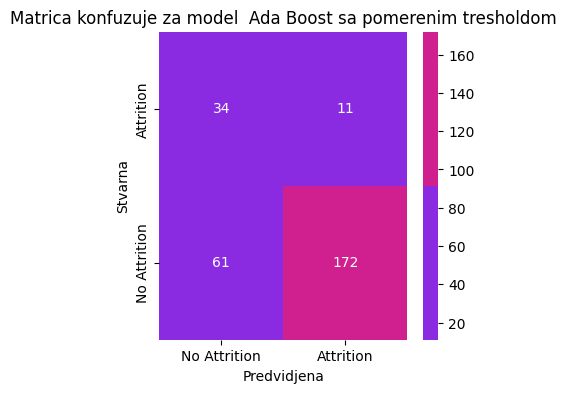

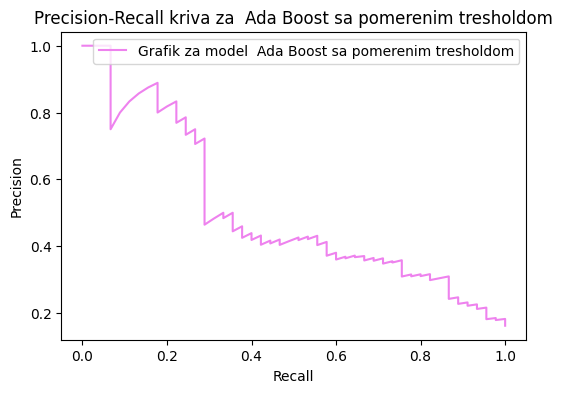

In [125]:
model_ab = AdaBoostClassifier()
model_ab.fit(x_train, y_train)
y_pred_ab = model_ab.predict(x_test)
y_pred_prob_ab = model_ab.predict_proba(x_test)[:, 1]

print("########### MODEL Ada Boost Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_ab, x_train,y_train,x_test, y_test,y_pred_ab, y_pred_prob_ab)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Ada Boost Classifier", y_test,y_pred_ab, y_pred_prob_ab)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_ab, "Ada Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


optimalan_treshold_ab, max_recall_ab=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_ab)
y_pred_treshold_ab = (y_pred_prob_ab >= optimalan_treshold_ab).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" Ada Boost sa pomerenim tresholdom", y_test, y_pred_prob_ab,optimalan_treshold_ab)
red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_ab

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

In [126]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"[BusinessTravel_Travel_Frequently, OverTime, M..."
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,0.834943,21,NO,NONE,"[MonthlyIncome, TotalWorkingYears, MaritalStat..."
2,Random Forest,0.877698,0.789474,0.333333,0.468750,0.799523,0.961904,30,NO,NONE,"[Age, MonthlyIncome, MaritalStatus_Single]"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"[JobSatisfaction, BusinessTravel_Travel_Freque..."
4,Ada Boost,0.820144,0.439024,0.400000,0.418605,0.795851,0.937741,27,NO,NONE,"[BusinessTravel_Travel_Frequently, MaritalStat..."


In [127]:
REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.543210,0.809824,23,0.700583
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,21,1.000000
2,Random Forest,0.877698,0.677419,0.466667,0.552632,0.799523,24,0.440000
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,26,0.506066
4,Ada Boost,0.741007,0.357895,0.755556,0.485714,0.795851,11,0.493393


########### MODEL Bagging Classifier ###########
Krosvalidacioni scopre:  93.99%
ROC_AUC Score :  75.70%


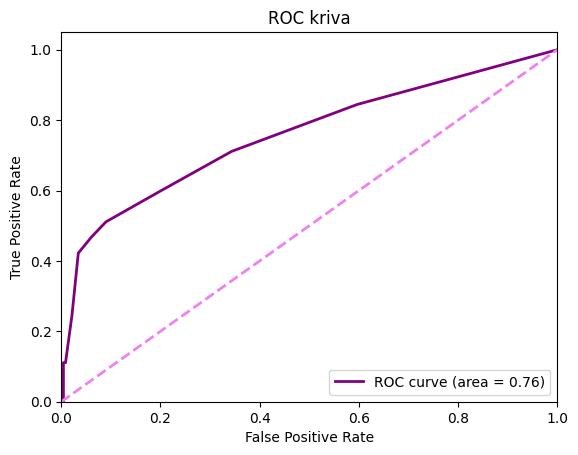

#################################
Accuracy (Tačnost): 0.8776978417266187
#################################
Precision (Preciznost): 0.7037037037037037
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.5277777777777777
ROC AUC: 0.7570338578922271
Confusion Matrix (matrica konfuzije):
[[225   8]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.70      0.42      0.53        45

    accuracy                           0.88       278
   macro avg       0.80      0.69      0.73       278
weighted avg       0.87      0.88      0.86       278




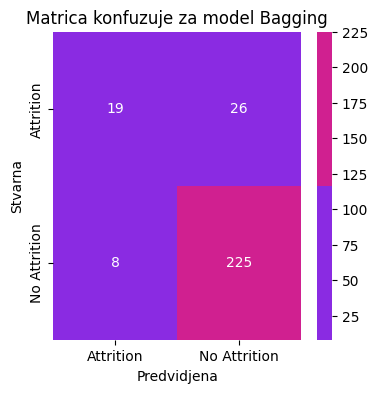

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.70      0.42      0.53        45

    accuracy                           0.88       278
   macro avg       0.80      0.69      0.73       278
weighted avg       0.87      0.88      0.86       278



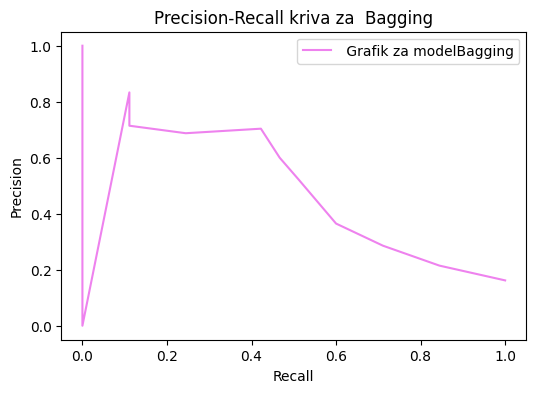

Model nema podržanu značajnost attributa
#################################
Accuracy (Tačnost): 0.8345
#################################
Precision (Preciznost): 0.0000
#################################
Recall (Odziv): 0.0000
###############################
F1 Score: 0.0000
ROC AUC: 0.7570
#################################
Confusion Matrix (Matrica konfuzije):
[[232   1]
 [ 45   0]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.84      1.00      0.91       233
           1       0.00      0.00      0.00        45

    accuracy                           0.83       278
   macro avg       0.42      0.50      0.45       278
weighted avg       0.70      0.83      0.76       278




C:\Users\andjelami\AppData\Local\Temp\ipykernel_18268\1363006884.py:4: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


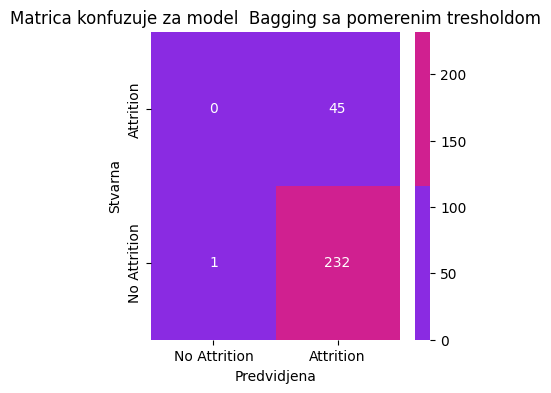

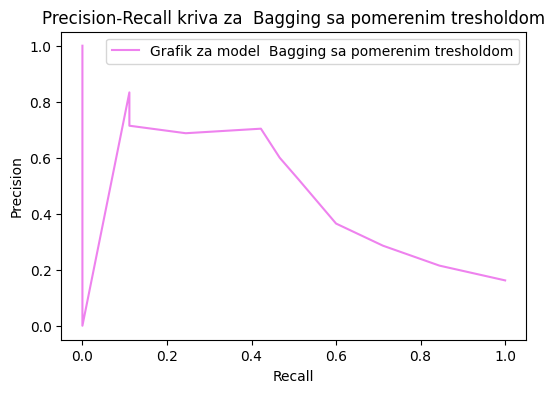

In [128]:
model_bg = BaggingClassifier()
model_bg.fit(x_train, y_train)
y_pred_bg = model_bg.predict(x_test)
y_pred_prob_bg = model_bg.predict_proba(x_test)[:, 1]

print("########### MODEL Bagging Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_bg, x_train,y_train,x_test, y_test,y_pred_bg, y_pred_prob_bg)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Bagging", y_test,y_pred_bg, y_pred_prob_bg)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_bg, "Bagging Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


###########################
optimalan_treshold_bg, max_recall_bg=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_bg)
y_pred_treshold_bg = (y_pred_prob_bg >= optimalan_treshold_bg).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" Bagging sa pomerenim tresholdom", y_test, y_pred_prob_bg,optimalan_treshold_bg)
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_bg

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

In [129]:
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

########### MODEL XGB Classifier###########
Krosvalidacioni scopre:  96.24%
ROC_AUC Score :  79.20%


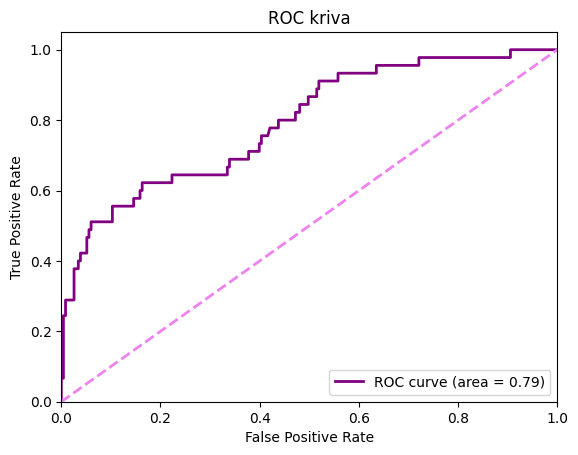

#################################
Accuracy (Tačnost): 0.8741007194244604
#################################
Precision (Preciznost): 0.6785714285714286
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.5205479452054794
ROC AUC: 0.7920362422508346
Confusion Matrix (matrica konfuzije):
[[224   9]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.42      0.52        45

    accuracy                           0.87       278
   macro avg       0.79      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278




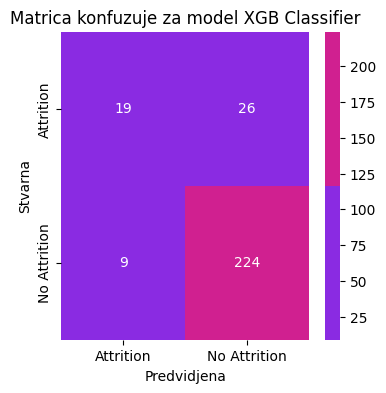

              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.68      0.42      0.52        45

    accuracy                           0.87       278
   macro avg       0.79      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278



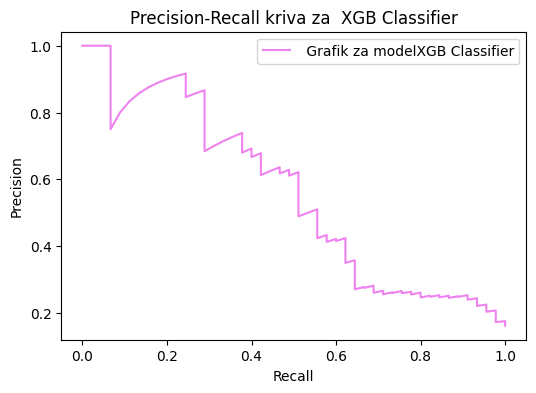

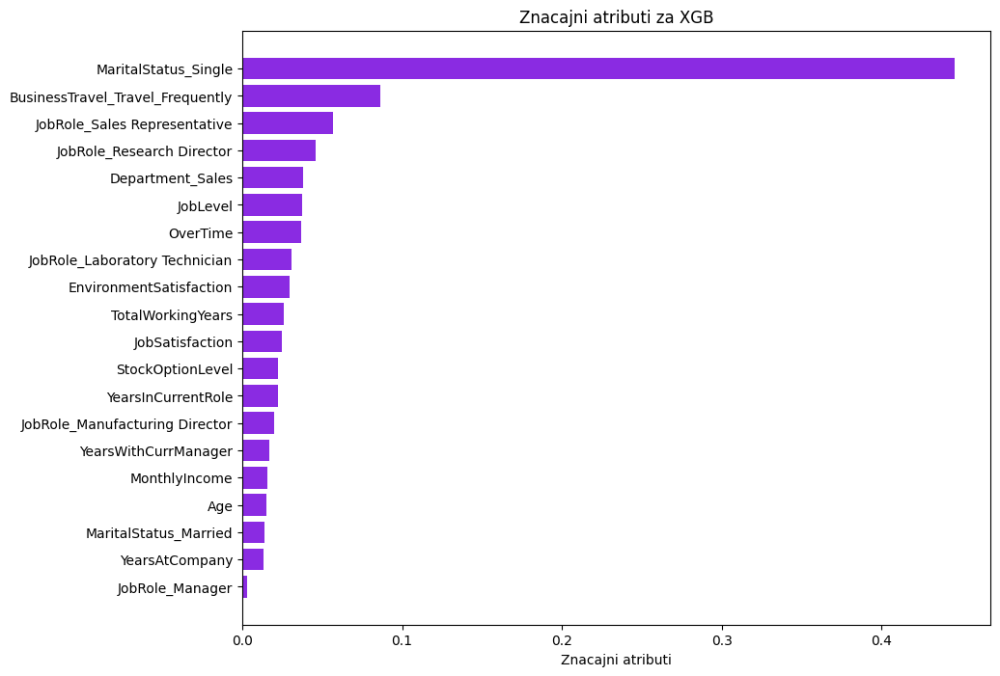

#################################
Accuracy (Tačnost): 0.8705
#################################
Precision (Preciznost): 0.6216
#################################
Recall (Odziv): 0.5111
###############################
F1 Score: 0.5610
ROC AUC: 0.7920
#################################
Confusion Matrix (Matrica konfuzije):
[[219  14]
 [ 22  23]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.91      0.94      0.92       233
           1       0.62      0.51      0.56        45

    accuracy                           0.87       278
   macro avg       0.77      0.73      0.74       278
weighted avg       0.86      0.87      0.87       278




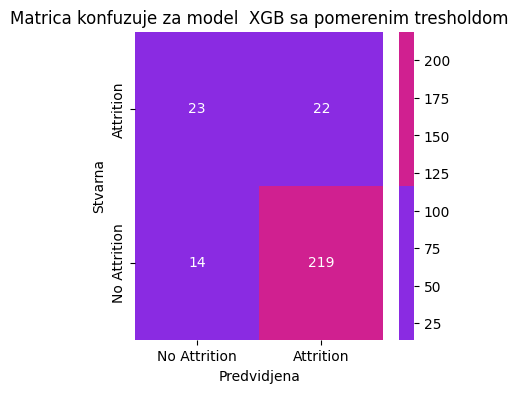

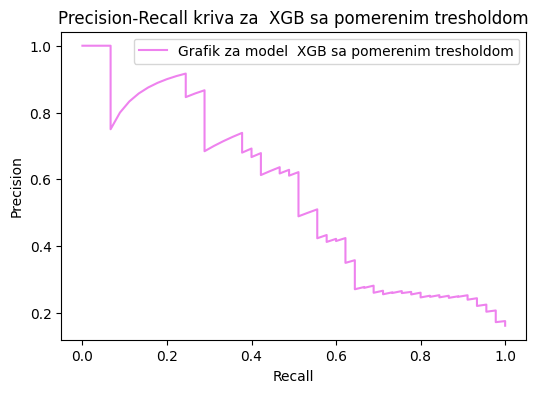

In [130]:
model_xgb = xgb.XGBClassifier()
model_xgb.fit(x_train, y_train)
y_pred_xgb = model_xgb.predict(x_test)
y_pred_prob_xgb = model_xgb.predict_proba(x_test)[:, 1]

print("########### MODEL XGB Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_xgb, x_train,y_train,x_test, y_test,y_pred_xgb, y_pred_prob_xgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("XGB Classifier", y_test,y_pred_xgb, y_pred_prob_xgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_xgb, "XGB", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "XGB",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


#############################
optimalan_treshold_xgb, max_recall_xgb=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_xgb)
y_pred_treshold_xgb = (y_pred_prob_xgb >= optimalan_treshold_xgb).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" XGB sa pomerenim tresholdom", y_test, y_pred_prob_xgb,optimalan_treshold_xgb)
red_new= pd.DataFrame([{
"Ime modela": "XGB",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_xgb

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 786, number of negative: 925
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1300
[LightGBM] [Info] Number of data points in the train set: 1711, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459380 -> initscore=-0.162837
[LightGBM] [Info] Start training from score -0.162837
########### MODEL LGBM Classifier###########
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory

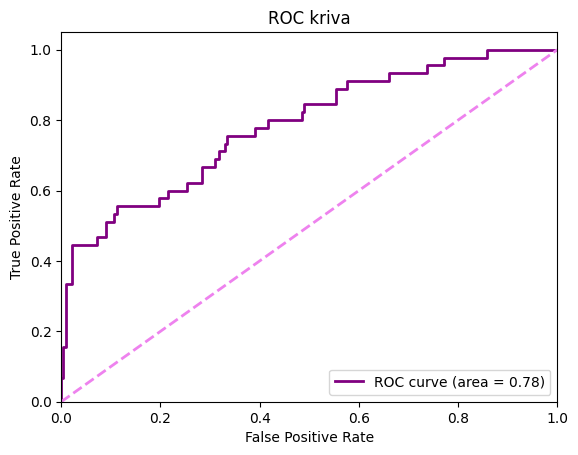

#################################
Accuracy (Tačnost): 0.8848920863309353
#################################
Precision (Preciznost): 0.7407407407407407
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5555555555555555
ROC AUC: 0.7848354792560801
Confusion Matrix (matrica konfuzije):
[[226   7]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.74      0.44      0.56        45

    accuracy                           0.88       278
   macro avg       0.82      0.71      0.74       278
weighted avg       0.87      0.88      0.87       278




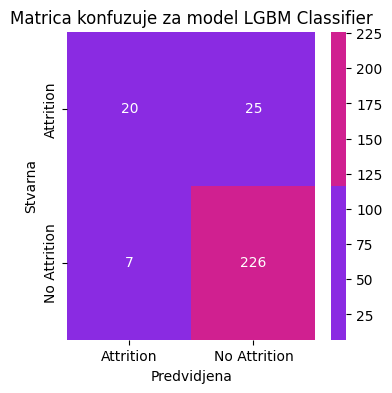

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.74      0.44      0.56        45

    accuracy                           0.88       278
   macro avg       0.82      0.71      0.74       278
weighted avg       0.87      0.88      0.87       278



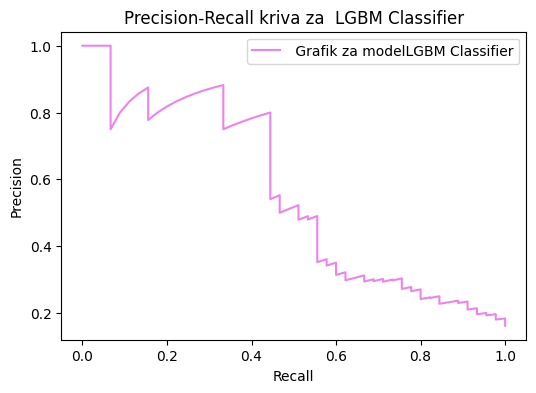

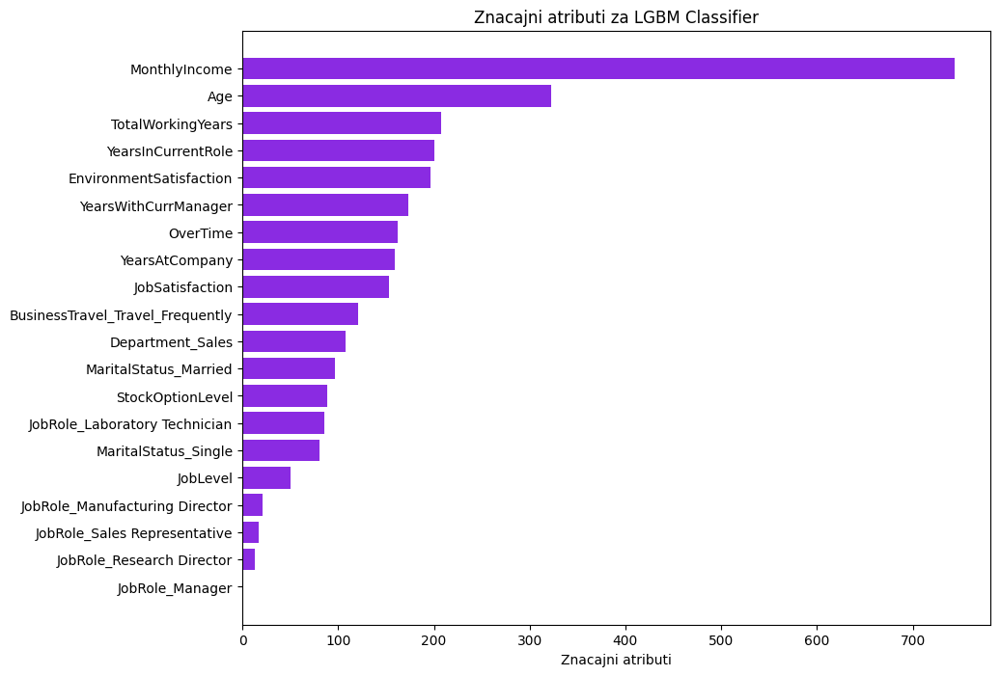

#################################
Accuracy (Tačnost): 0.8921
#################################
Precision (Preciznost): 0.8000
#################################
Recall (Odziv): 0.4444
###############################
F1 Score: 0.5714
ROC AUC: 0.7848
#################################
Confusion Matrix (Matrica konfuzije):
[[228   5]
 [ 25  20]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       233
           1       0.80      0.44      0.57        45

    accuracy                           0.89       278
   macro avg       0.85      0.71      0.75       278
weighted avg       0.88      0.89      0.88       278




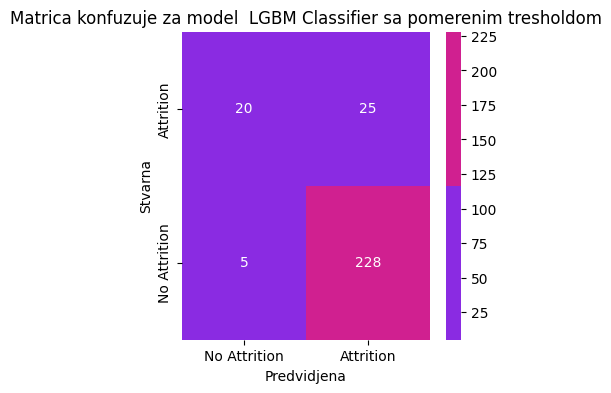

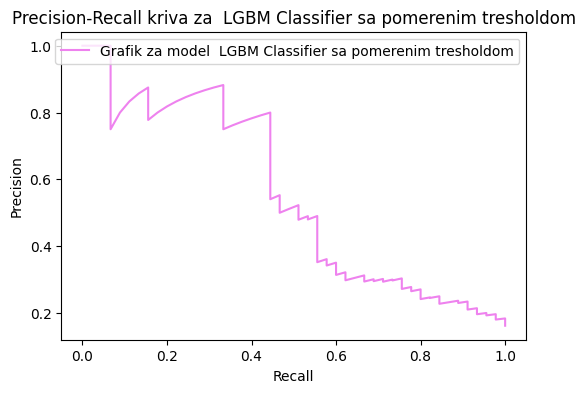

In [131]:
model_lgb = lgb.LGBMClassifier()
model_lgb.fit(x_train, y_train)
y_pred_lgb = model_lgb.predict(x_test)
y_pred_prob_lgb = model_lgb.predict_proba(x_test)[:, 1]

print("########### MODEL LGBM Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lgb, x_train,y_train,x_test, y_test,y_pred_lgb, y_pred_prob_lgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("LGBM Classifier", y_test,y_pred_lgb, y_pred_prob_lgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lgb, "LGBM Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "LGBM Classifier",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


#########################
optimalan_treshold_lgb, max_recall_lgb=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_lgb)
y_pred_treshold_lgb = (y_pred_prob_lgb >= optimalan_treshold_lgb).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" LGBM Classifier sa pomerenim tresholdom", y_test, y_pred_prob_lgb,optimalan_treshold_lgb)
red_new= pd.DataFrame([{
"Ime modela": "LGBM Classifier",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_lgb

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)


Learning rate set to 0.012958
0:	learn: 0.6866870	total: 126ms	remaining: 2m 6s
1:	learn: 0.6786155	total: 129ms	remaining: 1m 4s
2:	learn: 0.6691764	total: 132ms	remaining: 43.7s
3:	learn: 0.6609260	total: 134ms	remaining: 33.3s
4:	learn: 0.6523945	total: 136ms	remaining: 27.1s
5:	learn: 0.6442606	total: 140ms	remaining: 23.1s
6:	learn: 0.6362141	total: 142ms	remaining: 20.2s
7:	learn: 0.6286707	total: 144ms	remaining: 17.9s
8:	learn: 0.6212557	total: 147ms	remaining: 16.2s
9:	learn: 0.6147332	total: 149ms	remaining: 14.8s
10:	learn: 0.6081527	total: 152ms	remaining: 13.6s
11:	learn: 0.6013773	total: 154ms	remaining: 12.7s
12:	learn: 0.5949847	total: 157ms	remaining: 11.9s
13:	learn: 0.5915082	total: 160ms	remaining: 11.3s
14:	learn: 0.5865020	total: 163ms	remaining: 10.7s
15:	learn: 0.5793718	total: 165ms	remaining: 10.2s
16:	learn: 0.5731519	total: 168ms	remaining: 9.72s
17:	learn: 0.5679218	total: 172ms	remaining: 9.37s
18:	learn: 0.5627176	total: 175ms	remaining: 9.01s
19:	learn: 

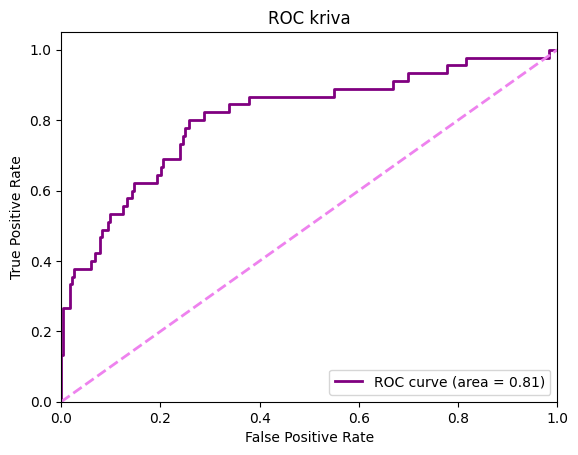

#################################
Accuracy (Tačnost): 0.8525179856115108
#################################
Precision (Preciznost): 0.5666666666666667
#################################
Recall(odziv): 0.37777777777777777
###############################
F1 Score: 0.4533333333333333
ROC AUC: 0.8098235574630425
Confusion Matrix (matrica konfuzije):
[[220  13]
 [ 28  17]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.94      0.91       233
           1       0.57      0.38      0.45        45

    accuracy                           0.85       278
   macro avg       0.73      0.66      0.68       278
weighted avg       0.84      0.85      0.84       278




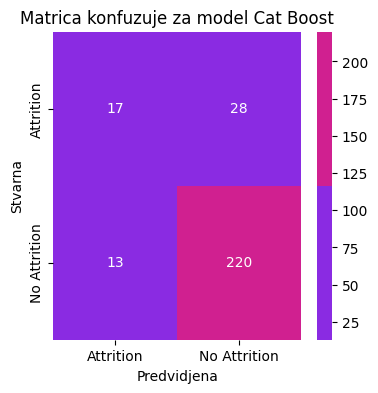

              precision    recall  f1-score   support

           0       0.89      0.94      0.91       233
           1       0.57      0.38      0.45        45

    accuracy                           0.85       278
   macro avg       0.73      0.66      0.68       278
weighted avg       0.84      0.85      0.84       278



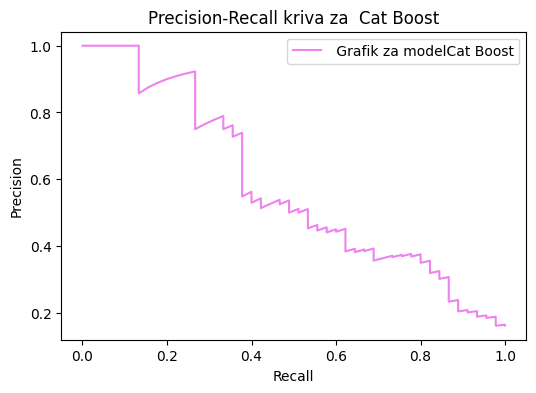

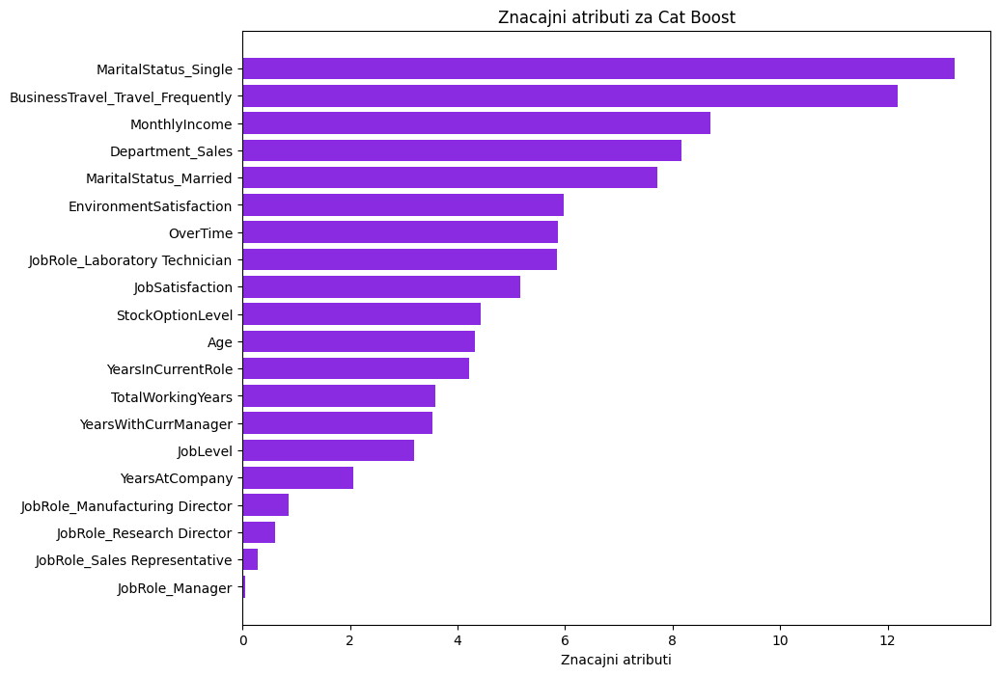

#################################
Accuracy (Tačnost): 0.8165
#################################
Precision (Preciznost): 0.4516
#################################
Recall (Odziv): 0.6222
###############################
F1 Score: 0.5234
ROC AUC: 0.8098
#################################
Confusion Matrix (Matrica konfuzije):
[[199  34]
 [ 17  28]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.92      0.85      0.89       233
           1       0.45      0.62      0.52        45

    accuracy                           0.82       278
   macro avg       0.69      0.74      0.70       278
weighted avg       0.85      0.82      0.83       278




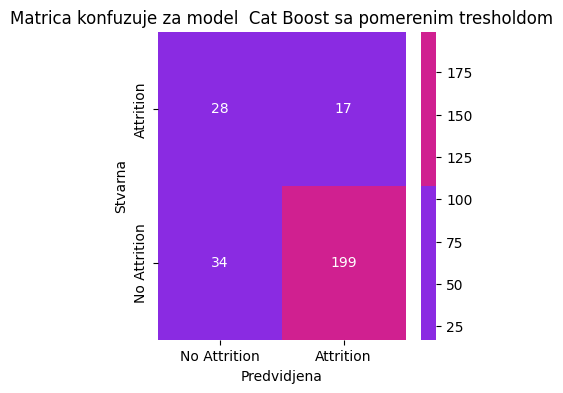

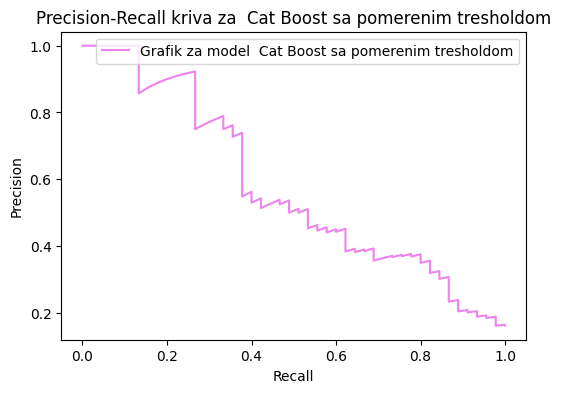

In [132]:
model_cb = cb.CatBoostClassifier()
model_cb.fit(x_train, y_train)
y_pred_cb = model_cb.predict(x_test)
y_pred_prob_cb = model_cb.predict_proba(x_test)[:, 1]

print("########### MODEL Cat Boost ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_cb, x_train,y_train,x_test, y_test,y_pred_cb, y_pred_prob_cb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Cat Boost", y_test,y_pred_cb, y_pred_prob_cb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_cb, "Cat Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Cat Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


######################
optimalan_treshold_cb, max_recall_cb=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_cb)
y_pred_treshold_cb = (y_pred_prob_cb >= optimalan_treshold_cb).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(" Cat Boost sa pomerenim tresholdom", y_test, y_pred_prob_cb,optimalan_treshold_cb)
red_new= pd.DataFrame([{
"Ime modela": "Cat Boost",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_cb

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)

In [170]:
#### JOS VISE OSNOVNIH MODELA

In [133]:
from sklearn.naive_bayes import GaussianNB

########### MODEL Naive Bayes ###########
Krosvalidacioni scopre:  78.22%
ROC_AUC Score :  80.66%


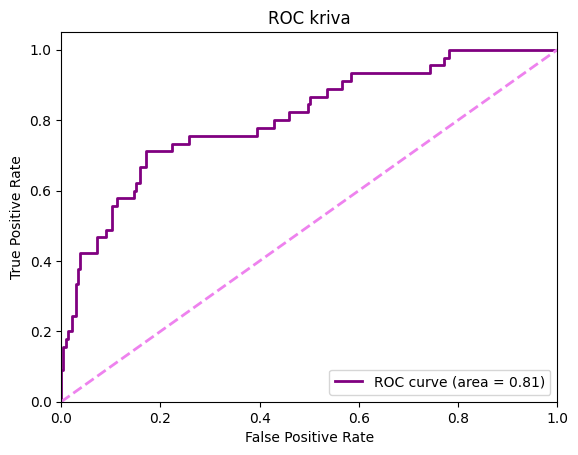

#################################
Accuracy (Tačnost): 0.37050359712230213
#################################
Precision (Preciznost): 0.19626168224299065
#################################
Recall(odziv): 0.9333333333333333
###############################
F1 Score: 0.32432432432432434
ROC AUC: 0.8065808297567955
Confusion Matrix (matrica konfuzije):
[[ 61 172]
 [  3  42]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.37       278
weighted avg       0.83      0.37      0.40       278




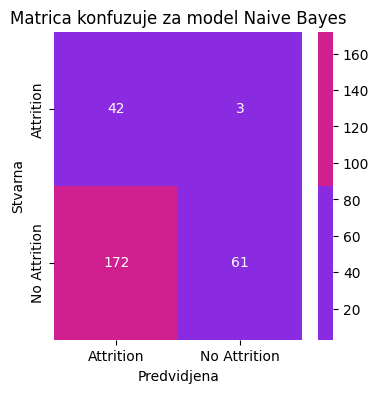

              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.37       278
weighted avg       0.83      0.37      0.40       278



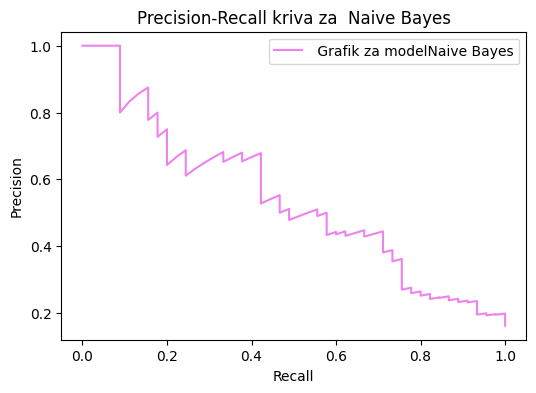

Model nema podržanu značajnost attributa
#################################
Accuracy (Tačnost): 0.8094
#################################
Precision (Preciznost): 0.4444
#################################
Recall (Odziv): 0.7111
###############################
F1 Score: 0.5470
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[193  40]
 [ 13  32]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       233
           1       0.44      0.71      0.55        45

    accuracy                           0.81       278
   macro avg       0.69      0.77      0.71       278
weighted avg       0.86      0.81      0.83       278




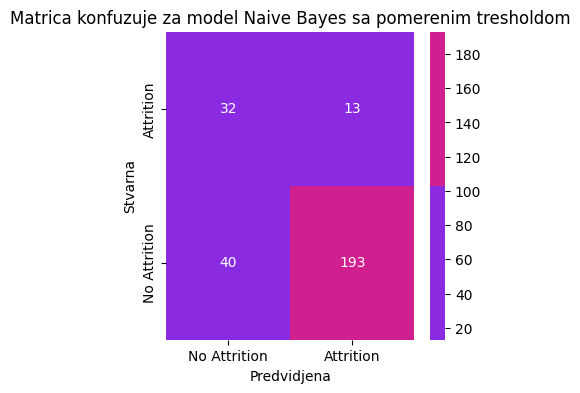

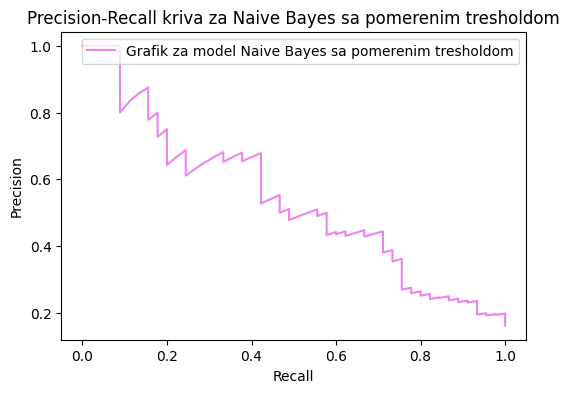

In [134]:
model_gnb = GaussianNB()
model_gnb.fit(x_train, y_train)
y_pred_gnb = model_gnb.predict(x_test)
y_pred_prob_gnb = model_gnb.predict_proba(x_test)[:, 1]

print("########### MODEL Naive Bayes ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gnb, x_train,y_train,x_test, y_test,y_pred_gnb, y_pred_prob_gnb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Naive Bayes", y_test,y_pred_gnb, y_pred_prob_gnb)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gnb, "Naive Bayes", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)




############################################################
optimalan_treshold_gnb, max_recall_gnb=pronaci_optimalan_treshold_f1(y_test,y_pred_prob_gnb)
y_pred_treshold_gnb = (y_pred_prob_gnb >= optimalan_treshold_gnb).astype(int)

accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold("Naive Bayes sa pomerenim tresholdom", y_test, y_pred_prob_gnb,optimalan_treshold_gnb)
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":accuracy_tr,
"Precision":precision_tr,
"Recall" :recall_tr,
"F1-score" :f1_score_tr,
"ROC_AUC_SCORE":roc_auc_score_tr,
"FALSE NEGATIVI":falseNegativi_tr,
"treshold":optimalan_treshold_gnb

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, red_new], ignore_index=True)




In [135]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"[BusinessTravel_Travel_Frequently, OverTime, M..."
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,0.834943,21,NO,NONE,"[MonthlyIncome, TotalWorkingYears, MaritalStat..."
2,Random Forest,0.877698,0.789474,0.333333,0.468750,0.799523,0.961904,30,NO,NONE,"[Age, MonthlyIncome, MaritalStatus_Single]"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"[JobSatisfaction, BusinessTravel_Travel_Freque..."
4,Ada Boost,0.820144,0.439024,0.400000,0.418605,0.795851,0.937741,27,NO,NONE,"[BusinessTravel_Travel_Frequently, MaritalStat..."
5,Bagging,0.877698,0.703704,0.422222,0.527778,0.757034,0.939622,26,NO,NONE,[]
6,XGB,0.874101,0.678571,0.422222,0.520548,0.792036,0.962397,26,NO,NONE,"[JobRole_Sales Representative, BusinessTravel_..."
7,LGBM Classifier,0.884892,0.740741,0.444444,0.555556,0.784835,0.963578,25,NO,NONE,"[TotalWorkingYears, Age, MonthlyIncome]"
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"[MonthlyIncome, BusinessTravel_Travel_Frequent..."
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]


In [136]:
REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.543210,0.809824,23,0.700583
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,21,1.000000
2,Random Forest,0.877698,0.677419,0.466667,0.552632,0.799523,24,0.440000
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,26,0.506066
4,Ada Boost,0.741007,0.357895,0.755556,0.485714,0.795851,11,0.493393
5,Bagging,0.834532,0.000000,0.000000,0.000000,0.757034,45,1.000000
6,XGB,0.870504,0.621622,0.511111,0.560976,0.792036,22,0.368187
7,LGBM Classifier,0.892086,0.800000,0.444444,0.571429,0.784835,25,0.561674
8,Cat Boost,0.816547,0.451613,0.622222,0.523364,0.809824,17,0.258778
9,Naive Bayes,0.809353,0.444444,0.711111,0.547009,0.806581,13,0.999906


In [137]:
REZULTATI_TABELA.to_excel("Rezutlati inijalnih modela FINALV1.xlsx")

In [138]:
REZULTATI_TABELA_treshold.to_excel("Rezutlati inijalnih modela FINAL sa tresholdomV1.xlsx")

In [ ]:
####################################### HIPERPARAMETRIZACIJA ######################################################

In [139]:
from sklearn.model_selection import GridSearchCV

In [158]:
# from sklearn.svm import SVC

In [159]:
# model_svc = SVC(probability=True)
# model_svc.fit(x_train, y_train)
# y_pred_svc = model_svc.predict(x_test)
# y_pred_prob_svc = model_svc.predict_proba(x_test)[:, 1]

# print("########### MODEL Support Vector Machine ###########")
# krosvalidacija_i_prikaz_roc_auc_krive(model_svc, x_train,y_train,x_test, y_test,y_pred_svc, y_pred_prob_svc)

# evaluacija_modela_metrike("Support Vector Machine", y_test,y_pred_svc, y_pred_prob_svc)

In [161]:
# OVO ZA MACHINE LEARNING STUDIO
# param_grids = {
#     'Logistic Regression': {
#         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
#         'solver': ['lbfgs', 'liblinear', 'saga'],
#         'penalty': ['l2', 'none']
#     },
#     'Decision Tree': {
#         'max_depth': [None] + list(range(10, 51, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Random Forest': {
#         'n_estimators': list(range(50, 501, 50)),
#         'max_depth': [None] + list(range(10, 41, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Gradient Boosting': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2))
#     },
#     'AdaBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.5, 1, 1.5]
#     },
#     'Bagging': {
#         'n_estimators': list(range(10, 201, 20)),
#         'max_samples': [0.5, 0.7, 0.9, 1.0],
#         'max_features': [0.5, 0.7, 0.9, 1.0]
#     },
#     'XGBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'gamma': [0, 0.1, 0.3, 0.5],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'LightGBM': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'num_leaves': list(range(31, 256, 31)),
#         'max_depth': [-1] + list(range(10, 41, 10)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'CatBoost': {
#         'iterations': list(range(100, 501, 100)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'depth': list(range(3, 10, 2)),
#         'l2_leaf_reg': list(range(1, 10, 2))
#     },
#     'GaussianNB': {
#         'var_smoothing': np.logspace(0, -9, num=100)
#     }
# }


In [179]:
# param_grids = {
#     'Logistic Regression': {
#         'C': [0.01, 0.1, 1, 10, 100],
#         'solver': ['lbfgs', 'liblinear']
#     },
#     'Decision Tree': {
#         'max_depth': [None, 10, 20, 30, 40],
#         'min_samples_split': [2, 5, 10,20]
#     },
#     'Random Forest': {
#         'n_estimators': [50, 100, 200],
#         'max_depth': [None, 10,15,20, 30],
#         'min_samples_split': [2, 5, 10]
#     },
# 'Gradient Boosting': {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 5, 7],
#     'subsample': [0.8, 0.9]
# },
# 'AdaBoost': {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.1, 1, 2]
# },
# 'Bagging': {
#     'n_estimators': [10, 50, 100],
#     'max_samples': [0.5, 1.0],
#     'max_features': [0.5, 1.0]
# },
# 'XGBoost': {
#     'n_estimators': [50,80, 100, 200, 500, 1000],
#     'learning_rate': [0.01, 0.1, 0.25],
#     'max_depth': [3, 5, 9],
#     'scale_pos_weight': [1, 5]
# },
# 'LightGBM': {
#     'n_estimators': [80,200, 500, 1000],
#     'learning_rate': [0.01, 0.1, 0.25, 1],
#     'num_leaves': [31, 62, 127],
#     'feature_fraction': [0.6, 0.8],
#     'min_data_in_leaf': [20, 40, 60]
# },
# 'CatBoost': {
#     'iterations': [300, 500, 1000],
#     'learning_rate': [0.01, 0.1, 0.25,1],
#     'l2_leaf_reg': [3, 5],
#     'depth': [4, 6, 9],
# },
#     'GaussianNB': {
#     'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
#     }
# }


In [155]:
param_grids = {
    'LGBM Classifier': {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.05, 0.1],
        'num_leaves': [35],
        'max_depth': [10, 20],
        'min_child_samples': [40],
        'subsample': [0.8],
        'colsample_bytree': [0.6]
    },
    'Random Forest': {
        'n_estimators': [100, 200, 500],
        'max_depth': [None, 10, 20, 30],
        'min_samples_leaf': [1, 2, 4]
    },
    'Naive Bayes': {
        'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
    },
    'CatBoost': {
        'iterations': [300, 500],
        'learning_rate': [0.05, 0.1],
        'depth': [4, 8],
        'border_count': [50]
    },
    'Logistic Regression': {
        'C': [0.01, 1,5, 10, 100],
        'solver': ['liblinear']
    },
    'XGBoost': {
        'n_estimators': [100, 200, 500, 1000],
        'learning_rate': [0.1, 0.25],
        'max_depth': [3, 5, 7],
        'min_child_weight': [5],
        'subsample': [0.8],
        'colsample_bytree': [0.8]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.5, 1]
    },
    'Gradient Boosting': {
        'n_estimators': [82,100, 200, 500],
        'learning_rate': [0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8],
        'min_samples_split': [2, 5, 10]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 0.8, 1.0],
        'max_features': [0.5, 0.8, 1.0]
    },
    'DecisionTree': {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'criterion': ['gini']
    }
}


In [150]:
REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.543210,0.809824,23,0.700583
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,21,1.000000
2,Random Forest,0.877698,0.677419,0.466667,0.552632,0.799523,24,0.440000
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,26,0.506066
4,Ada Boost,0.741007,0.357895,0.755556,0.485714,0.795851,11,0.493393
5,Bagging,0.834532,0.000000,0.000000,0.000000,0.757034,45,1.000000
6,XGB,0.870504,0.621622,0.511111,0.560976,0.792036,22,0.368187
7,LGBM Classifier,0.892086,0.800000,0.444444,0.571429,0.784835,25,0.561674
8,Cat Boost,0.816547,0.451613,0.622222,0.523364,0.809824,17,0.258778
9,Naive Bayes,0.809353,0.444444,0.711111,0.547009,0.806581,13,0.999906


In [151]:
def treniranje_i_tjunovanje(model, param_grid, model_name):
    print(f"Treniranje modela {model_name} nakon optimizacije parametara ")
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
    grid_search.fit(x_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(x_test)
    y_pred_prob = best_model.predict_proba(x_test)[:, 1]
    feature_names=x_test.columns
   
    kros_val_score = krosvalidacija_i_prikaz_roc_auc_krive(best_model, x_train, y_train, x_test, y_test,y_pred,y_pred_prob)
    print(f"################ METRIKE ZA MODEL {model_name} sa optimizacijom parametara ##################")
    accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike( f"{model_name} sa optimizacijom parametara", y_test,y_pred,y_pred_prob)
    lista_znacajnih_atributa =prikaz_znacajnosti_atributa(best_model, model_name, feature_names)
    table_output=[accuracy,precision,recall,f1_score_,roc_auc_score_,kros_val_score,falseNegativi,"yes",grid_search.best_params_,lista_znacajnih_atributa]   

    #############
    optimalan_treshold, max_recall=pronaci_optimalan_treshold_f1(y_test,y_pred_prob)
    y_pred_treshold = (y_pred_prob_gnb >= optimalan_treshold).astype(int)

    accuracy_tr, precision_tr, recall_tr, f1_score_tr, roc_auc_score_tr, falseNegativi_tr= evaluacija_modela_metrike_treshold(f"{model_name} sa pomerenim tresholdom optimizovani_parametri", y_test, y_pred_prob_gnb,optimalan_treshold)
 
    table_output_tr = [f"{model_name} opt and tresh", accuracy_tr,precision_tr,recall_tr,f1_score_tr,roc_auc_score_tr,falseNegativi_tr,optimalan_treshold]

    return best_model,grid_search.best_params_,table_output, table_output_tr


In [148]:
model_cb.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'Logloss',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'random_score_type': 'NormalWithModelSizeDecrease',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': False,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': False,
 'class_names': [0, 1],
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'lo

In [144]:
model_lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [145]:
model_dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [147]:
model_xgb.get_xgb_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'eval_metric': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'monotone_constraints': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [146]:
model_lgb.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [159]:
REZULTATI_TABELA=pd.read_excel("Rezutlati inijalnih modela FINALV1.xlsx")

In [161]:
REZULTATI_TABELA=REZULTATI_TABELA.drop(REZULTATI_TABELA.columns[0],axis=1)

In [162]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"['BusinessTravel_Travel_Frequently', 'OverTime..."
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,0.834943,21,NO,NONE,"['MonthlyIncome', 'TotalWorkingYears', 'Marita..."
2,Random Forest,0.877698,0.789474,0.333333,0.468750,0.799523,0.961904,30,NO,NONE,"['Age', 'MonthlyIncome', 'MaritalStatus_Single']"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"['JobSatisfaction', 'BusinessTravel_Travel_Fre..."
4,Ada Boost,0.820144,0.439024,0.400000,0.418605,0.795851,0.937741,27,NO,NONE,"['BusinessTravel_Travel_Frequently', 'MaritalS..."
5,Bagging,0.877698,0.703704,0.422222,0.527778,0.757034,0.939622,26,NO,NONE,[]
6,XGB,0.874101,0.678571,0.422222,0.520548,0.792036,0.962397,26,NO,NONE,"['JobRole_Sales Representative', 'BusinessTrav..."
7,LGBM Classifier,0.884892,0.740741,0.444444,0.555556,0.784835,0.963578,25,NO,NONE,"['TotalWorkingYears', 'Age', 'MonthlyIncome']"
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"['MonthlyIncome', 'BusinessTravel_Travel_Frequ..."
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]


In [165]:
#REZULTATI_TABELA_treshold = REZULTATI_TABELA_treshold.drop(REZULTATI_TABELA_treshold.columns[-4:], axis=1)

In [166]:
#REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.543210,0.809824,23,0.700583
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,21,1.000000
2,Random Forest,0.877698,0.677419,0.466667,0.552632,0.799523,24,0.440000
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,26,0.506066
4,Ada Boost,0.741007,0.357895,0.755556,0.485714,0.795851,11,0.493393
5,Bagging,0.834532,0.000000,0.000000,0.000000,0.757034,45,1.000000
6,XGB,0.870504,0.621622,0.511111,0.560976,0.792036,22,0.368187
7,LGBM Classifier,0.892086,0.800000,0.444444,0.571429,0.784835,25,0.561674
8,Cat Boost,0.816547,0.451613,0.622222,0.523364,0.809824,17,0.258778
9,Naive Bayes,0.809353,0.444444,0.711111,0.547009,0.806581,13,0.999906


In [167]:
#REZULTATI_TABELA_treshold = REZULTATI_TABELA_treshold.iloc[:-2]

In [168]:
REZULTATI_TABELA_treshold

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,FALSE NEGATIVI,treshold
0,LogistickaRegresija,0.866906,0.611111,0.488889,0.543210,0.809824,23,0.700583
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,21,1.000000
2,Random Forest,0.877698,0.677419,0.466667,0.552632,0.799523,24,0.440000
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,26,0.506066
4,Ada Boost,0.741007,0.357895,0.755556,0.485714,0.795851,11,0.493393
5,Bagging,0.834532,0.000000,0.000000,0.000000,0.757034,45,1.000000
6,XGB,0.870504,0.621622,0.511111,0.560976,0.792036,22,0.368187
7,LGBM Classifier,0.892086,0.800000,0.444444,0.571429,0.784835,25,0.561674
8,Cat Boost,0.816547,0.451613,0.622222,0.523364,0.809824,17,0.258778
9,Naive Bayes,0.809353,0.444444,0.711111,0.547009,0.806581,13,0.999906


Treniranje modela Logistic Regression nakon optimizacije parametara 
Krosvalidacioni scopre:  86.57%
ROC_AUC Score :  80.73%


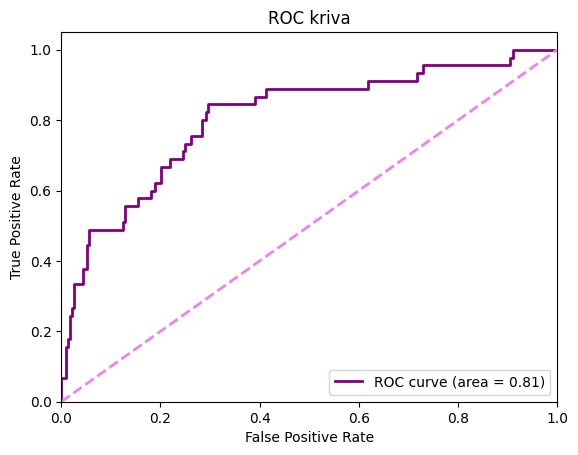

################ METRIKE ZA MODEL Logistic Regression sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7841726618705036
#################################
Precision (Preciznost): 0.3880597014925373
#################################
Recall(odziv): 0.5777777777777777
###############################
F1 Score: 0.4642857142857143
ROC AUC: 0.8073438245112065
Confusion Matrix (matrica konfuzije):
[[192  41]
 [ 19  26]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.82      0.86       233
           1       0.39      0.58      0.46        45

    accuracy                           0.78       278
   macro avg       0.65      0.70      0.66       278
weighted avg       0.83      0.78      0.80       278




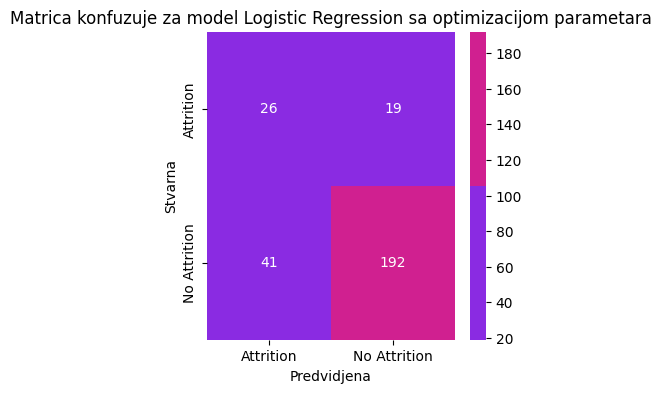

              precision    recall  f1-score   support

           0       0.91      0.82      0.86       233
           1       0.39      0.58      0.46        45

    accuracy                           0.78       278
   macro avg       0.65      0.70      0.66       278
weighted avg       0.83      0.78      0.80       278



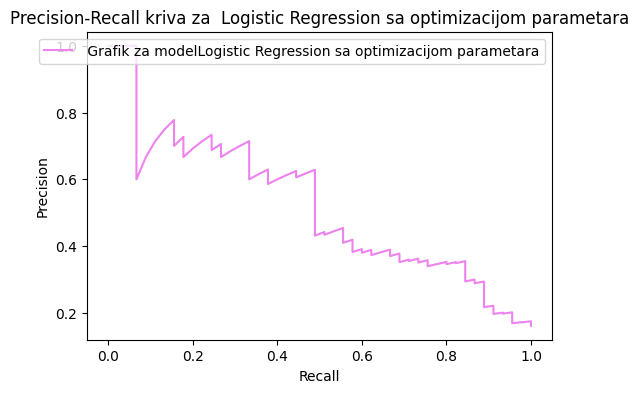

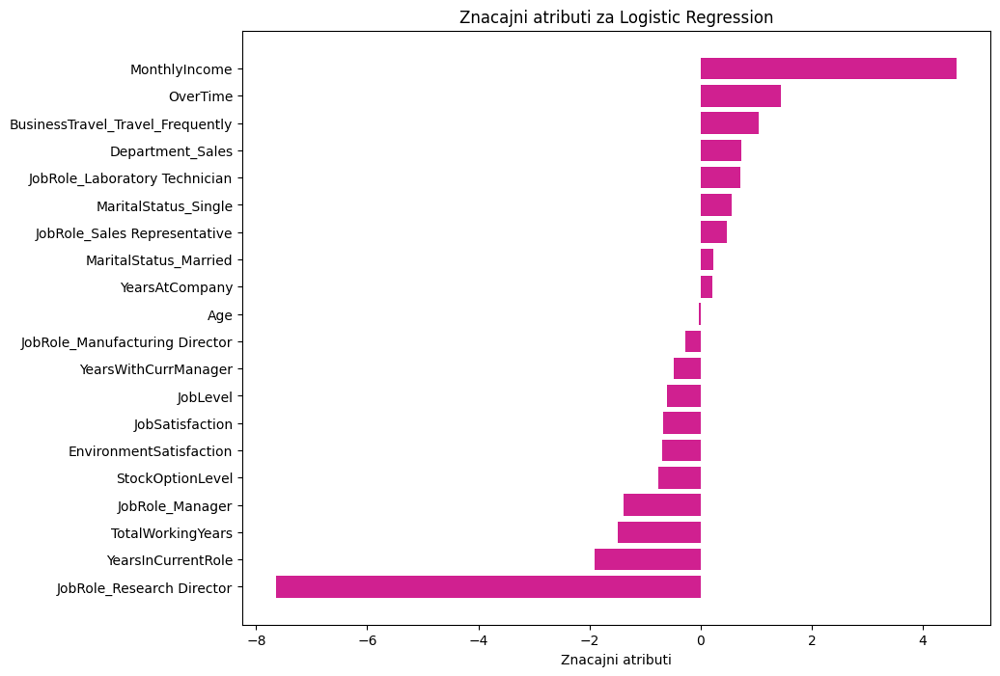

#################################
Accuracy (Tačnost): 0.4029
#################################
Precision (Preciznost): 0.2049
#################################
Recall (Odziv): 0.9333
###############################
F1 Score: 0.3360
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 70 163]
 [  3  42]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.96      0.30      0.46       233
           1       0.20      0.93      0.34        45

    accuracy                           0.40       278
   macro avg       0.58      0.62      0.40       278
weighted avg       0.84      0.40      0.44       278




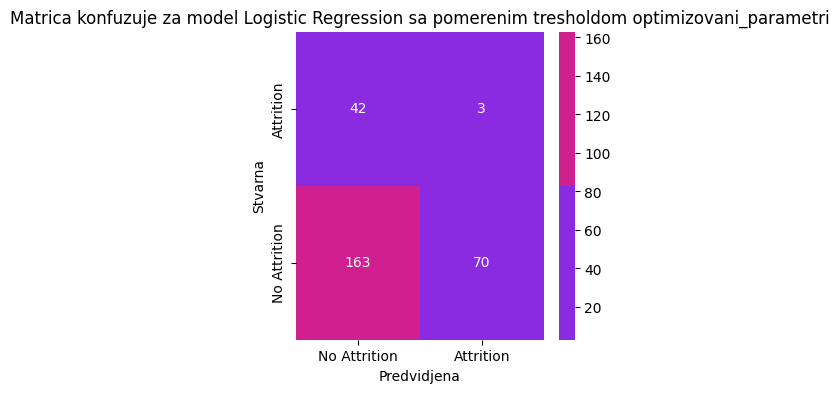

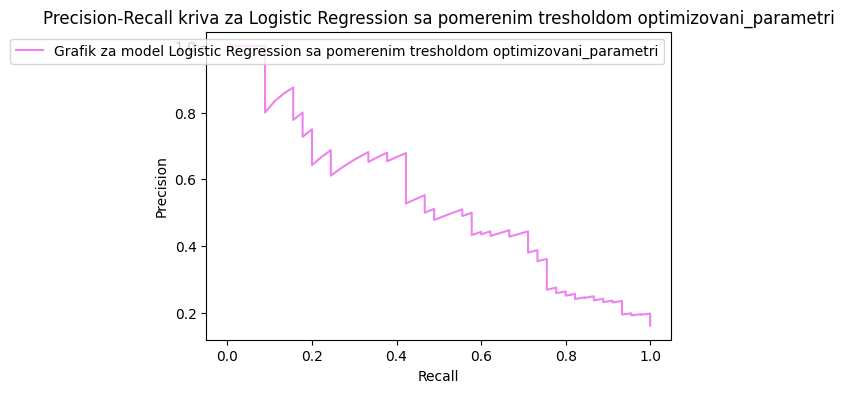

In [169]:
best_model_lr, best_params_lr, table_out_lr, table_out_lr_tr = treniranje_i_tjunovanje(LogisticRegression(), param_grids['Logistic Regression'], "Logistic Regression")

red_new= pd.DataFrame([{
"Ime modela": "Logistic Regression",
"Accuracy":table_out_lr[0],
"Precision":table_out_lr[1],
"Recall" :table_out_lr[2],
"F1-score" :table_out_lr[3],
"ROC_AUC_SCORE":table_out_lr[4],
"KrosvalidacioniScore":table_out_lr[5],
"FALSE NEGATIVI":table_out_lr[6],
"HIPERPARAMETRIZACIJA":table_out_lr[7],
"NAJBOLJI PARAMETRI":table_out_lr[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lr[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_lr_tr[0],
"Accuracy":table_out_lr_tr[1],
"Precision":table_out_lr_tr[2],
"Recall" :table_out_lr_tr[3],
"F1-score" :table_out_lr_tr[4],
"ROC_AUC_SCORE":table_out_lr_tr[5],
"FALSE NEGATIVI":table_out_lr_tr[6],
"treshold":table_out_lr_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)


In [170]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"['BusinessTravel_Travel_Frequently', 'OverTime..."
1,Decision Tree,0.809353,0.428571,0.533333,0.475248,0.697997,0.834943,21,NO,NONE,"['MonthlyIncome', 'TotalWorkingYears', 'Marita..."
2,Random Forest,0.877698,0.789474,0.333333,0.468750,0.799523,0.961904,30,NO,NONE,"['Age', 'MonthlyIncome', 'MaritalStatus_Single']"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"['JobSatisfaction', 'BusinessTravel_Travel_Fre..."
4,Ada Boost,0.820144,0.439024,0.400000,0.418605,0.795851,0.937741,27,NO,NONE,"['BusinessTravel_Travel_Frequently', 'MaritalS..."
5,Bagging,0.877698,0.703704,0.422222,0.527778,0.757034,0.939622,26,NO,NONE,[]
6,XGB,0.874101,0.678571,0.422222,0.520548,0.792036,0.962397,26,NO,NONE,"['JobRole_Sales Representative', 'BusinessTrav..."
7,LGBM Classifier,0.884892,0.740741,0.444444,0.555556,0.784835,0.963578,25,NO,NONE,"['TotalWorkingYears', 'Age', 'MonthlyIncome']"
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"['MonthlyIncome', 'BusinessTravel_Travel_Frequ..."
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]


Treniranje modela Decision Tree nakon optimizacije parametara 
Krosvalidacioni scopre:  88.52%
ROC_AUC Score :  66.84%


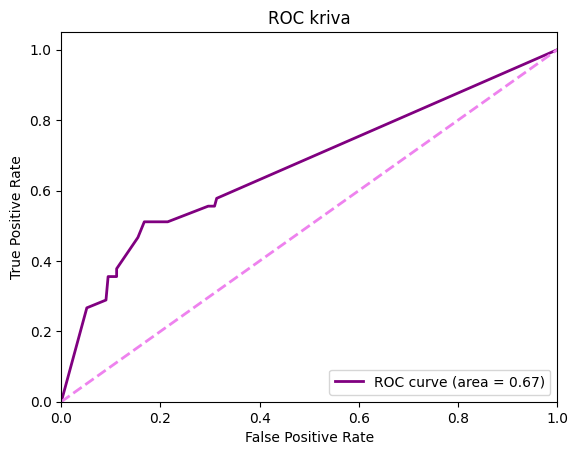

################ METRIKE ZA MODEL Decision Tree sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8057553956834532
#################################
Precision (Preciznost): 0.3953488372093023
#################################
Recall(odziv): 0.37777777777777777
###############################
F1 Score: 0.38636363636363635
ROC AUC: 0.6684310920362423
Confusion Matrix (matrica konfuzije):
[[207  26]
 [ 28  17]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.89      0.88       233
           1       0.40      0.38      0.39        45

    accuracy                           0.81       278
   macro avg       0.64      0.63      0.64       278
weighted avg       0.80      0.81      0.80       278




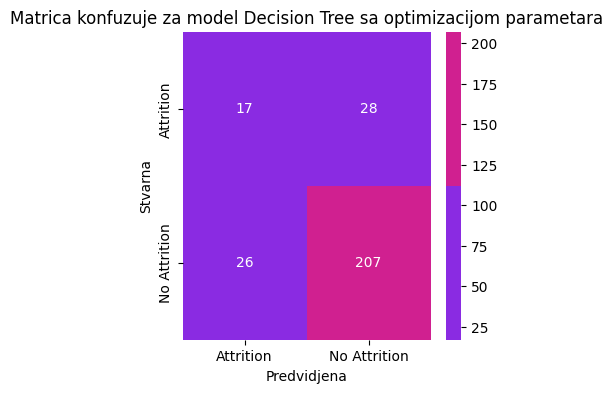

              precision    recall  f1-score   support

           0       0.88      0.89      0.88       233
           1       0.40      0.38      0.39        45

    accuracy                           0.81       278
   macro avg       0.64      0.63      0.64       278
weighted avg       0.80      0.81      0.80       278



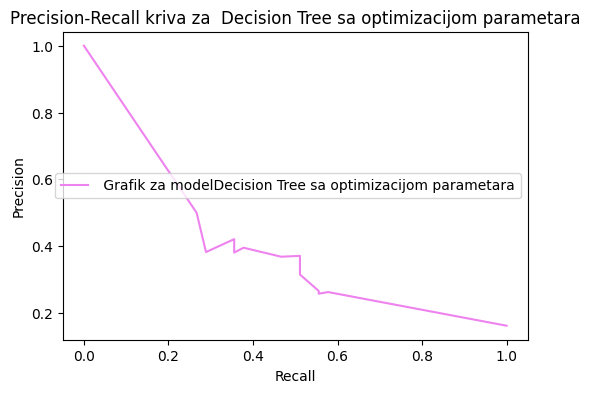

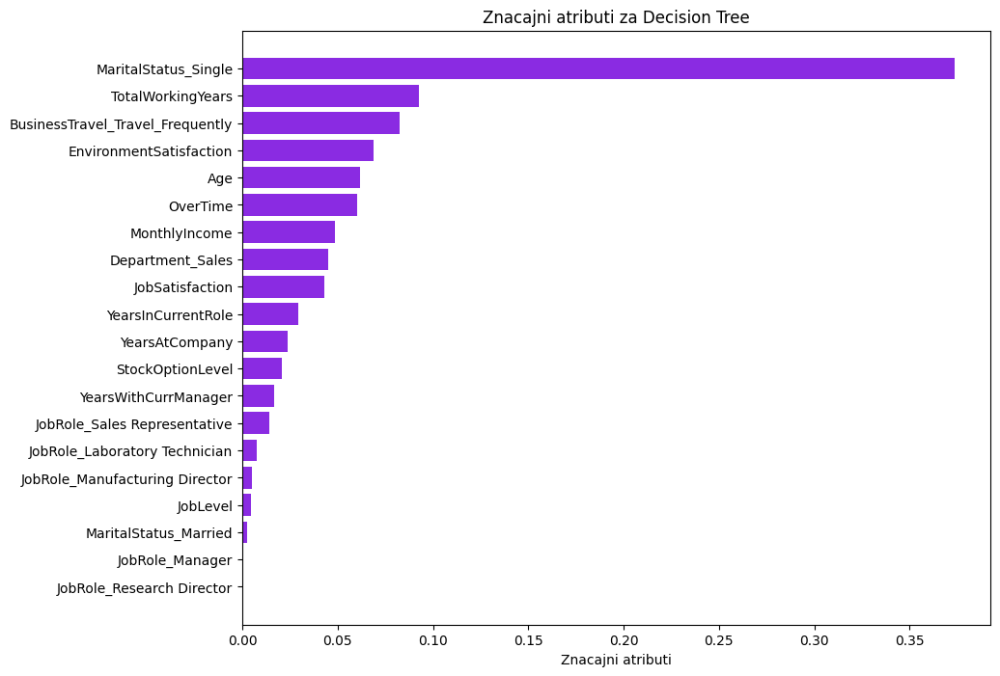

#################################
Accuracy (Tačnost): 0.3669
#################################
Precision (Preciznost): 0.1953
#################################
Recall (Odziv): 0.9333
###############################
F1 Score: 0.3231
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 60 173]
 [  3  42]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.36       278
weighted avg       0.83      0.37      0.39       278




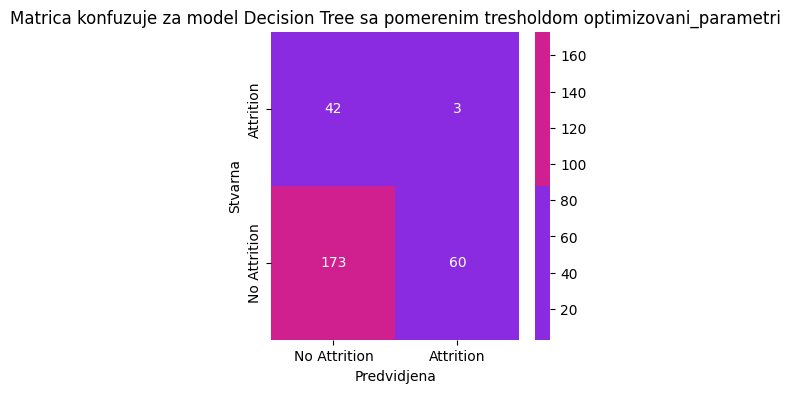

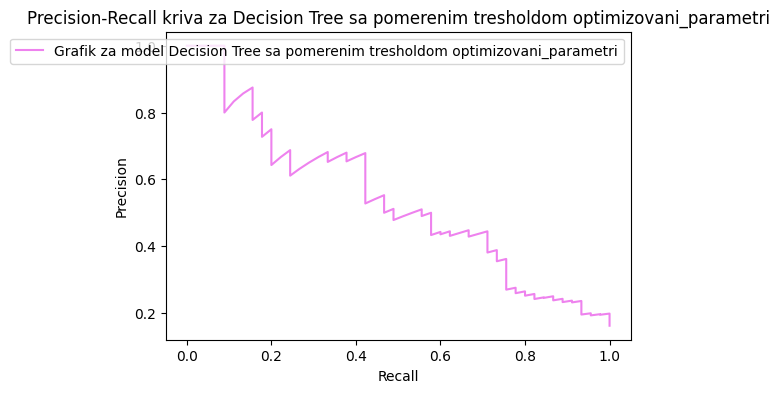

In [172]:
best_model_dt, best_params_dt, table_out_dt,table_out_dt_tr = treniranje_i_tjunovanje(DecisionTreeClassifier(), param_grids['DecisionTree'], "Decision Tree")
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":table_out_dt[0],
"Precision":table_out_dt[1],
"Recall" :table_out_dt[2],
"F1-score" :table_out_dt[3],
"ROC_AUC_SCORE":table_out_dt[4],
"KrosvalidacioniScore":table_out_dt[5],
"FALSE NEGATIVI":table_out_dt[6],
"HIPERPARAMETRIZACIJA":table_out_dt[7],
"NAJBOLJI PARAMETRI":table_out_dt[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_dt[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_dt_tr[0],
"Accuracy":table_out_dt_tr[1],
"Precision":table_out_dt_tr[2],
"Recall" :table_out_dt_tr[3],
"F1-score" :table_out_dt_tr[4],
"ROC_AUC_SCORE":table_out_dt_tr[5],
"FALSE NEGATIVI":table_out_dt_tr[6],
"treshold":table_out_dt_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

Treniranje modela Random Forest nakon optimizacije parametara 
Krosvalidacioni scopre:  96.32%
ROC_AUC Score :  81.04%


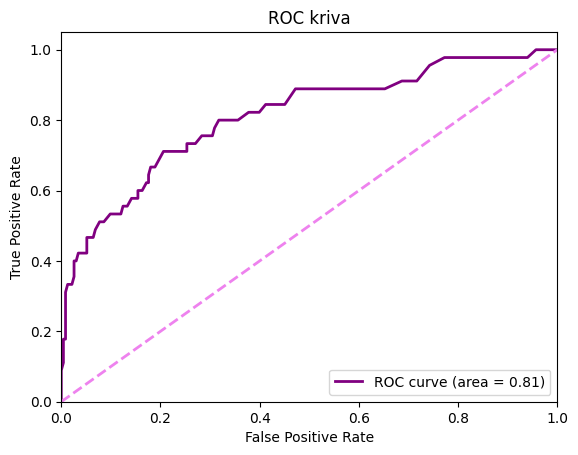

################ METRIKE ZA MODEL Random Forest sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8776978417266187
#################################
Precision (Preciznost): 0.72
#################################
Recall(odziv): 0.4
###############################
F1 Score: 0.5142857142857142
ROC AUC: 0.8104434907010015
Confusion Matrix (matrica konfuzije):
[[226   7]
 [ 27  18]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.72      0.40      0.51        45

    accuracy                           0.88       278
   macro avg       0.81      0.68      0.72       278
weighted avg       0.87      0.88      0.86       278




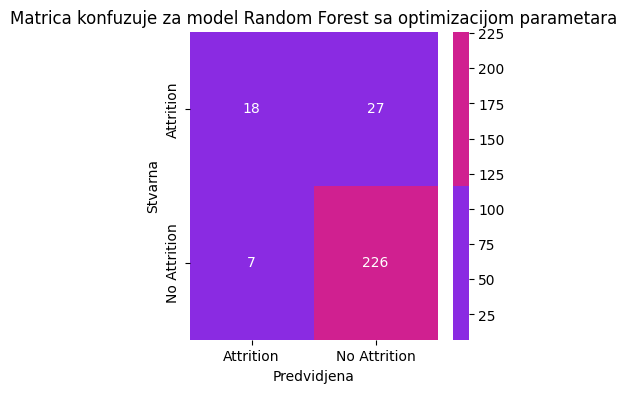

              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.72      0.40      0.51        45

    accuracy                           0.88       278
   macro avg       0.81      0.68      0.72       278
weighted avg       0.87      0.88      0.86       278



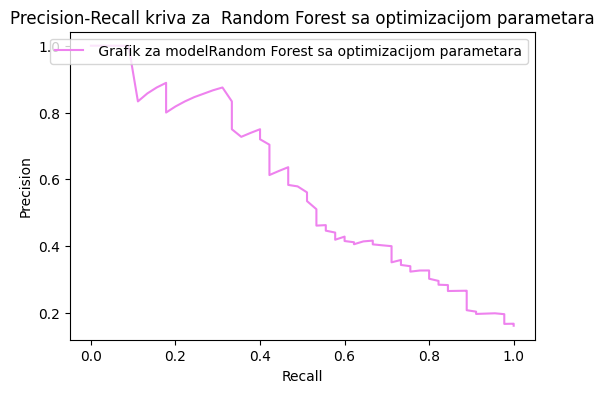

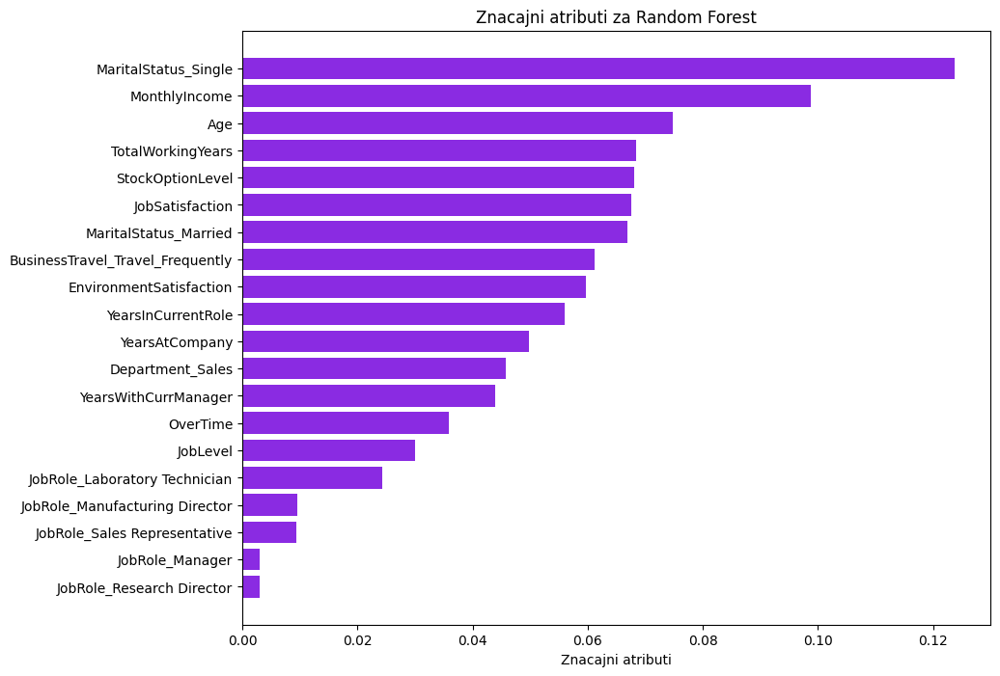

#################################
Accuracy (Tačnost): 0.3669
#################################
Precision (Preciznost): 0.1953
#################################
Recall (Odziv): 0.9333
###############################
F1 Score: 0.3231
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 60 173]
 [  3  42]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.36       278
weighted avg       0.83      0.37      0.39       278




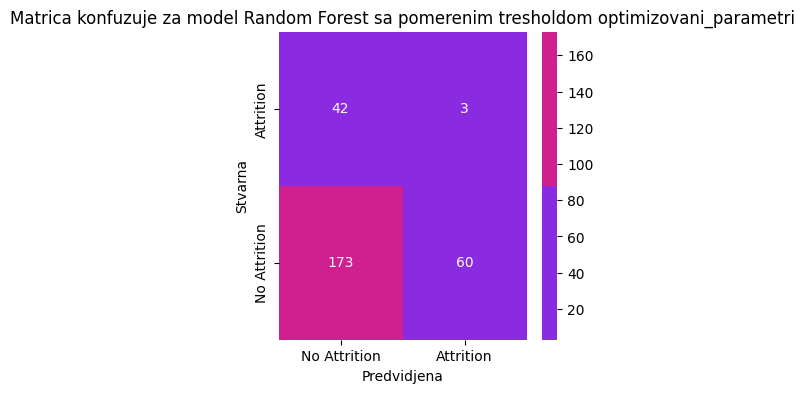

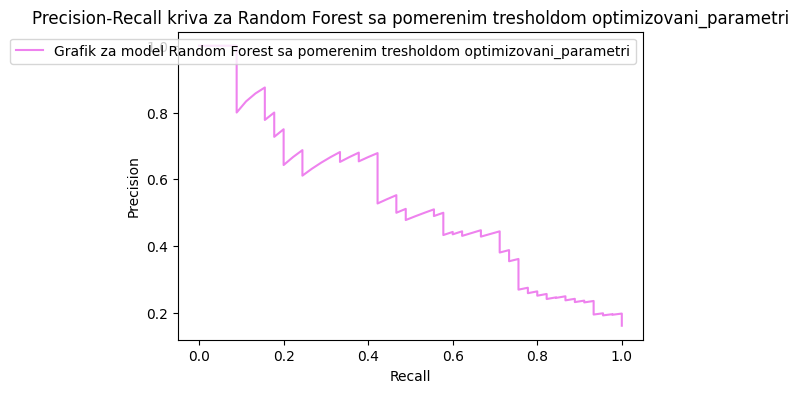

In [173]:
best_model_rf, best_params_rf, table_out_rf,table_out_rf_tr = treniranje_i_tjunovanje(RandomForestClassifier(), param_grids['Random Forest'], "Random Forest")

red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":table_out_rf[0],
"Precision":table_out_rf[1],
"Recall" :table_out_rf[2],
"F1-score" :table_out_rf[3],
"ROC_AUC_SCORE":table_out_rf[4],
"KrosvalidacioniScore":table_out_rf[5],
"FALSE NEGATIVI":table_out_rf[6],
"HIPERPARAMETRIZACIJA":table_out_rf[7],
"NAJBOLJI PARAMETRI":table_out_rf[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_rf[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_rf_tr[0],
"Accuracy":table_out_rf_tr[1],
"Precision":table_out_rf_tr[2],
"Recall" :table_out_rf_tr[3],
"F1-score" :table_out_rf_tr[4],
"ROC_AUC_SCORE":table_out_rf_tr[5],
"FALSE NEGATIVI":table_out_rf_tr[6],
"treshold":table_out_rf_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

Treniranje modela Gradient Boosting nakon optimizacije parametara 
Krosvalidacioni scopre:  96.90%
ROC_AUC Score :  80.83%


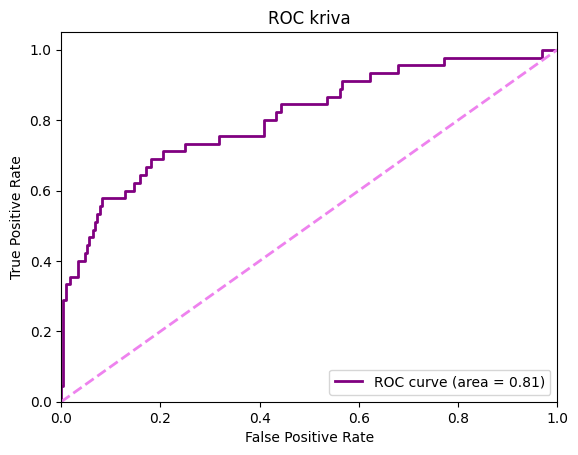

################ METRIKE ZA MODEL Gradient Boosting sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8741007194244604
#################################
Precision (Preciznost): 0.6923076923076923
#################################
Recall(odziv): 0.4
###############################
F1 Score: 0.5070422535211268
ROC AUC: 0.8082975679542204
Confusion Matrix (matrica konfuzije):
[[225   8]
 [ 27  18]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.69      0.40      0.51        45

    accuracy                           0.87       278
   macro avg       0.79      0.68      0.72       278
weighted avg       0.86      0.87      0.86       278




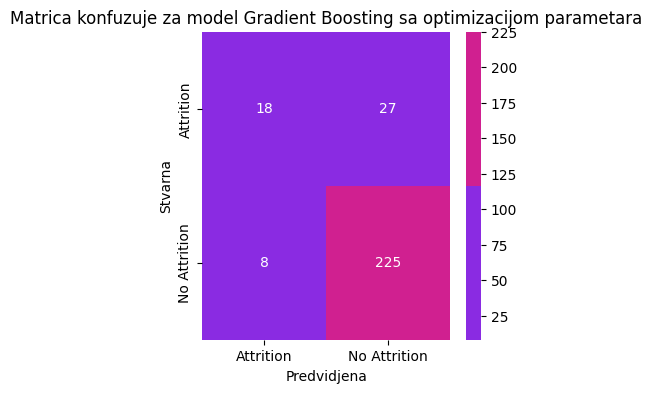

              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.69      0.40      0.51        45

    accuracy                           0.87       278
   macro avg       0.79      0.68      0.72       278
weighted avg       0.86      0.87      0.86       278



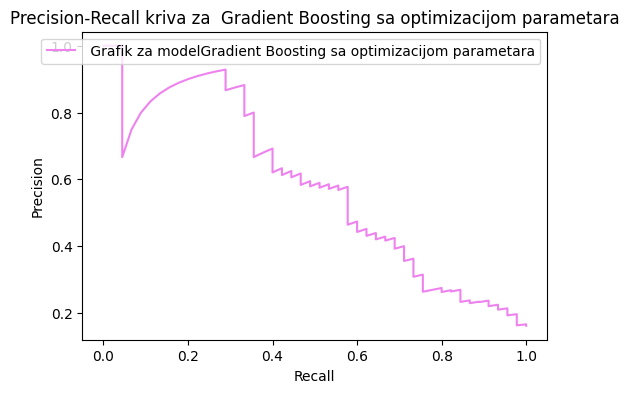

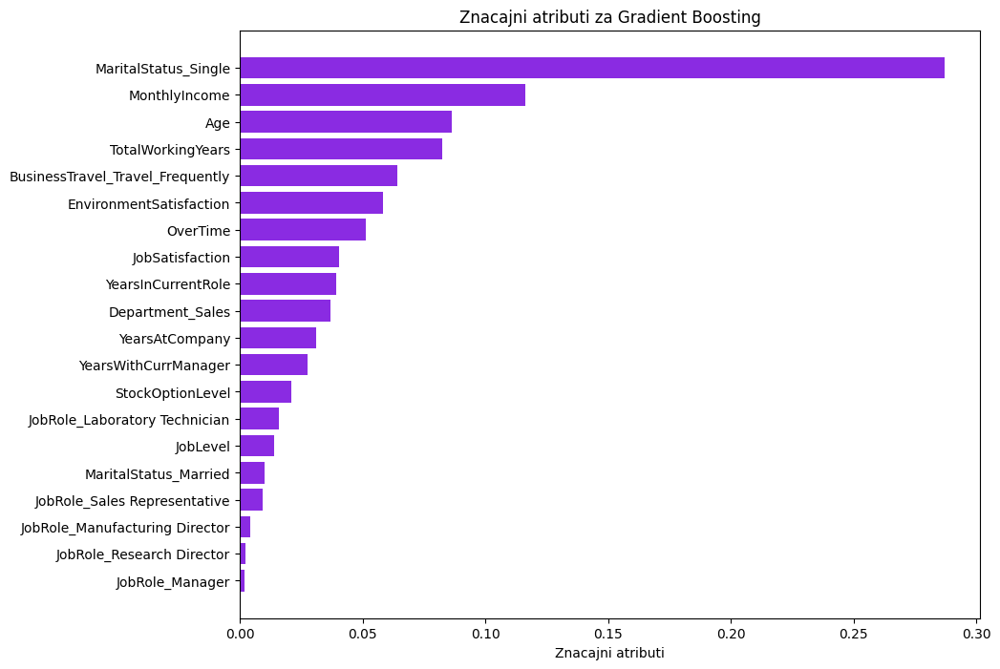

#################################
Accuracy (Tačnost): 0.3165
#################################
Precision (Preciznost): 0.1915
#################################
Recall (Odziv): 1.0000
###############################
F1 Score: 0.3214
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 43 190]
 [  0  45]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       1.00      0.18      0.31       233
           1       0.19      1.00      0.32        45

    accuracy                           0.32       278
   macro avg       0.60      0.59      0.32       278
weighted avg       0.87      0.32      0.31       278




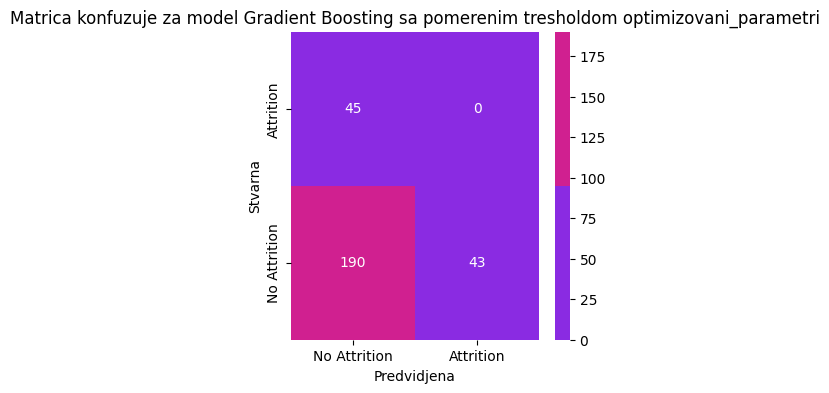

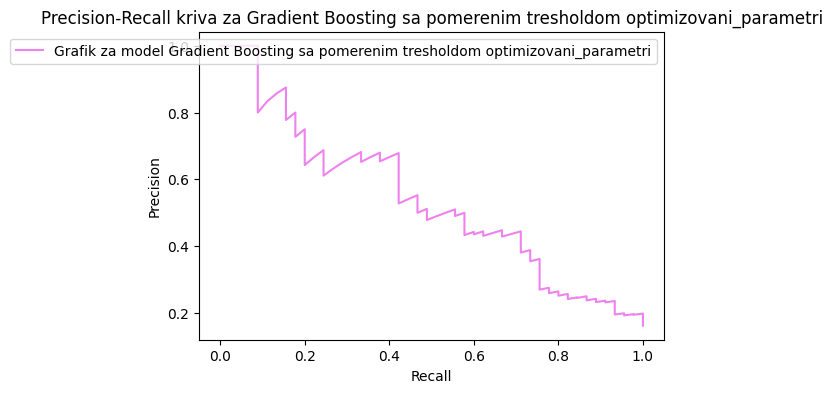

In [174]:
best_model_gb,best_params_gb, table_out_gb, table_out_gb_tr = treniranje_i_tjunovanje(GradientBoostingClassifier(), param_grids['Gradient Boosting'], "Gradient Boosting")

red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":table_out_gb[0],
"Precision":table_out_gb[1],
"Recall" :table_out_gb[2],
"F1-score" :table_out_gb[3],
"ROC_AUC_SCORE":table_out_gb[4],
"KrosvalidacioniScore":table_out_gb[5],
"FALSE NEGATIVI":table_out_gb[6],
"HIPERPARAMETRIZACIJA":table_out_gb[7],
"NAJBOLJI PARAMETRI":table_out_gb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_gb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_gb_tr[0],
"Accuracy":table_out_gb_tr[1],
"Precision":table_out_gb_tr[2],
"Recall" :table_out_gb_tr[3],
"F1-score" :table_out_gb_tr[4],
"ROC_AUC_SCORE":table_out_gb_tr[5],
"FALSE NEGATIVI":table_out_gb_tr[6],
"treshold":table_out_gb_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

In [168]:
param_grids

{'Logistic Regression': {'C': [0.01, 0.1, 1, 10, 100],
  'solver': ['lbfgs', 'liblinear']},
 'Decision Tree': {'max_depth': [None, 10, 20, 30, 40],
  'min_samples_split': [2, 5, 10, 20]},
 'Random Forest': {'n_estimators': [50, 100, 200],
  'max_depth': [None, 10, 15, 20, 30],
  'min_samples_split': [2, 5, 10]},
 'Gradient Boosting': {'n_estimators': [50, 100, 200],
  'learning_rate': [0.01, 0.1, 0.2],
  'max_depth': [3, 5, 7],
  'subsample': [0.8, 0.9]},
 'AdaBoost': {'n_estimators': [50, 100, 200],
  'learning_rate': [0.01, 0.1, 1, 2]},
 'Bagging': {'n_estimators': [10, 50, 100],
  'max_samples': [0.5, 1.0],
  'max_features': [0.5, 1.0]},
 'XGBoost': {'n_estimators': [50, 80, 100, 200, 500, 1000],
  'learning_rate': [0.01, 0.1, 0.25],
  'max_depth': [3, 5, 9],
  'scale_pos_weight': [1, 5]},
 'LightGBM': {'n_estimators': [80, 200, 500, 1000],
  'learning_rate': [0.01, 0.1, 0.25, 1],
  'num_leaves': [31, 62, 127],
  'feature_fraction': [0.6, 0.8],
  'min_data_in_leaf': [20, 40, 60]},
 

Treniranje modela AdaBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  94.31%
ROC_AUC Score :  79.72%


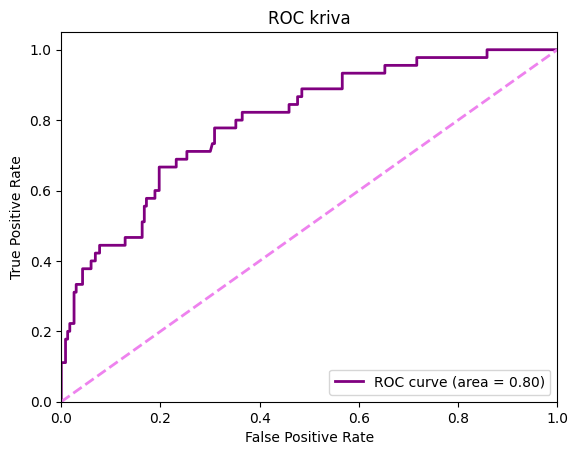

################ METRIKE ZA MODEL AdaBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.841726618705036
#################################
Precision (Preciznost): 0.5128205128205128
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.47619047619047616
ROC AUC: 0.7971864568431093
Confusion Matrix (matrica konfuzije):
[[214  19]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       233
           1       0.51      0.44      0.48        45

    accuracy                           0.84       278
   macro avg       0.70      0.68      0.69       278
weighted avg       0.83      0.84      0.84       278




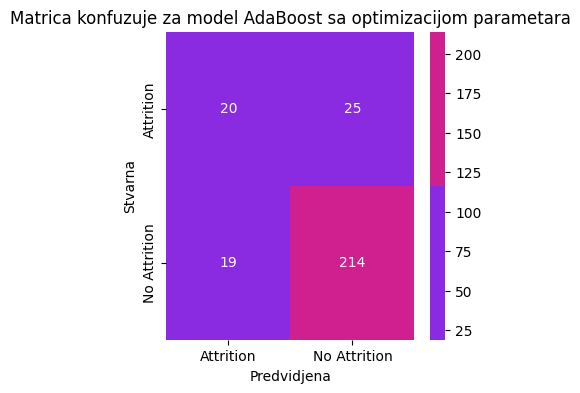

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       233
           1       0.51      0.44      0.48        45

    accuracy                           0.84       278
   macro avg       0.70      0.68      0.69       278
weighted avg       0.83      0.84      0.84       278



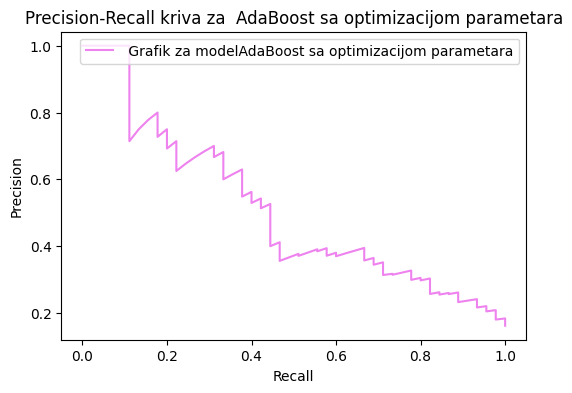

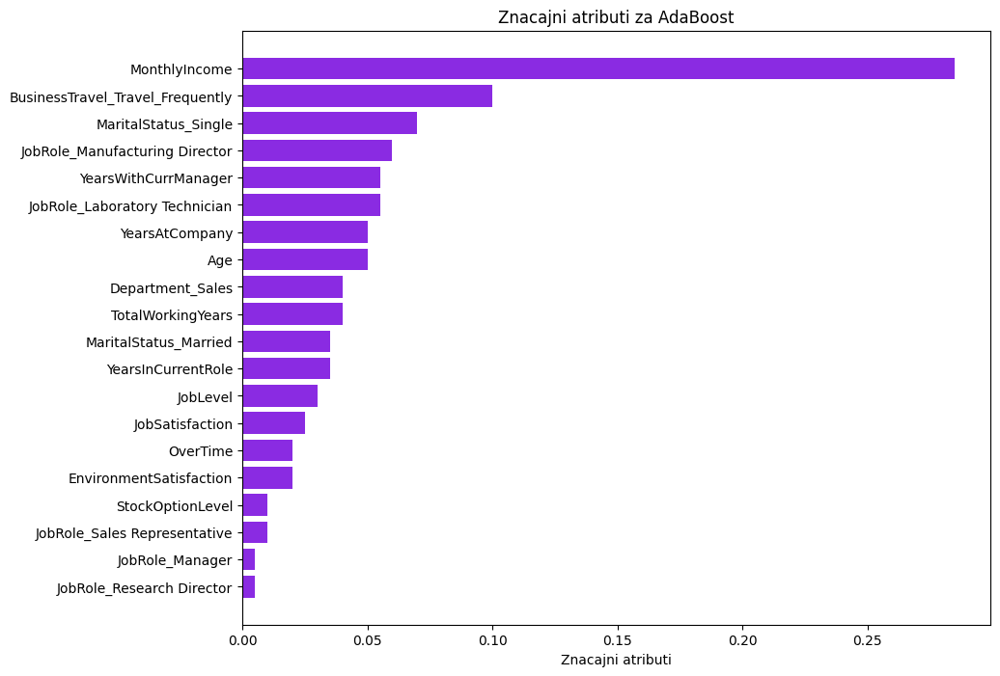

#################################
Accuracy (Tačnost): 0.3705
#################################
Precision (Preciznost): 0.1963
#################################
Recall (Odziv): 0.9333
###############################
F1 Score: 0.3243
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 61 172]
 [  3  42]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.37       278
weighted avg       0.83      0.37      0.40       278




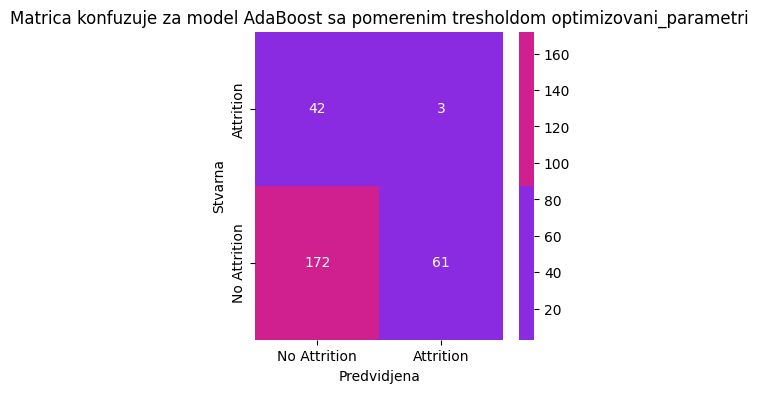

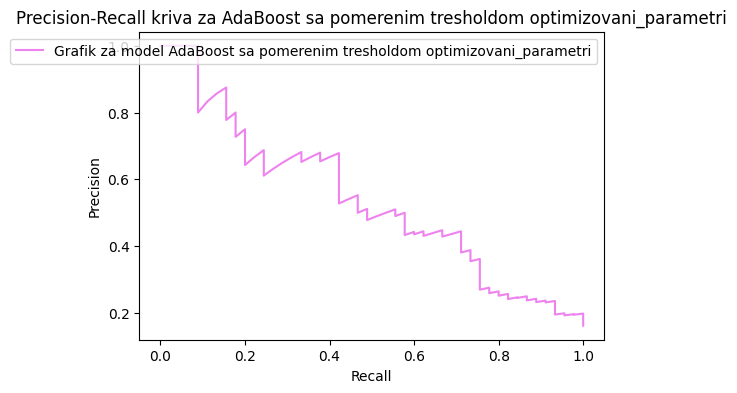

In [176]:
best_model_ab,best_params_ab, table_out_ab , table_out_ab_tr= treniranje_i_tjunovanje(AdaBoostClassifier(), param_grids['AdaBoost'], "AdaBoost")

red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":table_out_ab[0],
"Precision":table_out_ab[1],
"Recall" :table_out_ab[2],
"F1-score" :table_out_ab[3],
"ROC_AUC_SCORE":table_out_ab[4],
"KrosvalidacioniScore":table_out_ab[5],
"FALSE NEGATIVI":table_out_ab[6],
"HIPERPARAMETRIZACIJA":table_out_ab[7],
"NAJBOLJI PARAMETRI":table_out_ab[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_ab[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_ab_tr[0],
"Accuracy":table_out_ab_tr[1],
"Precision":table_out_ab_tr[2],
"Recall" :table_out_ab_tr[3],
"F1-score" :table_out_ab_tr[4],
"ROC_AUC_SCORE":table_out_ab_tr[5],
"FALSE NEGATIVI":table_out_ab_tr[6],
"treshold":table_out_ab_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

Treniranje modela Bagging nakon optimizacije parametara 
Krosvalidacioni scopre:  96.46%
ROC_AUC Score :  80.25%


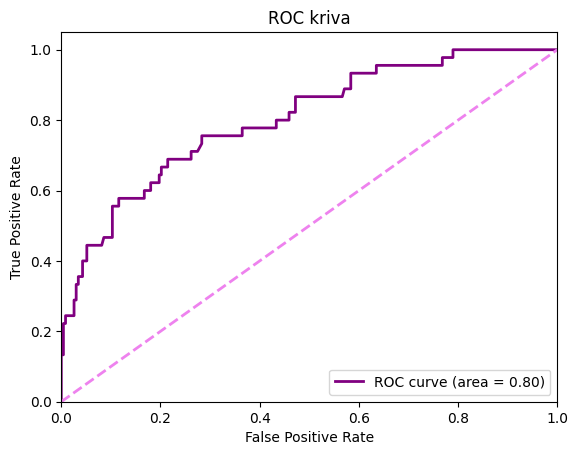

################ METRIKE ZA MODEL Bagging sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8597122302158273
#################################
Precision (Preciznost): 0.6875
#################################
Recall(odziv): 0.24444444444444444
###############################
F1 Score: 0.360655737704918
ROC AUC: 0.802479732951836
Confusion Matrix (matrica konfuzije):
[[228   5]
 [ 34  11]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       233
           1       0.69      0.24      0.36        45

    accuracy                           0.86       278
   macro avg       0.78      0.61      0.64       278
weighted avg       0.84      0.86      0.83       278




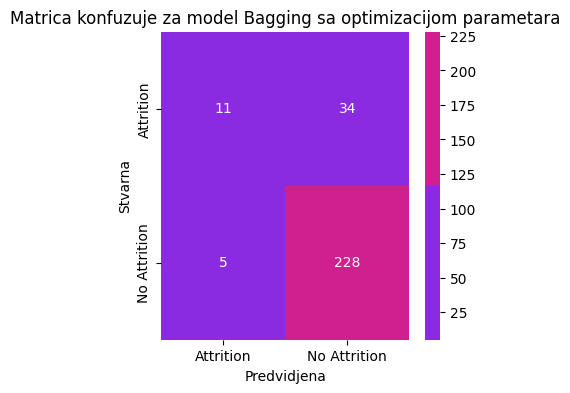

              precision    recall  f1-score   support

           0       0.87      0.98      0.92       233
           1       0.69      0.24      0.36        45

    accuracy                           0.86       278
   macro avg       0.78      0.61      0.64       278
weighted avg       0.84      0.86      0.83       278



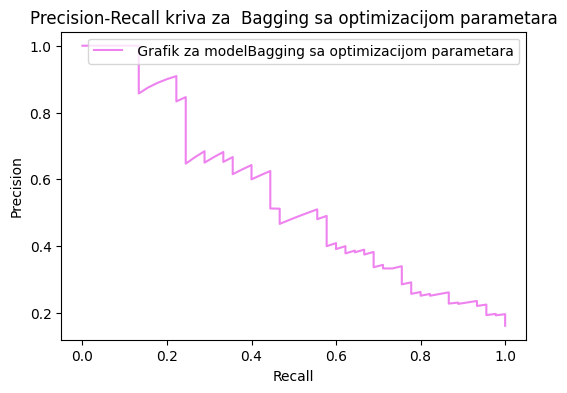

Model nema podržanu značajnost attributa
#################################
Accuracy (Tačnost): 0.3633
#################################
Precision (Preciznost): 0.1972
#################################
Recall (Odziv): 0.9556
###############################
F1 Score: 0.3270
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 58 175]
 [  2  43]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.97      0.25      0.40       233
           1       0.20      0.96      0.33        45

    accuracy                           0.36       278
   macro avg       0.58      0.60      0.36       278
weighted avg       0.84      0.36      0.38       278




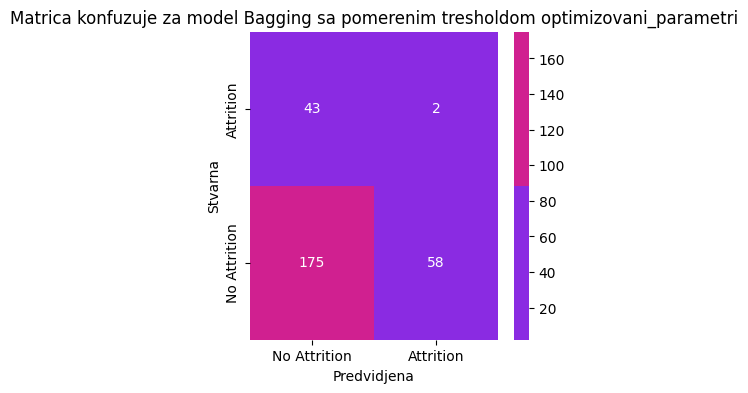

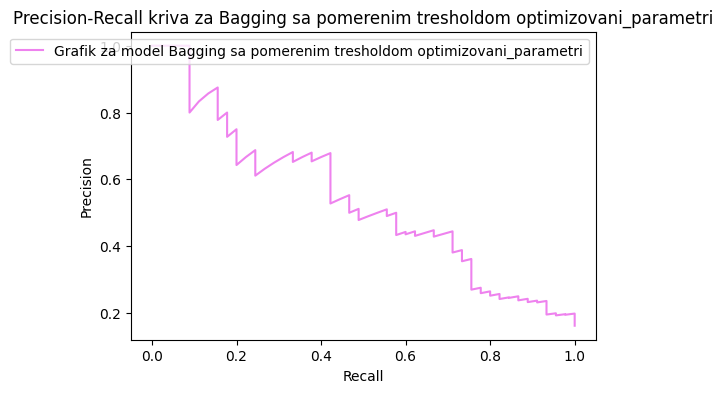

In [175]:
best_model_bg, best_params_bg, table_out_bg, table_out_bg_tr = treniranje_i_tjunovanje(BaggingClassifier(), param_grids['Bagging'], "Bagging")
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":table_out_bg[0],
"Precision":table_out_bg[1],
"Recall" :table_out_bg[2],
"F1-score" :table_out_bg[3],
"ROC_AUC_SCORE":table_out_bg[4],
"KrosvalidacioniScore":table_out_bg[5],
"FALSE NEGATIVI":table_out_bg[6],
"HIPERPARAMETRIZACIJA":table_out_bg[7],
"NAJBOLJI PARAMETRI":table_out_bg[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_bg[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_bg_tr[0],
"Accuracy":table_out_bg_tr[1],
"Precision":table_out_bg_tr[2],
"Recall" :table_out_bg_tr[3],
"F1-score" :table_out_bg_tr[4],
"ROC_AUC_SCORE":table_out_bg_tr[5],
"FALSE NEGATIVI":table_out_bg_tr[6],
"treshold":table_out_bg_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Treniranje modela XGBoost nakon optimizacije parametara 


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `u

Krosvalidacioni scopre:  96.31%
ROC_AUC Score :  80.45%


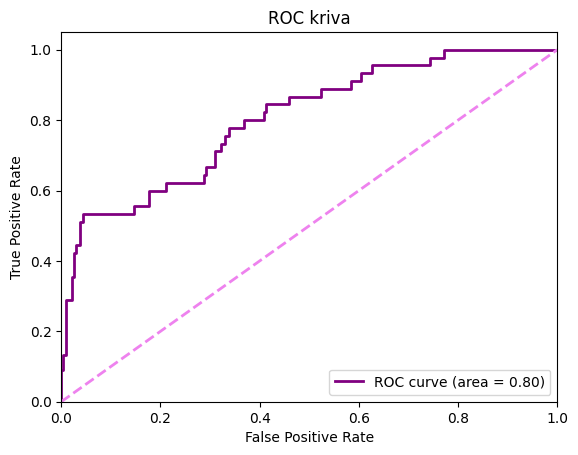

################ METRIKE ZA MODEL XGBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8812949640287769
#################################
Precision (Preciznost): 0.7142857142857143
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5479452054794521
ROC AUC: 0.804482594182165
Confusion Matrix (matrica konfuzije):
[[225   8]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.71      0.44      0.55        45

    accuracy                           0.88       278
   macro avg       0.81      0.71      0.74       278
weighted avg       0.87      0.88      0.87       278




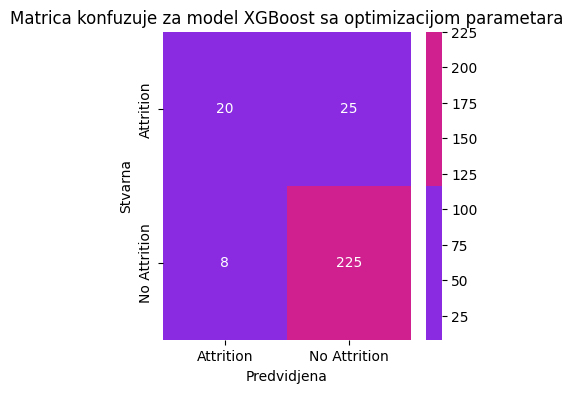

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.71      0.44      0.55        45

    accuracy                           0.88       278
   macro avg       0.81      0.71      0.74       278
weighted avg       0.87      0.88      0.87       278



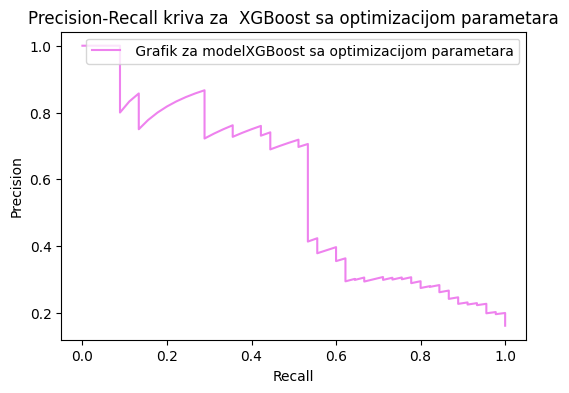

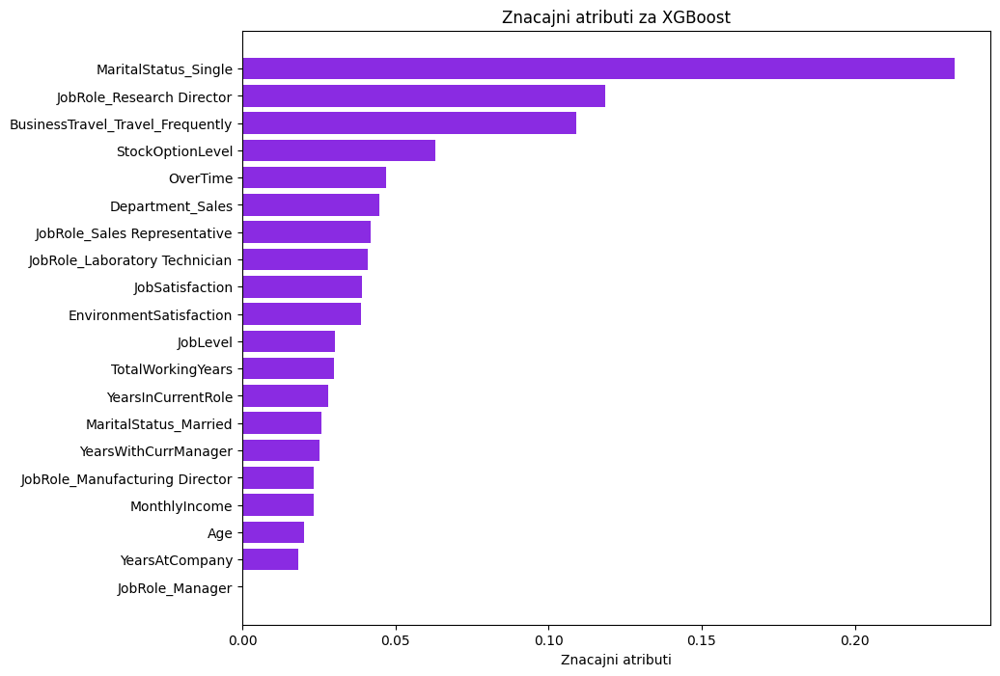

#################################
Accuracy (Tačnost): 0.3705
#################################
Precision (Preciznost): 0.1991
#################################
Recall (Odziv): 0.9556
###############################
F1 Score: 0.3295
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 60 173]
 [  2  43]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.97      0.26      0.41       233
           1       0.20      0.96      0.33        45

    accuracy                           0.37       278
   macro avg       0.58      0.61      0.37       278
weighted avg       0.84      0.37      0.39       278




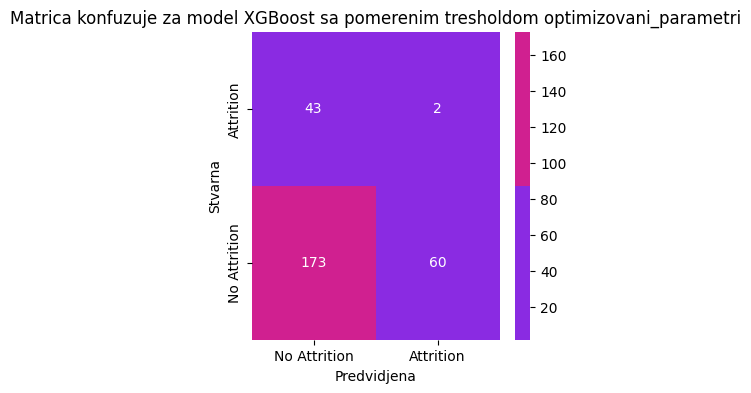

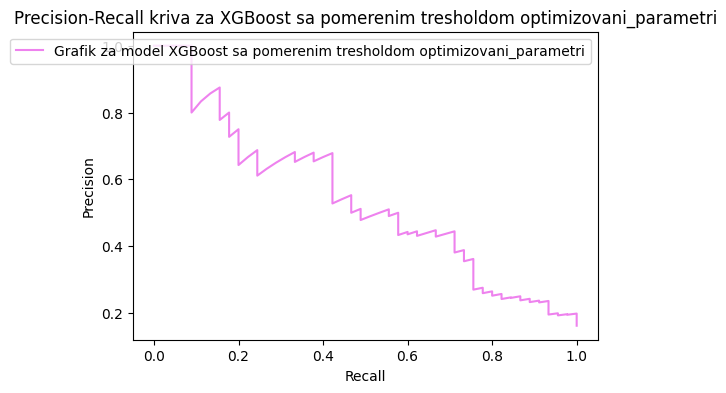

In [177]:
best_model_xgb, best_params_xgb, table_out_xgb,table_out_xgb_tr = treniranje_i_tjunovanje(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'), param_grids['XGBoost'], "XGBoost")
red_new= pd.DataFrame([{
"Ime modela": "XGBoost",
"Accuracy":table_out_xgb[0],
"Precision":table_out_xgb[1],
"Recall" :table_out_xgb[2],
"F1-score" :table_out_xgb[3],
"ROC_AUC_SCORE":table_out_xgb[4],
"KrosvalidacioniScore":table_out_xgb[5],
"FALSE NEGATIVI":table_out_xgb[6],
"HIPERPARAMETRIZACIJA":table_out_xgb[7],
"NAJBOLJI PARAMETRI":table_out_xgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_xgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_xgb_tr[0],
"Accuracy":table_out_xgb_tr[1],
"Precision":table_out_xgb_tr[2],
"Recall" :table_out_xgb_tr[3],
"F1-score" :table_out_xgb_tr[4],
"ROC_AUC_SCORE":table_out_xgb_tr[5],
"FALSE NEGATIVI":table_out_xgb_tr[6],
"treshold":table_out_xgb_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

In [179]:
param_grids

{'LGBM Classifier': {'n_estimators': [100, 200, 500],
  'learning_rate': [0.05, 0.1],
  'num_leaves': [35],
  'max_depth': [10, 20],
  'min_child_samples': [40],
  'subsample': [0.8],
  'colsample_bytree': [0.6]},
 'Random Forest': {'n_estimators': [100, 200, 500],
  'max_depth': [None, 10, 20, 30],
  'min_samples_leaf': [1, 2, 4]},
 'Naive Bayes': {'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06]},
 'CatBoost': {'iterations': [300, 500],
  'learning_rate': [0.05, 0.1],
  'depth': [4, 8],
  'border_count': [50]},
 'Logistic Regression': {'C': [0.01, 1, 5, 10, 100], 'solver': ['liblinear']},
 'XGBoost': {'n_estimators': [100, 200, 500, 1000],
  'learning_rate': [0.1, 0.25],
  'max_depth': [3, 5, 7],
  'min_child_weight': [5],
  'subsample': [0.8],
  'colsample_bytree': [0.8]},
 'AdaBoost': {'n_estimators': [50, 100, 200],
  'learning_rate': [0.01, 0.1, 0.5, 1]},
 'Gradient Boosting': {'n_estimators': [82, 100, 200, 500],
  'learning_rate': [0.1, 0.2],
  'max_depth': [3, 5, 7],
  'subsample

Treniranje modela LightGBM nakon optimizacije parametara 
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 628, number of negative: 740
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1238
[LightGBM] [Info] Number of data points in the train set: 1368, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459064 -> initscore=-0.164110
[LightGBM] [Info] Start training from score -0.164110
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

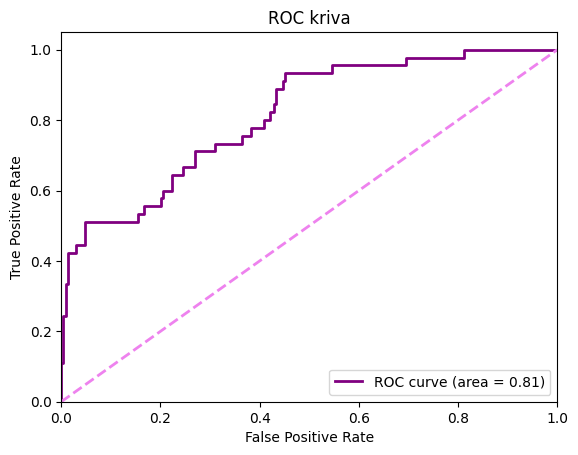

################ METRIKE ZA MODEL LightGBM sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8812949640287769
#################################
Precision (Preciznost): 0.7307692307692307
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.5352112676056338
ROC AUC: 0.813924654268002
Confusion Matrix (matrica konfuzije):
[[226   7]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.73      0.42      0.54        45

    accuracy                           0.88       278
   macro avg       0.81      0.70      0.73       278
weighted avg       0.87      0.88      0.87       278




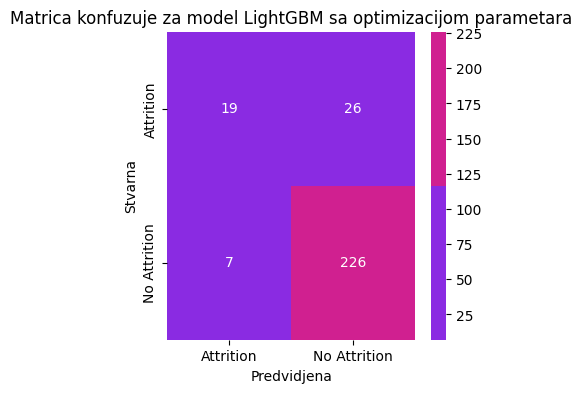

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       233
           1       0.73      0.42      0.54        45

    accuracy                           0.88       278
   macro avg       0.81      0.70      0.73       278
weighted avg       0.87      0.88      0.87       278



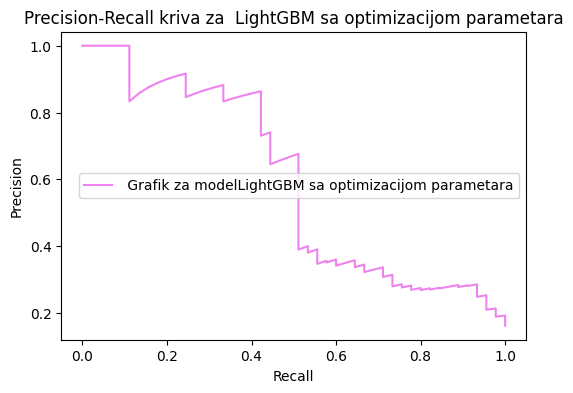

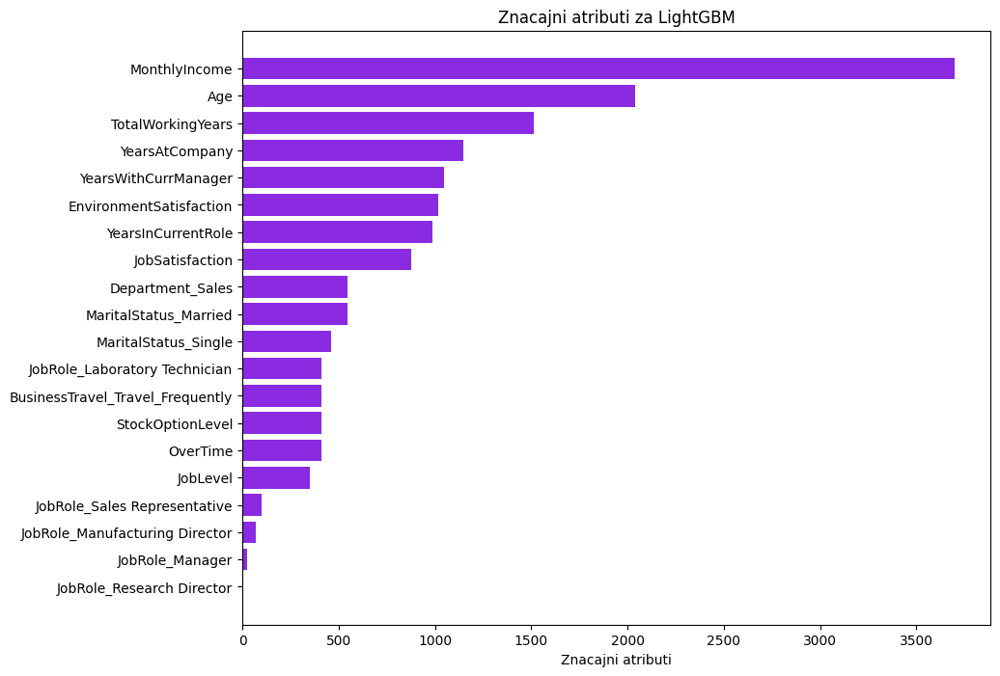

#################################
Accuracy (Tačnost): 0.3705
#################################
Precision (Preciznost): 0.1991
#################################
Recall (Odziv): 0.9556
###############################
F1 Score: 0.3295
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 60 173]
 [  2  43]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.97      0.26      0.41       233
           1       0.20      0.96      0.33        45

    accuracy                           0.37       278
   macro avg       0.58      0.61      0.37       278
weighted avg       0.84      0.37      0.39       278




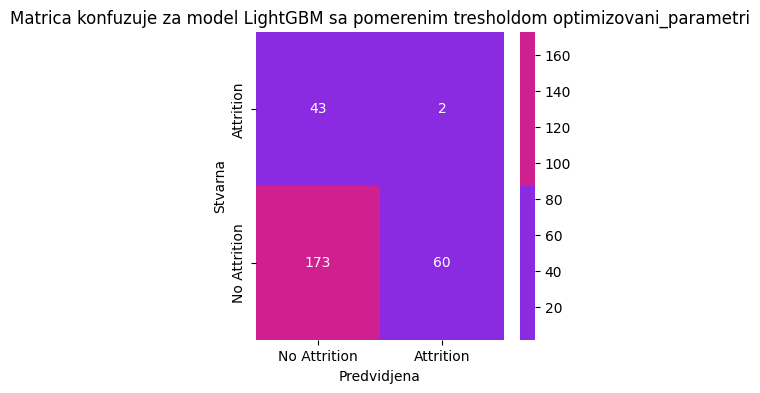

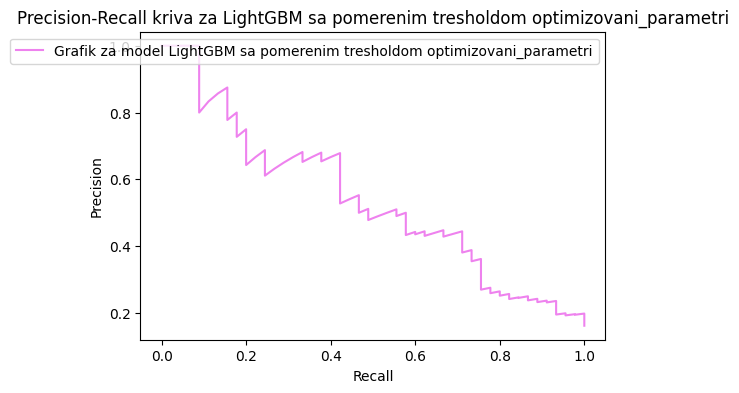

In [180]:
best_model_lgb,best_params_lgb, table_out_lgb,table_out_lgb_tr = treniranje_i_tjunovanje(lgb.LGBMClassifier(), param_grids['LGBM Classifier'], "LightGBM")
red_new= pd.DataFrame([{
"Ime modela": "LightGBM",
"Accuracy":table_out_lgb[0],
"Precision":table_out_lgb[1],
"Recall" :table_out_lgb[2],
"F1-score" :table_out_lgb[3],
"ROC_AUC_SCORE":table_out_lgb[4],
"KrosvalidacioniScore":table_out_lgb[5],
"FALSE NEGATIVI":table_out_lgb[6],
"HIPERPARAMETRIZACIJA":table_out_lgb[7],
"NAJBOLJI PARAMETRI":table_out_lgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)



rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_lgb_tr[0],
"Accuracy":table_out_lgb_tr[1],
"Precision":table_out_lgb_tr[2],
"Recall" :table_out_lgb_tr[3],
"F1-score" :table_out_lgb_tr[4],
"ROC_AUC_SCORE":table_out_lgb_tr[5],
"FALSE NEGATIVI":table_out_lgb_tr[6],
"treshold":table_out_lgb_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

In [181]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("RESULTFINAL_withoutCATBOOST.xlsx")

In [182]:
REZULTATI_TABELA_treshold.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("withoutCATBOOST.xlsx")

Treniranje modela CatBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  96.88%
ROC_AUC Score :  79.86%


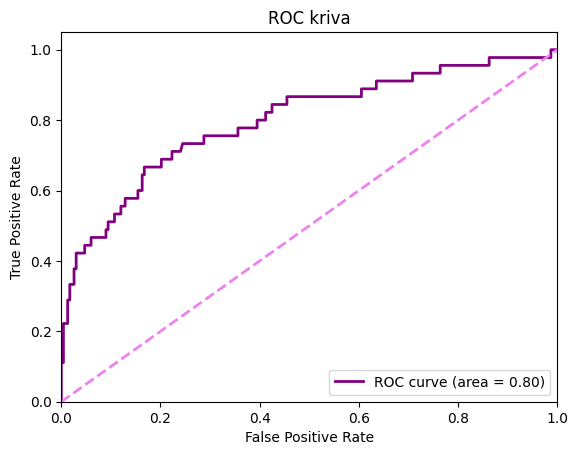

################ METRIKE ZA MODEL CatBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8776978417266187
#################################
Precision (Preciznost): 0.72
#################################
Recall(odziv): 0.4
###############################
F1 Score: 0.5142857142857142
ROC AUC: 0.79861707200763
Confusion Matrix (matrica konfuzije):
[[226   7]
 [ 27  18]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.72      0.40      0.51        45

    accuracy                           0.88       278
   macro avg       0.81      0.68      0.72       278
weighted avg       0.87      0.88      0.86       278




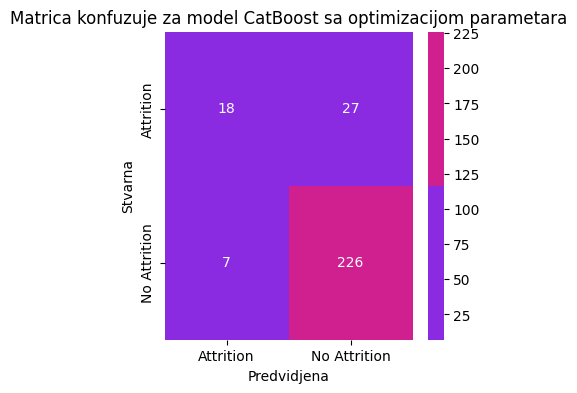

              precision    recall  f1-score   support

           0       0.89      0.97      0.93       233
           1       0.72      0.40      0.51        45

    accuracy                           0.88       278
   macro avg       0.81      0.68      0.72       278
weighted avg       0.87      0.88      0.86       278



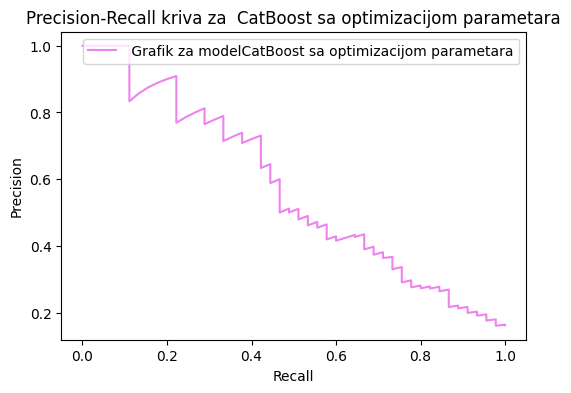

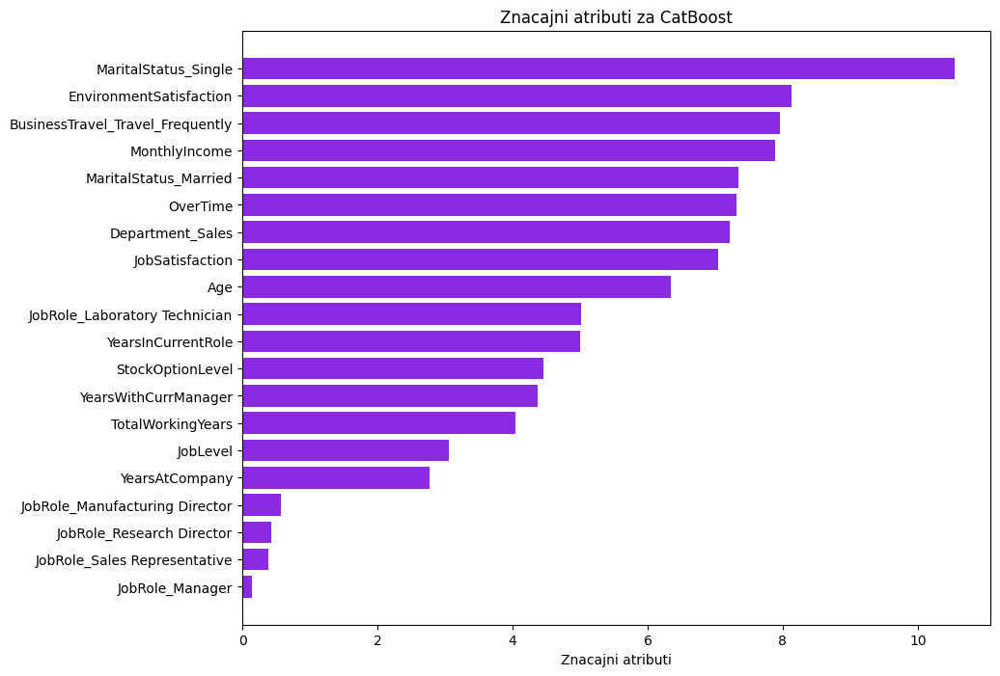

#################################
Accuracy (Tačnost): 0.3705
#################################
Precision (Preciznost): 0.1963
#################################
Recall (Odziv): 0.9333
###############################
F1 Score: 0.3243
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[ 61 172]
 [  3  42]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.95      0.26      0.41       233
           1       0.20      0.93      0.32        45

    accuracy                           0.37       278
   macro avg       0.57      0.60      0.37       278
weighted avg       0.83      0.37      0.40       278




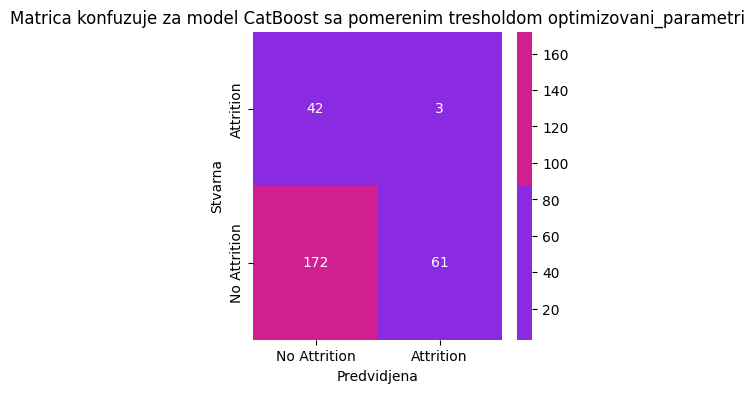

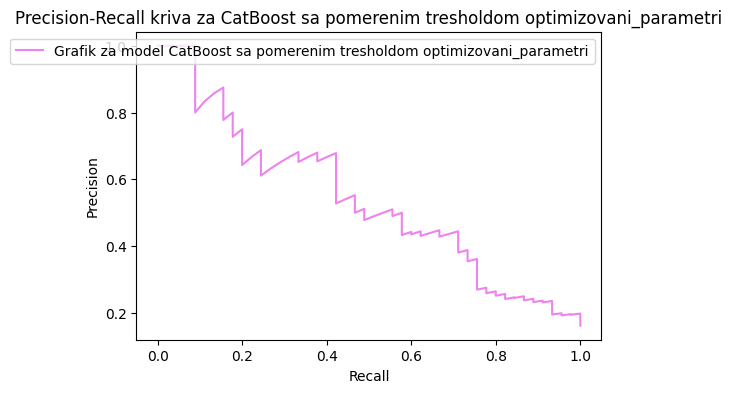

In [183]:
best_model_cb, best_params_cb, table_out_cb, table_out_cb_tr= treniranje_i_tjunovanje(cb.CatBoostClassifier(silent=True), param_grids['CatBoost'], "CatBoost")
red_new= pd.DataFrame([{
"Ime modela": "CatBoost",
"Accuracy":table_out_cb[0],
"Precision":table_out_cb[1],
"Recall" :table_out_cb[2],
"F1-score" :table_out_cb[3],
"ROC_AUC_SCORE":table_out_cb[4],
"KrosvalidacioniScore":table_out_cb[5],
"FALSE NEGATIVI":table_out_cb[6],
"HIPERPARAMETRIZACIJA":table_out_cb[7],
"NAJBOLJI PARAMETRI":table_out_cb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_cb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_cb_tr[0],
"Accuracy":table_out_cb_tr[1],
"Precision":table_out_cb_tr[2],
"Recall" :table_out_cb_tr[3],
"F1-score" :table_out_cb_tr[4],
"ROC_AUC_SCORE":table_out_cb_tr[5],
"FALSE NEGATIVI":table_out_cb_tr[6],
"treshold":table_out_cb_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

In [ ]:
#best_params_svc = treniranje_i_tjunovanje(SVC(probability=True), param_grids['SVC'], "Support Vector Machine")

Treniranje modela Naive Bayes nakon optimizacije parametara 
Krosvalidacioni scopre:  78.22%
ROC_AUC Score :  80.70%


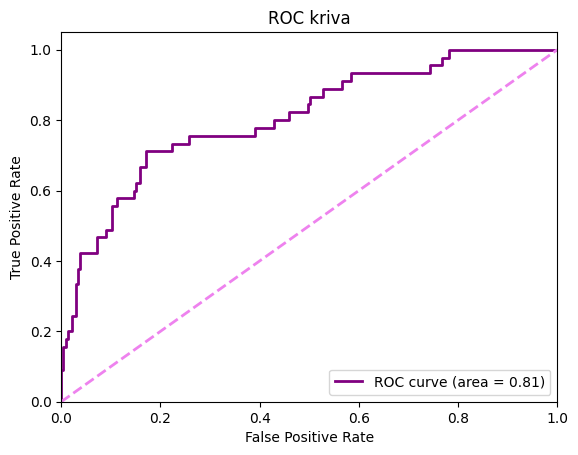

################ METRIKE ZA MODEL Naive Bayes sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.46402877697841727
#################################
Precision (Preciznost): 0.22340425531914893
#################################
Recall(odziv): 0.9333333333333333
###############################
F1 Score: 0.3605150214592275
ROC AUC: 0.806962327134001
Confusion Matrix (matrica konfuzije):
[[ 87 146]
 [  3  42]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.97      0.37      0.54       233
           1       0.22      0.93      0.36        45

    accuracy                           0.46       278
   macro avg       0.60      0.65      0.45       278
weighted avg       0.85      0.46      0.51       278




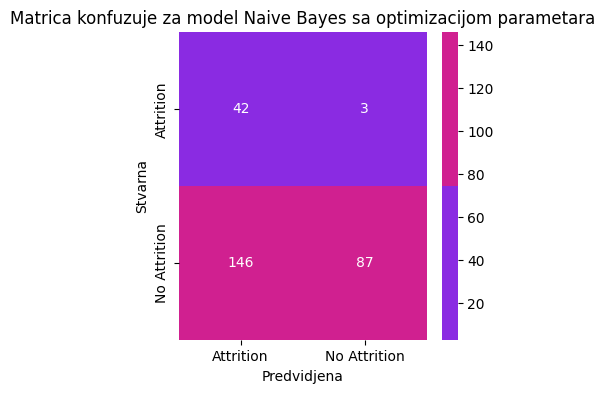

              precision    recall  f1-score   support

           0       0.97      0.37      0.54       233
           1       0.22      0.93      0.36        45

    accuracy                           0.46       278
   macro avg       0.60      0.65      0.45       278
weighted avg       0.85      0.46      0.51       278



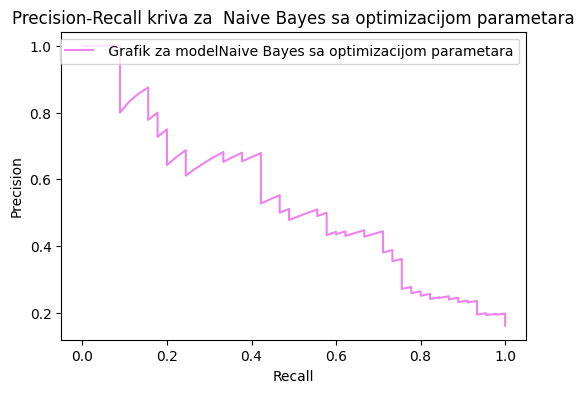

Model nema podržanu značajnost attributa
#################################
Accuracy (Tačnost): 0.5863
#################################
Precision (Preciznost): 0.2535
#################################
Recall (Odziv): 0.8000
###############################
F1 Score: 0.3850
ROC AUC: 0.8066
#################################
Confusion Matrix (Matrica konfuzije):
[[127 106]
 [  9  36]]
#################################
Classification Report (Klasifikacioni izveštaj):
              precision    recall  f1-score   support

           0       0.93      0.55      0.69       233
           1       0.25      0.80      0.39        45

    accuracy                           0.59       278
   macro avg       0.59      0.67      0.54       278
weighted avg       0.82      0.59      0.64       278




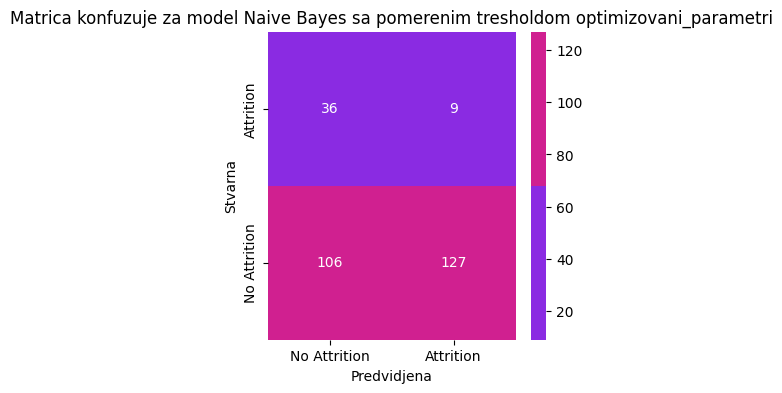

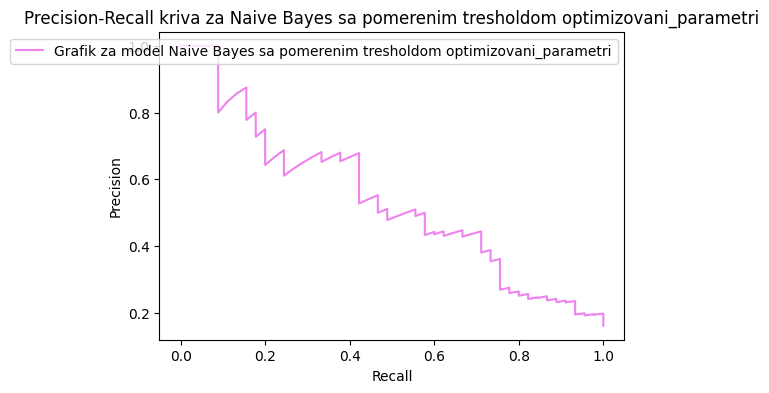

In [184]:
best_model,best_params_NB, table_out_nb ,table_out_nb_tr= treniranje_i_tjunovanje(GaussianNB(), param_grids['Naive Bayes'], "Naive Bayes")
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":table_out_nb[0],
"Precision":table_out_nb[1],
"Recall" :table_out_nb[2],
"F1-score" :table_out_nb[3],
"ROC_AUC_SCORE":table_out_nb[4],
"KrosvalidacioniScore":table_out_nb[5],
"FALSE NEGATIVI":table_out_nb[6],
"HIPERPARAMETRIZACIJA":table_out_nb[7],
"NAJBOLJI PARAMETRI":table_out_nb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_nb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)



rew_new_tr=pd.DataFrame([{
"Ime modela":table_out_nb_tr[0],
"Accuracy":table_out_nb_tr[1],
"Precision":table_out_nb_tr[2],
"Recall" :table_out_nb_tr[3],
"F1-score" :table_out_nb_tr[4],
"ROC_AUC_SCORE":table_out_nb_tr[5],
"FALSE NEGATIVI":table_out_nb_tr[6],
"treshold":table_out_nb_tr[7]

}])
REZULTATI_TABELA_treshold = pd.concat([REZULTATI_TABELA_treshold, rew_new_tr], ignore_index=True)

In [185]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False)

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
17,LightGBM,0.881295,0.730769,0.422222,0.535211,0.813925,0.964682,26,yes,"{'colsample_bytree': 0.6, 'learning_rate': 0.0...","[TotalWorkingYears, Age, MonthlyIncome]"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"['JobSatisfaction', 'BusinessTravel_Travel_Fre..."
12,Random Forest,0.877698,0.720000,0.400000,0.514286,0.810443,0.962599,27,yes,"{'max_depth': None, 'min_samples_leaf': 1, 'n_...","[Age, MonthlyIncome, MaritalStatus_Single]"
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"['BusinessTravel_Travel_Frequently', 'OverTime..."
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"['MonthlyIncome', 'BusinessTravel_Travel_Frequ..."
13,Gradient Boosting,0.874101,0.692308,0.400000,0.507042,0.808298,0.968482,27,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'min_sa...","[Age, MonthlyIncome, MaritalStatus_Single]"
10,Logistic Regression,0.784173,0.388060,0.577778,0.464286,0.807344,0.865690,19,yes,"{'C': 100, 'solver': 'liblinear'}","[BusinessTravel_Travel_Frequently, OverTime, M..."
19,Naive Bayes,0.464029,0.223404,0.933333,0.360515,0.806962,0.782237,3,yes,{'var_smoothing': 1e-06},[]
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]
16,XGBoost,0.881295,0.714286,0.444444,0.547945,0.804483,0.963095,25,yes,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...","[BusinessTravel_Travel_Frequently, JobRole_Res..."


In [186]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("RESULTFINAL_ALL.xlsx")

In [187]:
REZULTATI_TABELA_treshold.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("RESULTFINAL_ALL_treshold.xlsx")

In [188]:
print("NAJBOLJI PARAMETRI ZA Logistic Regression:", best_params_lr)
print("NAJBOLJI PARAMETRI ZA  Decision Tree:", best_params_dt)
print("NAJBOLJI PARAMETRI ZA  Random Forest:", best_params_rf)
print("NAJBOLJI PARAMETRI ZA Gradient Boosting:", best_params_gb)
print("NAJBOLJI PARAMETRI ZA  AdaBoost:", best_params_ab)
print("NAJBOLJI PARAMETRI ZA  Bagging:", best_params_bg)
print("NAJBOLJI PARAMETRI ZA  XGBoost:", best_params_xgb)
print("NAJBOLJI PARAMETRI ZA  LightGBM:", best_params_lgb)
print("NAJBOLJI PARAMETRI ZA  CatBoost:", best_params_cb)
#print("NAJBOLJI PARAMETRI ZA  Support Vector Machine:", best_params_svc)
print("NAJBOLJI PARAMETRI ZA Naive Bayes:", best_params_NB)

NAJBOLJI PARAMETRI ZA Logistic Regression: {'C': 100, 'solver': 'liblinear'}
NAJBOLJI PARAMETRI ZA  Decision Tree: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5}
NAJBOLJI PARAMETRI ZA  Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 500, 'subsample': 0.8}
NAJBOLJI PARAMETRI ZA  AdaBoost: {'learning_rate': 1, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  Bagging: {'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA  XGBoost: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 500, 'subsample': 0.8}
NAJBOLJI PARAMETRI ZA  LightGBM: {'colsample_bytree': 0.6, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 40, 'n_estimators': 500, 'num_leaves': 35, 'subsample': 0.8}
NAJBOLJI PARAMETRI ZA  CatBoost: {'border_c

In [189]:
def inverse_transform_test_set(x_test, min_max_scalers):
    X_test_inv = x_test.copy()
    
    # for col, le in label_encoders.items():
    #     X_test_inv[col] = le.inverse_transform(X_test_inv[col])
    
    ##### for col, scaler in standard_scalers.items():
    #    ## X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    for col, scaler in min_max_scalers.items():
        X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    return X_test_inv

In [190]:
x_test.columns

Index(['Age', 'EnvironmentSatisfaction', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'OverTime', 'StockOptionLevel', 'TotalWorkingYears',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'Department_Sales',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Sales Representative', 'MaritalStatus_Married',
       'MaritalStatus_Single'],
      dtype='object')

In [191]:
x_train.columns

Index(['Age', 'EnvironmentSatisfaction', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'OverTime', 'StockOptionLevel', 'TotalWorkingYears',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'Department_Sales',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Sales Representative', 'MaritalStatus_Married',
       'MaritalStatus_Single'],
      dtype='object')

In [192]:
label_encoders

{'Gender': LabelEncoder(), 'OverTime': LabelEncoder()}

In [193]:
x_test.head()

,Age,EnvironmentSatisfaction,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,Department_Sales,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
930,41,4,2,4,0.235449,1,2,0.352941,0.24,0.133333,0.214286,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
199,51,2,3,2,0.606369,0,2,0.470588,0.40,0.600000,0.500000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1361,56,4,1,3,0.070244,0,1,0.411765,0.40,0.600000,0.571429,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
861,25,3,1,4,0.005757,1,0,0.029412,0.04,0.000000,0.000000,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
387,42,1,2,3,0.187335,0,1,0.558824,0.20,0.266667,0.142857,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [194]:
X_test_inv = inverse_transform_test_set(x_test, min_max_scalers)


In [ ]:
standard_scalers

{}

In [195]:
X_test_inv

,Age,EnvironmentSatisfaction,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,Department_Sales,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
930,41,4,2,4,3.296292,1,2,4.941176,3.36,1.866667,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
199,51,2,3,2,8.489173,0,2,6.588235,5.60,8.400000,7.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1361,56,4,1,3,0.983416,0,1,5.764706,5.60,8.400000,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
861,25,3,1,4,0.080596,1,0,0.411765,0.56,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
387,42,1,2,3,2.622689,0,1,7.823529,2.80,3.733333,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,29,2,3,1,6.633252,0,1,4.117647,5.60,8.400000,8.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
158,32,3,1,3,1.500264,0,0,3.294118,2.80,3.733333,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
402,30,3,1,4,1.149783,0,0,4.941176,6.16,6.533333,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1104,36,2,3,1,5.175135,0,2,3.705882,1.68,1.866667,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [196]:
y_test

930     0
199     0
1361    1
861     1
387     0
       ..
15      0
158     0
402     0
1104    0
1256    0
Name: Attrition, Length: 278, dtype: int32

In [ ]:
pip install shap

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [197]:
import shap

In [198]:
def shap_analysis(model, model_name, X_test, X_test_inv):
    if isinstance(model, (DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier, xgb.XGBClassifier, lgb.LGBMClassifier, cb.CatBoostClassifier)):
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_test)
    else:
        explainer = shap.KernelExplainer(model.predict, X_test)
        shap_values = explainer.shap_values(X_test, nsamples=100)
    
    shap.initjs()
    shap.summary_plot(shap_values, X_test_inv, feature_names=X_test.columns)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values[1], X_test_inv[X_test_inv.columns].iloc[[1]])
    
    shap.force_plot(explainer.expected_value, shap_values[3], X_test_inv[X_test_inv.columns].iloc[[3]])

Using 278 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/278 [00:00<?, ?it/s]

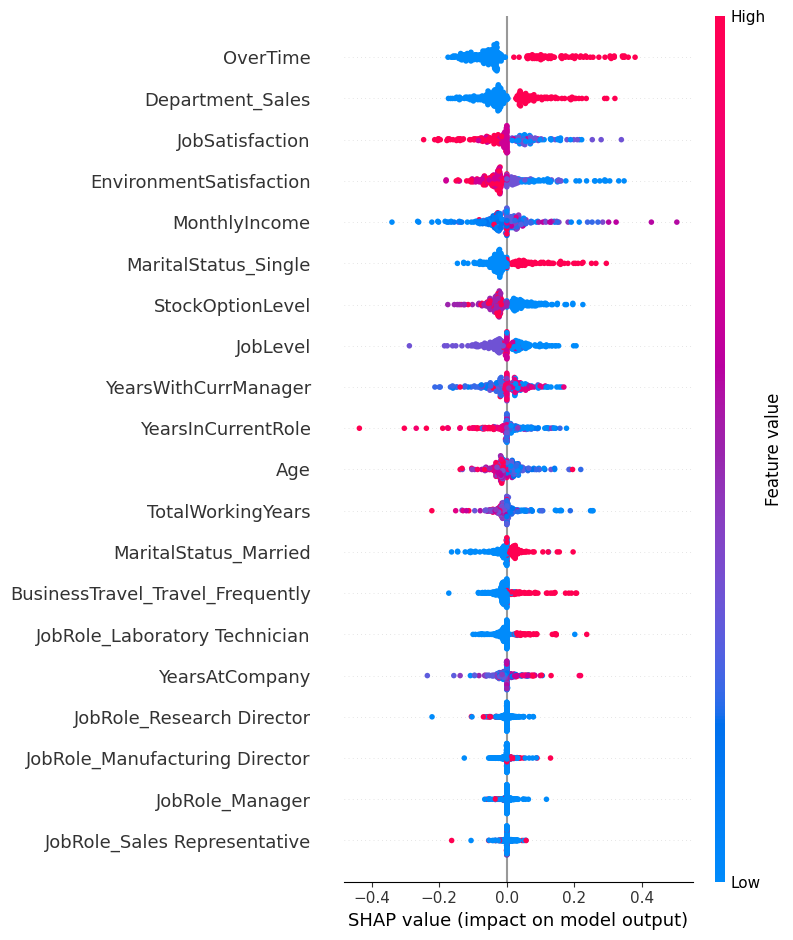

In [199]:
shap_analysis(best_model_ab,"Ada Boost",x_test, X_test_inv)

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\shap\explainers\_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


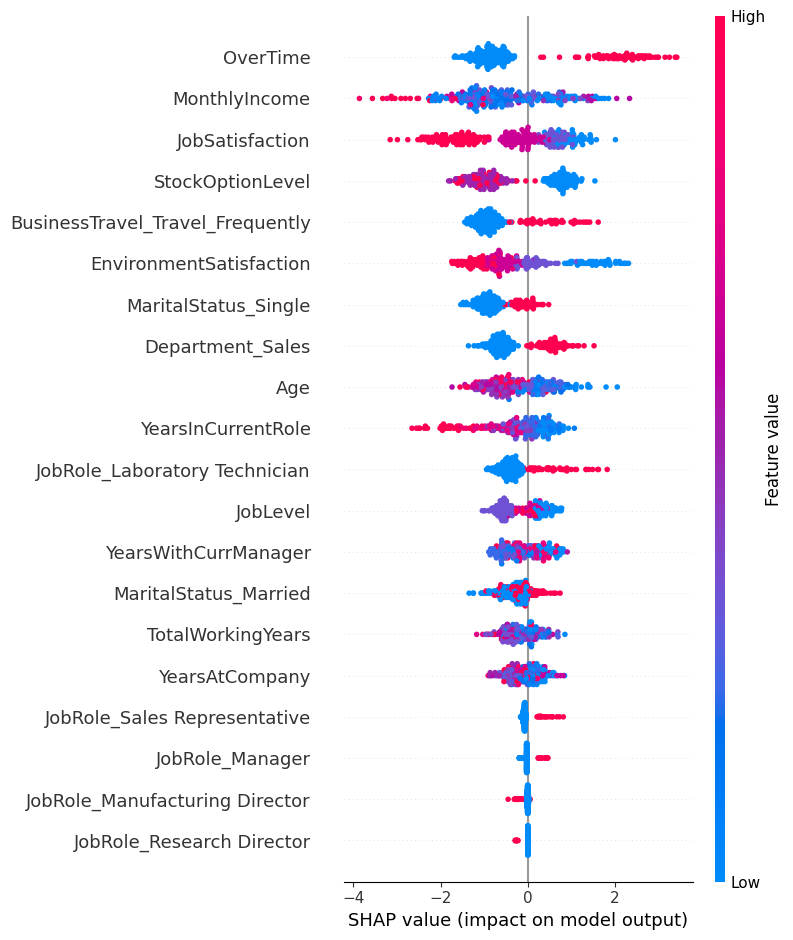

In [200]:
shap_analysis(best_model_lgb,"LightGBM",x_test, X_test_inv)

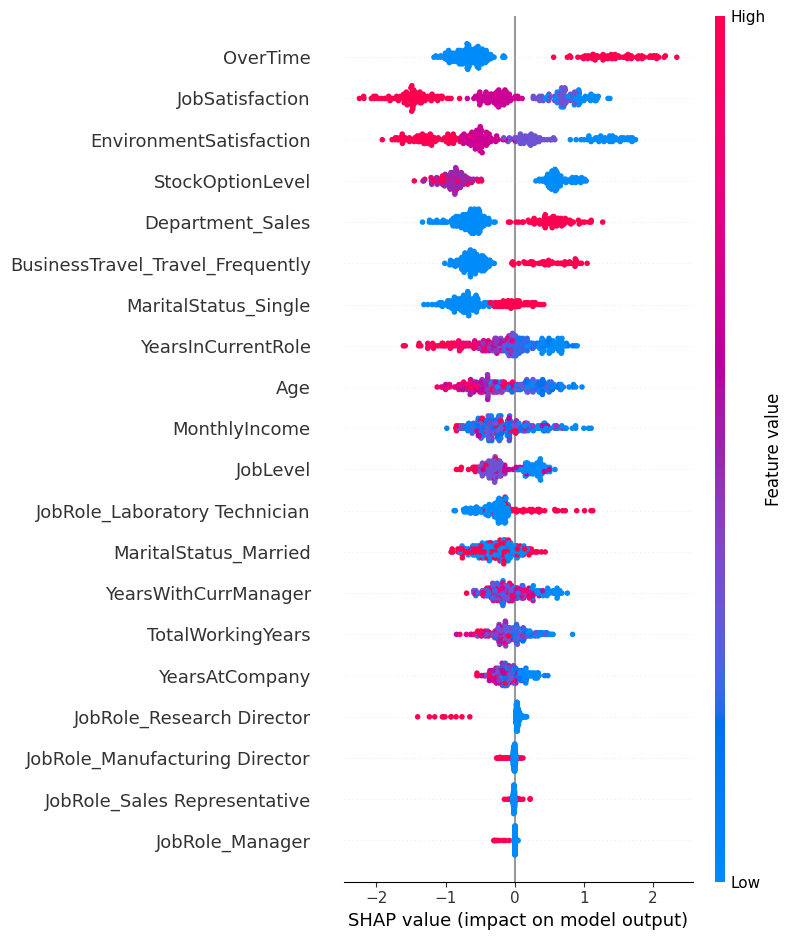

In [201]:
shap_analysis(best_model_cb,"CatBoost",x_test, X_test_inv)

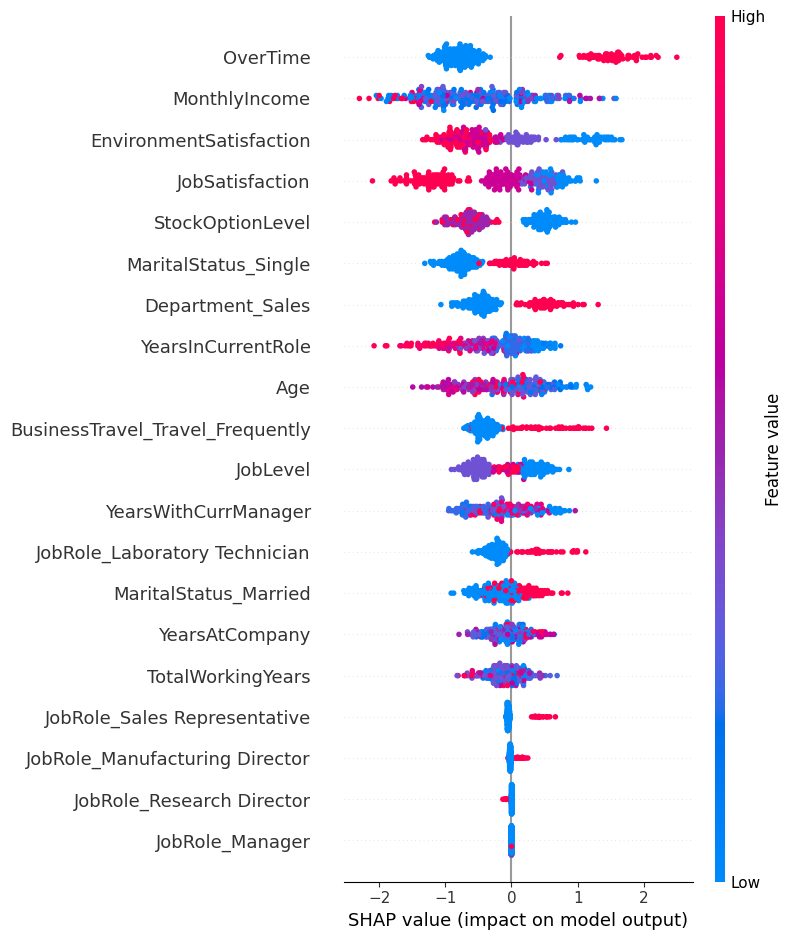

In [202]:
shap_analysis(best_model_xgb,"XGBoost", x_test,X_test_inv)

In [ ]:
best_model_lr

LogisticRegression(C=100, solver='liblinear')

In [ ]:
best_model_lgb

LGBMClassifier(feature_fraction=0.8, learning_rate=0.25, min_data_in_leaf=20,
               n_estimators=80, num_leaves=62)

In [203]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False)

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
17,LightGBM,0.881295,0.730769,0.422222,0.535211,0.813925,0.964682,26,yes,"{'colsample_bytree': 0.6, 'learning_rate': 0.0...","[TotalWorkingYears, Age, MonthlyIncome]"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"['JobSatisfaction', 'BusinessTravel_Travel_Fre..."
12,Random Forest,0.877698,0.720000,0.400000,0.514286,0.810443,0.962599,27,yes,"{'max_depth': None, 'min_samples_leaf': 1, 'n_...","[Age, MonthlyIncome, MaritalStatus_Single]"
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"['BusinessTravel_Travel_Frequently', 'OverTime..."
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"['MonthlyIncome', 'BusinessTravel_Travel_Frequ..."
13,Gradient Boosting,0.874101,0.692308,0.400000,0.507042,0.808298,0.968482,27,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'min_sa...","[Age, MonthlyIncome, MaritalStatus_Single]"
10,Logistic Regression,0.784173,0.388060,0.577778,0.464286,0.807344,0.865690,19,yes,"{'C': 100, 'solver': 'liblinear'}","[BusinessTravel_Travel_Frequently, OverTime, M..."
19,Naive Bayes,0.464029,0.223404,0.933333,0.360515,0.806962,0.782237,3,yes,{'var_smoothing': 1e-06},[]
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]
16,XGBoost,0.881295,0.714286,0.444444,0.547945,0.804483,0.963095,25,yes,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...","[BusinessTravel_Travel_Frequently, JobRole_Res..."


In [204]:
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

logistic_regression = LogisticRegression()
decision_tree = DecisionTreeClassifier()

voting_clf = VotingClassifier(estimators=[
    ('lr', model_lr), 
     ('bestlgm', best_model_lgb), ('bagging', best_model_bg), ('xgb', best_model_xgb), ('catboost', best_model_cb)],
    voting='soft')

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 786, number of negative: 925
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1300
[LightGBM] [Info] Number of data points in the train set: 1711, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459380 -> initscore=-0.162837
[LightGBM] [Info] Start training from score -0.162837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


########### MODEL Voting ###########
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1187
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1013
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1010
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1194
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1177
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1189
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1016
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1008
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1194
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1188
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1019
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1187
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1009
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1183
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1184
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1025
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1183
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1016
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1182
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1180
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1187
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1013
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1010
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1194
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1177
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1189
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1016
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1008
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1194
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1188
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1019
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1187
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1009
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1183
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459389 -> initscore=-0.162802
[LightGBM] [Info] Start training from score -0.162802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1184
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1025
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 708, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1183
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459740 -> initscore=-0.161388
[LightGBM] [Info] Start training from score -0.161388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1016
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1182
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1180
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 707, number of negative: 833
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459091 -> initscore=-0.164003
[LightGBM] [Info] Start training from score -0.164003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Krosvalidacioni scopre:  96.75%
ROC_AUC Score :  81.87%


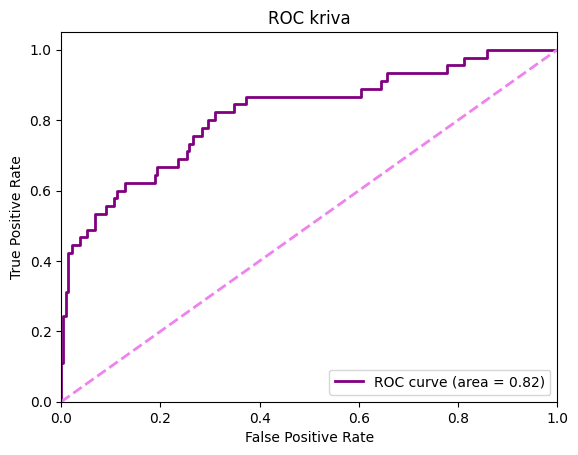

#################################
Accuracy (Tačnost): 0.8884892086330936
#################################
Precision (Preciznost): 0.7692307692307693
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5633802816901408
ROC AUC: 0.8186933714830711
Confusion Matrix (matrica konfuzije):
[[227   6]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.97      0.94       233
           1       0.77      0.44      0.56        45

    accuracy                           0.89       278
   macro avg       0.84      0.71      0.75       278
weighted avg       0.88      0.89      0.88       278




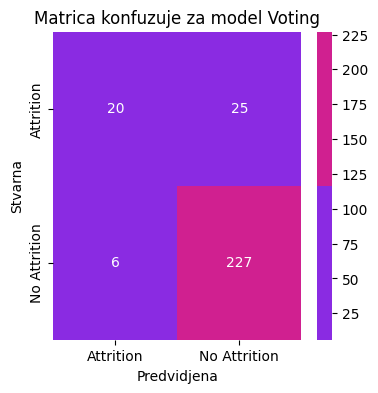

              precision    recall  f1-score   support

           0       0.90      0.97      0.94       233
           1       0.77      0.44      0.56        45

    accuracy                           0.89       278
   macro avg       0.84      0.71      0.75       278
weighted avg       0.88      0.89      0.88       278



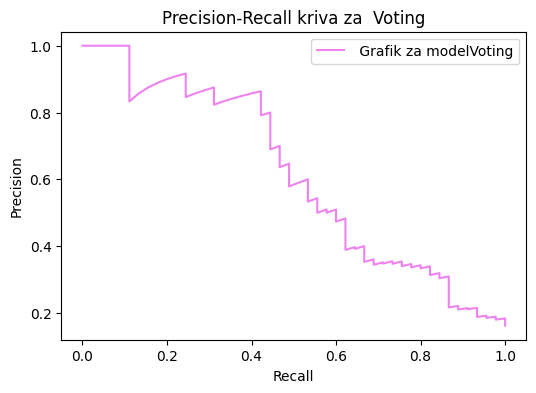

Model nema podržanu značajnost attributa


In [205]:
voting_clf.fit(x_train, y_train)
y_pred_VC = voting_clf.predict(x_test)
y_pred_prob_VC = voting_clf.predict_proba(x_test)[:, 1]

print("########### MODEL Voting ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(voting_clf, x_train,y_train,x_test, y_test,y_pred_VC, y_pred_prob_VC)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Voting", y_test,y_pred_VC, y_pred_prob_VC)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(voting_clf, "Voting", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Voting",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [206]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("RESULTSFINALWithVoting.xlsx")

In [208]:
print("andjela")

andjela


In [207]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False)

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
20,Voting,0.888489,0.769231,0.444444,0.563380,0.818693,0.967434,25,NO,NONE,[]
17,LightGBM,0.881295,0.730769,0.422222,0.535211,0.813925,0.964682,26,yes,"{'colsample_bytree': 0.6, 'learning_rate': 0.0...","[TotalWorkingYears, Age, MonthlyIncome]"
3,Gradient Boosting,0.874101,0.678571,0.422222,0.520548,0.810730,0.950307,26,NO,NONE,"['JobSatisfaction', 'BusinessTravel_Travel_Fre..."
12,Random Forest,0.877698,0.720000,0.400000,0.514286,0.810443,0.962599,27,yes,"{'max_depth': None, 'min_samples_leaf': 1, 'n_...","[Age, MonthlyIncome, MaritalStatus_Single]"
8,Cat Boost,0.852518,0.566667,0.377778,0.453333,0.809824,0.965635,28,NO,NONE,"['MonthlyIncome', 'BusinessTravel_Travel_Frequ..."
0,Logisticka regresija,0.791367,0.402985,0.600000,0.482143,0.809824,0.862759,18,NO,NONE,"['BusinessTravel_Travel_Frequently', 'OverTime..."
13,Gradient Boosting,0.874101,0.692308,0.400000,0.507042,0.808298,0.968482,27,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'min_sa...","[Age, MonthlyIncome, MaritalStatus_Single]"
10,Logistic Regression,0.784173,0.388060,0.577778,0.464286,0.807344,0.865690,19,yes,"{'C': 100, 'solver': 'liblinear'}","[BusinessTravel_Travel_Frequently, OverTime, M..."
19,Naive Bayes,0.464029,0.223404,0.933333,0.360515,0.806962,0.782237,3,yes,{'var_smoothing': 1e-06},[]
9,Naive Bayes,0.370504,0.196262,0.933333,0.324324,0.806581,0.782155,3,NO,NONE,[]
